<a href="https://colab.research.google.com/github/ujjwalbb30/DATA_602_Twitter_Sentiment_Analysis_Stock_Market_Prediction/blob/main/python_notebooks/Step_5_predictive_modeling_baseline.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Predicting Stock Prices**
## Now that we have merged stock prices and tweet sentiment values dataframe, we will try to predict the stock prices with different models and choose the best one among them.

## We will create separate predictive model for open_value, close_value, low_value and high_value for each company.

In [ ]:
# installing lazypredict
# !pip install lazypredict

In [ ]:
# importing required dependencies
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import math
from keras.models import Sequential
from keras.layers import Dense
from keras.layers import LSTM
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error

In [ ]:
from google.colab import drive 
drive.mount('/content/gdrive')

Mounted at /content/gdrive


## **For Apple**

In [ ]:
# importing the datasets
# same day
apple_sm_ts_same = pd.read_csv('/content/gdrive/MyDrive/DATA_602_Project/datasets/Apple/apple_sm_ts_same.csv')

# previous day
apple_sm_ts_prev = pd.read_csv('/content/gdrive/MyDrive/DATA_602_Project/datasets/Apple/apple_sm_ts_prev.csv')

# last 3 days
apple_sm_ts_3d = pd.read_csv('/content/gdrive/MyDrive/DATA_602_Project/datasets/Apple/apple_sm_ts_3d.csv')

### **LSTM model for predicting stock prices**

**Using Same Day tweets and stock market data**

In [ ]:
# viewng info of the dataframe before setting the index
print('info of the dataframe before changing the index:\n')
print(apple_sm_ts_same.info())

info of the dataframe before changing the index:

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1826 entries, 0 to 1825
Data columns (total 18 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   date           1826 non-null   object 
 1   ticker_symbol  1826 non-null   object 
 2   clean_text     1826 non-null   object 
 3   comment_num    1826 non-null   int64  
 4   retweet_num    1826 non-null   int64  
 5   like_num       1826 non-null   int64  
 6   polarity       1826 non-null   float64
 7   subjectivity   1826 non-null   float64
 8   neg            1826 non-null   float64
 9   neu            1826 non-null   float64
 10  pos            1826 non-null   float64
 11  compound       1826 non-null   float64
 12  sentiment      1826 non-null   object 
 13  volume         1826 non-null   int64  
 14  open_value     1826 non-null   float64
 15  close_value    1826 non-null   float64
 16  low_value      1826 non-null   float64
 17  hi

In [ ]:
# changing the index to datetime column and viewing the info again
apple_sm_ts_same.set_index('date',inplace=True,drop=True)
print('info of the dataframe after changing the index:\n')
print(apple_sm_ts_same.info())

info of the dataframe after changing the index:

<class 'pandas.core.frame.DataFrame'>
Index: 1826 entries, 2015-01-01 to 2019-12-31
Data columns (total 17 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   ticker_symbol  1826 non-null   object 
 1   clean_text     1826 non-null   object 
 2   comment_num    1826 non-null   int64  
 3   retweet_num    1826 non-null   int64  
 4   like_num       1826 non-null   int64  
 5   polarity       1826 non-null   float64
 6   subjectivity   1826 non-null   float64
 7   neg            1826 non-null   float64
 8   neu            1826 non-null   float64
 9   pos            1826 non-null   float64
 10  compound       1826 non-null   float64
 11  sentiment      1826 non-null   object 
 12  volume         1826 non-null   int64  
 13  open_value     1826 non-null   float64
 14  close_value    1826 non-null   float64
 15  low_value      1826 non-null   float64
 16  high_value     1826 non-null   float6

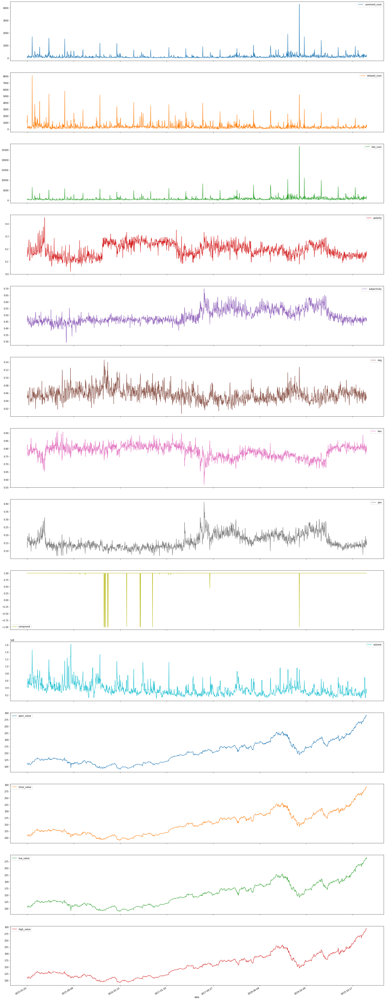

In [ ]:
# getting the columns of interest
col_intr = ['comment_num','retweet_num','like_num','polarity','subjectivity','neg','neu','pos','compound','sentiment','volume','open_value','close_value','low_value','high_value']


apple_sm_ts_same[col_intr].plot(subplots=True,figsize=(30,90))
plt.show()

In [ ]:
# defining a function to convert our dataframe to required input format
def data_to_input(data, n_in=1, n_out=1, dropnan=True):
  df = data
  c_n = list(df.columns)
  pred_cols = ['open_value','close_value','low_value','high_value']
  cols, names = list(), list()
  # creating the input sequence data from (t-n) to (t-1) i.e. (t-n, ... t-1)
  for i in range(n_in, 0, -1):
    cols.append(df.shift(i))
    names += [('%s(t-%d)' % (col,i)) for col in c_n]
  # creating the forecast sequence data from (t) to (t+n) i.e. (t, t+1, ... t+n)
  for i in range(0, n_out):
    cols.append(df[pred_cols].shift(-i))
    if i == 0:
      names += [('%s(t)' % (col)) for col in pred_cols]
    else:
      names += [('%s(t+%d)' % (col,i)) for col in pred_cols]
  # preparing the final dataframe
  final_df = pd.concat(cols, axis=1)
  final_df.columns = names
  # dropping rows with NaN values
  if dropnan:
    final_df.dropna(inplace=True)
  return final_df

In [ ]:
pd.options.display.float_format = "{:,.6f}".format

In [ ]:
# preparing the required input data for the model
apple_input_same = apple_sm_ts_same[['pos','neg','subjectivity','open_value','close_value','low_value','high_value']].copy()

# normalizing the features dataframe
scaler_same_apple = MinMaxScaler(feature_range=(0, 1))
scaled_apple_input_same = pd.DataFrame(scaler_same_apple.fit_transform(apple_input_same.values),columns=['pos','neg','subjectivity','open_value','close_value','low_value','high_value'])
# getting the final input dataframe
apple_input_same_final = data_to_input(scaled_apple_input_same,1,1)

# viewing the prepared final input dataframe
display(apple_input_same_final)

,pos(t-1),neg(t-1),subjectivity(t-1),open_value(t-1),close_value(t-1),low_value(t-1),high_value(t-1),open_value(t),close_value(t),low_value(t),high_value(t)
1,0.256560,0.302158,0.433459,0.113465,0.098569,0.103674,0.106080,0.106354,0.093404,0.089378,0.097726
2,0.151603,0.345324,0.374626,0.106354,0.093404,0.089378,0.097726,0.106354,0.093404,0.089378,0.097726
3,0.329446,0.287770,0.498904,0.106354,0.093404,0.089378,0.097726,0.106354,0.093404,0.089378,0.097726
4,0.364431,0.280576,0.494935,0.106354,0.093404,0.089378,0.097726,0.090941,0.078255,0.079680,0.083935
5,0.288630,0.381295,0.423164,0.090941,0.078255,0.079680,0.083935,0.082239,0.078304,0.075781,0.077904
...,...,...,...,...,...,...,...,...,...,...,...
1821,0.233236,0.359712,0.436506,0.968675,0.981604,0.975906,0.980277,1.000000,0.981063,0.993002,1.000000
1822,0.262391,0.374101,0.393404,1.000000,0.981063,0.993002,1.000000,1.000000,0.981063,0.993002,1.000000
1823,0.198251,0.266187,0.429691,1.000000,0.981063,0.993002,1.000000,1.000000,0.981063,0.993002,1.000000
1824,0.215743,0.287770,0.445280,1.000000,0.981063,0.993002,1.000000,0.991746,0.989523,0.978505,0.993673


In [ ]:
# splitting the data into training and testing set (0.7 and 0.3)
# defining the number of instances in training and testing set
train_size = int(0.7*len(apple_input_same_final))
test_size = int(len(apple_input_same_final)-train_size)
print('Number of instances in training set (70%):\n',train_size)
print('Number of instances in testing set (30%):\n',test_size)

# getting the values from dataframes
# for open_value
values_same_ov = apple_input_same_final[['pos(t-1)','neg(t-1)','subjectivity(t-1)','open_value(t-1)','open_value(t)']].values
train_dataset_same_ov = values_same_ov[:train_size, :]
test_dataset_same_ov = values_same_ov[train_size:, :]

# for close_value
values_same_cv = apple_input_same_final[['pos(t-1)','neg(t-1)','subjectivity(t-1)','close_value(t-1)','close_value(t)']].values
train_dataset_same_cv = values_same_cv[:train_size, :]
test_dataset_same_cv = values_same_cv[train_size:, :]

# for low_value
values_same_lv = apple_input_same_final[['pos(t-1)','neg(t-1)','subjectivity(t-1)','low_value(t-1)','low_value(t)']].values
train_dataset_same_lv = values_same_lv[:train_size, :]
test_dataset_same_lv = values_same_lv[train_size:, :]

# for high_value
values_same_hv = apple_input_same_final[['pos(t-1)','neg(t-1)','subjectivity(t-1)','high_value(t-1)','high_value(t)']].values
train_dataset_same_hv = values_same_hv[:train_size, :]
test_dataset_same_hv = values_same_hv[train_size:, :]


# splitting the train and test datasets into input features and output values
# for open_value
xtrain_same_ov, ytrain_same_ov = train_dataset_same_ov[:,0:4], train_dataset_same_ov[:,4]
xtest_same_ov, ytest_same_ov = test_dataset_same_ov[:,0:4], test_dataset_same_ov[:,4]
# for close_value
xtrain_same_cv, ytrain_same_cv = train_dataset_same_cv[:,0:4], train_dataset_same_cv[:,4]
xtest_same_cv, ytest_same_cv = test_dataset_same_cv[:,0:4], test_dataset_same_cv[:,4]
# for low_value
xtrain_same_lv, ytrain_same_lv = train_dataset_same_lv[:,0:4], train_dataset_same_lv[:,4]
xtest_same_lv, ytest_same_lv = test_dataset_same_lv[:,0:4], test_dataset_same_lv[:,4]
# for high_value
xtrain_same_hv, ytrain_same_hv = train_dataset_same_hv[:,0:4], train_dataset_same_hv[:,4]
xtest_same_hv, ytest_same_hv = test_dataset_same_hv[:,0:4], test_dataset_same_hv[:,4]



# reshaping input features in 3D format [samples, timesteps, features]
# for open_value
x_train_same_ov = xtrain_same_ov.reshape((xtrain_same_ov.shape[0], 1, xtrain_same_ov.shape[1]))
x_test_same_ov = xtest_same_ov.reshape((xtest_same_ov.shape[0], 1, xtest_same_ov.shape[1]))
print('\nfor open_value:\n')
print(x_train_same_ov.shape, ytrain_same_ov.shape, x_test_same_ov.shape, ytest_same_ov.shape)

# for close_value
x_train_same_cv = xtrain_same_cv.reshape((xtrain_same_cv.shape[0], 1, xtrain_same_cv.shape[1]))
x_test_same_cv = xtest_same_cv.reshape((xtest_same_cv.shape[0], 1, xtest_same_cv.shape[1]))
print('\nfor close_value:\n')
print(x_train_same_cv.shape, ytrain_same_cv.shape, x_test_same_cv.shape, ytest_same_cv.shape)

# for low_value
x_train_same_lv = xtrain_same_lv.reshape((xtrain_same_lv.shape[0], 1, xtrain_same_lv.shape[1]))
x_test_same_lv = xtest_same_lv.reshape((xtest_same_lv.shape[0], 1, xtest_same_lv.shape[1]))
print('\nfor low_value:\n')
print(x_train_same_lv.shape, ytrain_same_lv.shape, x_test_same_lv.shape, ytest_same_lv.shape)

# for open_value
x_train_same_hv = xtrain_same_hv.reshape((xtrain_same_hv.shape[0], 1, xtrain_same_hv.shape[1]))
x_test_same_hv = xtest_same_hv.reshape((xtest_same_hv.shape[0], 1, xtest_same_hv.shape[1]))
print('\nfor high_value:\n')
print(x_train_same_hv.shape, ytrain_same_hv.shape, x_test_same_hv.shape, ytest_same_hv.shape)

Number of instances in training set (70%):
 1277
Number of instances in testing set (30%):
 548

for open_value:

(1277, 1, 4) (1277,) (548, 1, 4) (548,)

for close_value:

(1277, 1, 4) (1277,) (548, 1, 4) (548,)

for low_value:

(1277, 1, 4) (1277,) (548, 1, 4) (548,)

for high_value:

(1277, 1, 4) (1277,) (548, 1, 4) (548,)


In [ ]:
# Defining the LSTM model
# for open_value
model_same_apple_ov = Sequential()
model_same_apple_ov.add(LSTM(50, input_shape=(x_train_same_ov.shape[1], x_train_same_ov.shape[2])))
model_same_apple_ov.add(Dense(1))
model_same_apple_ov.compile(loss='mae', optimizer='adam')
model_same_apple_ov.build(input_shape=(x_train_same_ov.shape[1], x_train_same_ov.shape[2])) 

# viewing the summary of the model
print('sequential model for Apple Open values:\n')
model_same_apple_ov.summary()

# for close_value
model_same_apple_cv = Sequential()
model_same_apple_cv.add(LSTM(50, input_shape=(x_train_same_cv.shape[1], x_train_same_cv.shape[2])))
model_same_apple_cv.add(Dense(1))
model_same_apple_cv.compile(loss='mae', optimizer='adam')
model_same_apple_cv.build(input_shape=(x_train_same_cv.shape[1], x_train_same_cv.shape[2])) 

# viewing the summary of the model
print('\nsequential model for Apple Close values:\n')
model_same_apple_cv.summary()

# for low_value
model_same_apple_lv = Sequential()
model_same_apple_lv.add(LSTM(50, input_shape=(x_train_same_lv.shape[1], x_train_same_lv.shape[2])))
model_same_apple_lv.add(Dense(1))
model_same_apple_lv.compile(loss='mae', optimizer='adam')
model_same_apple_lv.build(input_shape=(x_train_same_lv.shape[1], x_train_same_lv.shape[2])) 

# viewing the summary of the model
print('\nsequential model for Apple Low values:\n')
model_same_apple_lv.summary()

# for open_value
model_same_apple_hv = Sequential()
model_same_apple_hv.add(LSTM(50, input_shape=(x_train_same_hv.shape[1], x_train_same_hv.shape[2])))
model_same_apple_hv.add(Dense(1))
model_same_apple_hv.compile(loss='mae', optimizer='adam')
model_same_apple_hv.build(input_shape=(x_train_same_hv.shape[1], x_train_same_hv.shape[2])) 

# viewing the summary of the model
print('\nsequential model for Apple High values:\n')
model_same_apple_hv.summary()

sequential model for Apple Open values:

Model: "sequential_4"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_4 (LSTM)               (None, 50)                11000     
                                                                 
 dense_4 (Dense)             (None, 1)                 51        
                                                                 
Total params: 11,051
Trainable params: 11,051
Non-trainable params: 0
_________________________________________________________________

sequential model for Apple Close values:

Model: "sequential_5"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_5 (LSTM)               (None, 50)                11000     
                                                                 
 dense_5 (Dense)             (None, 1)                 51        
          

**For open_value**

Epoch 1/50
18/18 - 3s - loss: 0.1552 - val_loss: 0.4312 - 3s/epoch - 147ms/step
Epoch 2/50
18/18 - 0s - loss: 0.1033 - val_loss: 0.3486 - 97ms/epoch - 5ms/step
Epoch 3/50
18/18 - 0s - loss: 0.0959 - val_loss: 0.3076 - 91ms/epoch - 5ms/step
Epoch 4/50
18/18 - 0s - loss: 0.0937 - val_loss: 0.2917 - 100ms/epoch - 6ms/step
Epoch 5/50
18/18 - 0s - loss: 0.0886 - val_loss: 0.2797 - 106ms/epoch - 6ms/step
Epoch 6/50
18/18 - 0s - loss: 0.0826 - val_loss: 0.2659 - 92ms/epoch - 5ms/step
Epoch 7/50
18/18 - 0s - loss: 0.0766 - val_loss: 0.2503 - 105ms/epoch - 6ms/step
Epoch 8/50
18/18 - 0s - loss: 0.0706 - val_loss: 0.2337 - 93ms/epoch - 5ms/step
Epoch 9/50
18/18 - 0s - loss: 0.0644 - val_loss: 0.2163 - 108ms/epoch - 6ms/step
Epoch 10/50
18/18 - 0s - loss: 0.0586 - val_loss: 0.2013 - 96ms/epoch - 5ms/step
Epoch 11/50
18/18 - 0s - loss: 0.0524 - val_loss: 0.1853 - 90ms/epoch - 5ms/step
Epoch 12/50
18/18 - 0s - loss: 0.0466 - val_loss: 0.1667 - 87ms/epoch - 5ms/step
Epoch 13/50
18/18 - 0s - loss: 0.

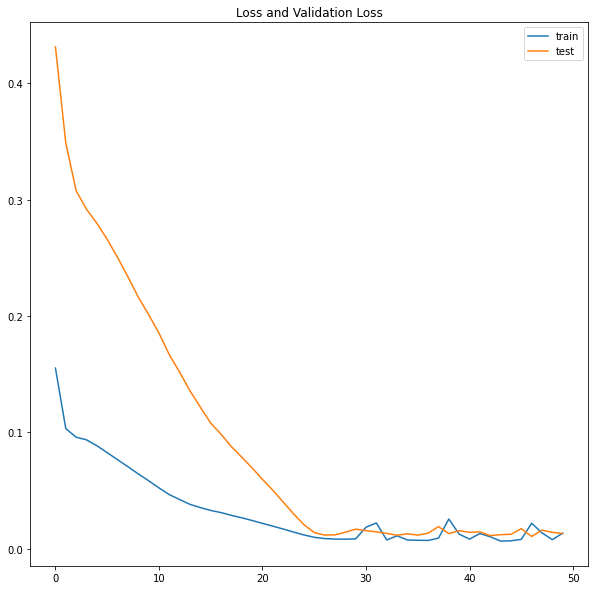

In [ ]:
# fitting the model
history_same_apple_ov = model_same_apple_ov.fit(x_train_same_ov, ytrain_same_ov, epochs=50, batch_size=72, validation_data=(x_test_same_ov, ytest_same_ov), verbose=2, shuffle=False)

# plot history
plt.figure(figsize=(10,10))
plt.plot(history_same_apple_ov.history['loss'], label='train')
plt.plot(history_same_apple_ov.history['val_loss'], label='test')
plt.title('Loss and Validation Loss')
plt.legend()
plt.show()

In [ ]:
# defining the inverse transform function
# - sclr       = the scaler object
# - data       = the data to be inverse transformed
# - col_name   = the name of the column to which the data belongs
# - col_names  = all column names of the data on which scaler object was fit (necessary because scaler will only accept a df of the same shape as the one it was fit on)
def inv_transform(sclr, data, col_name, col_names):
    dummydf = pd.DataFrame(np.zeros((len(data), len(col_names))), columns=col_names)
    dummydf[col_name] = data
    dummydf = pd.DataFrame(sclr.inverse_transform(dummydf), columns=col_names)
    return dummydf[col_name].values

In [ ]:
# predicting with the help of trained LSTM model
ypred_test_same_ov = model_same_apple_ov.predict(x_test_same_ov)
ypred_train_same_ov = model_same_apple_ov.predict(x_train_same_ov)

# inverting the scaling for predicted train and test values
scaler_cols = ['pos','neg','subjectivity','open_value','close_value','low_value','high_value']
ypred_test_same_ov_inv = inv_transform(scaler_same_apple,ypred_test_same_ov,'open_value',scaler_cols)
ypred_train_same_ov_inv = inv_transform(scaler_same_apple,ypred_train_same_ov,'open_value',scaler_cols)

# inverting the scaling for actual test values
ytest_same_ovn = ytest_same_ov.reshape((len(ytest_same_ov), 1))
ytest_same_ov_inv = inv_transform(scaler_same_apple,ytest_same_ov,'open_value',scaler_cols)

# calculating the RMSE score
rmse_same_ov = np.sqrt(mean_squared_error(ytest_same_ov_inv, ypred_test_same_ov_inv))
print('Test RMSE for Apple open_values:\n %.3f' % rmse_same_ov)

Test RMSE for Apple open_values:
 3.395


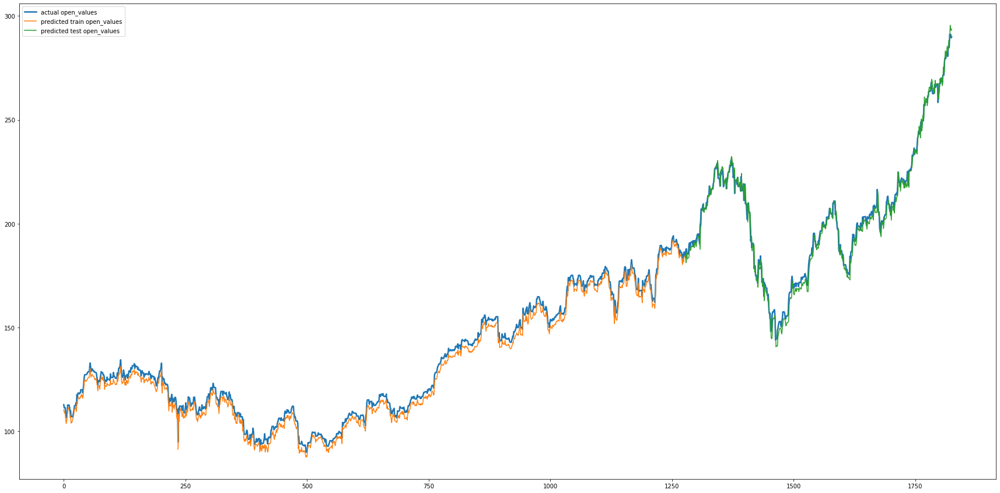

In [ ]:
# plotting original open_values, predicted train open_values and predicted test open_values

# shifting train predictions for plotting
ypred_train_same_ov_inv_plt = np.empty_like(np.array(apple_input_same['open_value']))
ypred_train_same_ov_inv_plt[:] = np.nan
ypred_train_same_ov_inv_plt[0:len(ypred_train_same_ov_inv)] = ypred_train_same_ov_inv

# shifting test predictions for plotting
ypred_test_same_ov_inv_plt = np.empty_like(np.array(apple_input_same['open_value']))
ypred_test_same_ov_inv_plt[:] = np.nan
ypred_test_same_ov_inv_plt[len(ypred_train_same_ov_inv)+1:len(np.array(apple_input_same['open_value']))] = ypred_test_same_ov_inv

plt.figure(figsize=(30,15))
plt.plot(np.array(apple_input_same['open_value']),label='actual open_values',linewidth=2.5)
plt.plot(ypred_train_same_ov_inv_plt,label='predicted train open_values',linestyle='-')
plt.plot(ypred_test_same_ov_inv_plt,label='predicted test open_values',linestyle='-')
plt.legend()
plt.show()

**For close_value**

Epoch 1/50
18/18 - 3s - loss: 0.1452 - val_loss: 0.4182 - 3s/epoch - 148ms/step
Epoch 2/50
18/18 - 0s - loss: 0.0993 - val_loss: 0.3407 - 107ms/epoch - 6ms/step
Epoch 3/50
18/18 - 0s - loss: 0.0937 - val_loss: 0.3046 - 80ms/epoch - 4ms/step
Epoch 4/50
18/18 - 0s - loss: 0.0916 - val_loss: 0.2892 - 92ms/epoch - 5ms/step
Epoch 5/50
18/18 - 0s - loss: 0.0871 - val_loss: 0.2778 - 86ms/epoch - 5ms/step
Epoch 6/50
18/18 - 0s - loss: 0.0816 - val_loss: 0.2647 - 94ms/epoch - 5ms/step
Epoch 7/50
18/18 - 0s - loss: 0.0761 - val_loss: 0.2500 - 86ms/epoch - 5ms/step
Epoch 8/50
18/18 - 0s - loss: 0.0704 - val_loss: 0.2338 - 111ms/epoch - 6ms/step
Epoch 9/50
18/18 - 0s - loss: 0.0645 - val_loss: 0.2164 - 98ms/epoch - 5ms/step
Epoch 10/50
18/18 - 0s - loss: 0.0589 - val_loss: 0.2005 - 86ms/epoch - 5ms/step
Epoch 11/50
18/18 - 0s - loss: 0.0533 - val_loss: 0.1859 - 104ms/epoch - 6ms/step
Epoch 12/50
18/18 - 0s - loss: 0.0476 - val_loss: 0.1700 - 114ms/epoch - 6ms/step
Epoch 13/50
18/18 - 0s - loss: 0.

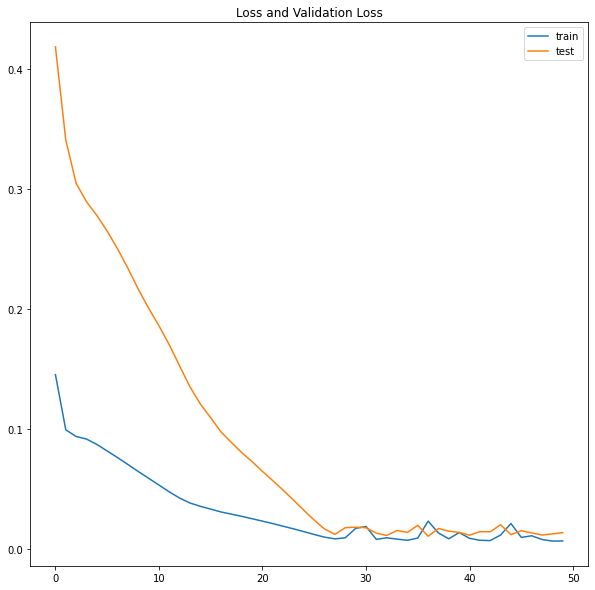

In [ ]:
# fitting the model
history_same_apple_cv = model_same_apple_cv.fit(x_train_same_cv, ytrain_same_cv, epochs=50, batch_size=72, validation_data=(x_test_same_cv, ytest_same_cv), verbose=2, shuffle=False)

# plot history
plt.figure(figsize=(10,10))
plt.plot(history_same_apple_cv.history['loss'], label='train')
plt.plot(history_same_apple_cv.history['val_loss'], label='test')
plt.title('Loss and Validation Loss')
plt.legend()
plt.show()

In [ ]:
# predicting with the help of trained LSTM model
ypred_test_same_cv = model_same_apple_cv.predict(x_test_same_cv)
ypred_train_same_cv = model_same_apple_cv.predict(x_train_same_cv)

# inverting the scaling for predicted train and test values
ypred_test_same_cv_inv = inv_transform(scaler_same_apple,ypred_test_same_cv,'close_value',scaler_cols)
ypred_train_same_cv_inv = inv_transform(scaler_same_apple,ypred_train_same_cv,'close_value',scaler_cols)

# inverting the scaling for actual test values
ytest_same_cvn = ytest_same_cv.reshape((len(ytest_same_cv), 1))
ytest_same_cv_inv = inv_transform(scaler_same_apple,ytest_same_cv,'close_value',scaler_cols)

# calculating the RMSE score
rmse_same_cv = np.sqrt(mean_squared_error(ytest_same_cv_inv, ypred_test_same_cv_inv))
print('Test RMSE for Apple close_value: %.3f' % rmse_same_cv)

Test RMSE for Apple close_value: 3.734


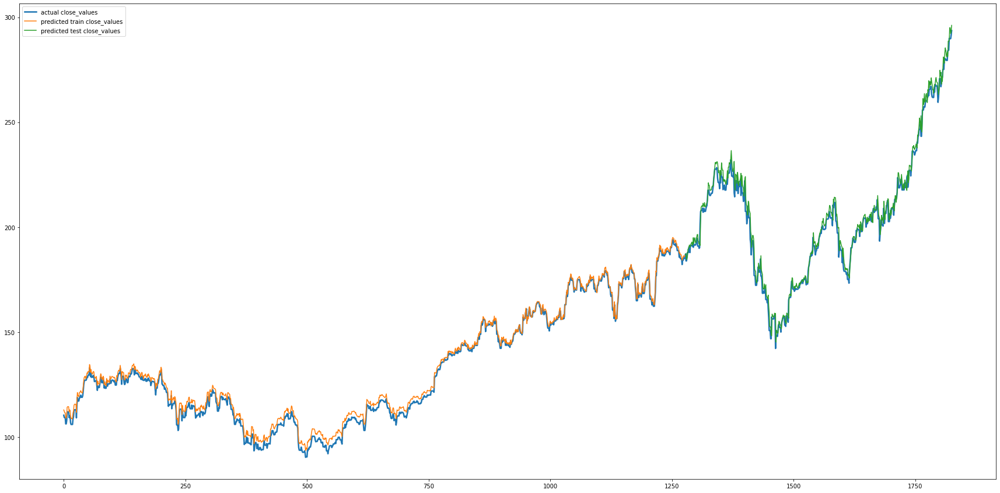

In [ ]:
# plotting original close_values, predicted train close_values and predicted test close_values

# shifting train predictions for plotting
ypred_train_same_cv_inv_plt = np.empty_like(np.array(apple_input_same['close_value']))
ypred_train_same_cv_inv_plt[:] = np.nan
ypred_train_same_cv_inv_plt[0:len(ypred_train_same_cv_inv)] = ypred_train_same_cv_inv

# shifting test predictions for plotting
ypred_test_same_cv_inv_plt = np.empty_like(np.array(apple_input_same['close_value']))
ypred_test_same_cv_inv_plt[:] = np.nan
ypred_test_same_cv_inv_plt[len(ypred_train_same_cv_inv)+1:len(np.array(apple_input_same['close_value']))] = ypred_test_same_cv_inv

plt.figure(figsize=(30,15))
plt.plot(np.array(apple_input_same['close_value']),label='actual close_values',linewidth=2.5)
plt.plot(ypred_train_same_cv_inv_plt,label='predicted train close_values',linestyle='-')
plt.plot(ypred_test_same_cv_inv_plt,label='predicted test close_values',linestyle='-')
plt.legend()
plt.show()

**For low_value**

In [1]:
# fitting the model
history_same_apple_lv = model_same_apple_lv.fit(x_train_same_lv, ytrain_same_lv, epochs=50, batch_size=72, validation_data=(x_test_same_lv, ytest_same_lv), verbose=2, shuffle=False)

# plot history
plt.figure(figsize=(10,10))
plt.plot(history_same_apple_lv.history['loss'], label='train')
plt.plot(history_same_apple_lv.history['val_loss'], label='test')
plt.title('Loss and Validation Loss')
plt.legend()
plt.show()

NameError: name 'model_same_apple_lv' is not defined

In [ ]:
# predicting with the help of trained LSTM model
ypred_test_same_lv = model_same_apple_lv.predict(x_test_same_lv)
ypred_train_same_lv = model_same_apple_lv.predict(x_train_same_lv)

# inverting the scaling for predicted train and test values
ypred_test_same_lv_inv = inv_transform(scaler_same_apple,ypred_test_same_lv,'low_value',scaler_cols)
ypred_train_same_lv_inv = inv_transform(scaler_same_apple,ypred_train_same_lv,'low_value',scaler_cols)

# inverting the scaling for actual test values
ytest_same_lvn = ytest_same_lv.reshape((len(ytest_same_lv), 1))
ytest_same_lv_inv = inv_transform(scaler_same_apple,ytest_same_lv,'low_value',scaler_cols)

# calculating the RMSE score
rmse_same_lv = np.sqrt(mean_squared_error(ytest_same_lv_inv, ypred_test_same_lv_inv))
print('Test RMSE for Apple low_value: %.3f' % rmse_same_lv)

Test RMSE for Apple low_value: 4.813


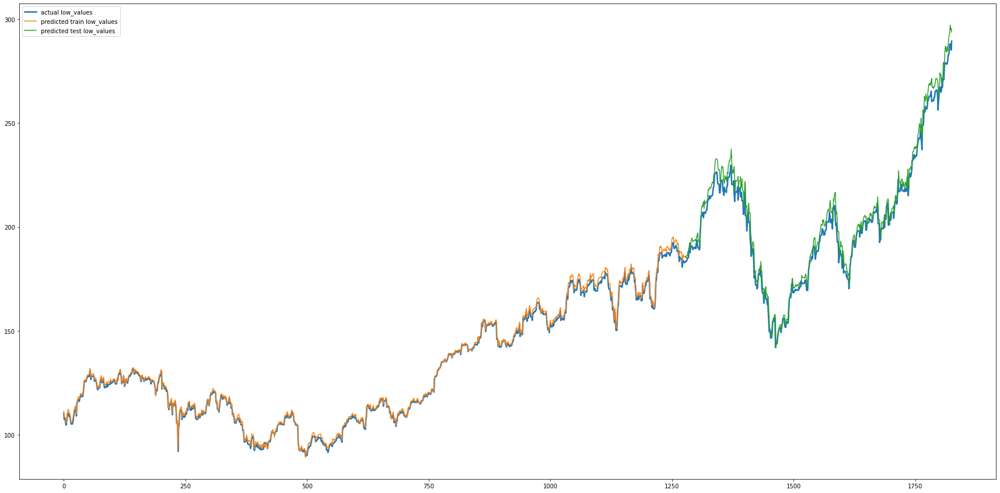

In [ ]:
# plotting original low_values, predicted train low_values and predicted test low_values

# shifting train predictions for plotting
ypred_train_same_lv_inv_plt = np.empty_like(np.array(apple_input_same['low_value']))
ypred_train_same_lv_inv_plt[:] = np.nan
ypred_train_same_lv_inv_plt[0:len(ypred_train_same_lv_inv)] = ypred_train_same_lv_inv

# shifting test predictions for plotting
ypred_test_same_lv_inv_plt = np.empty_like(np.array(apple_input_same['low_value']))
ypred_test_same_lv_inv_plt[:] = np.nan
ypred_test_same_lv_inv_plt[len(ypred_train_same_lv_inv)+1:len(np.array(apple_input_same['low_value']))] = ypred_test_same_lv_inv

plt.figure(figsize=(30,15))
plt.plot(np.array(apple_input_same['low_value']),label='actual low_values',linewidth=2.5)
plt.plot(ypred_train_same_lv_inv_plt,label='predicted train low_values',linestyle='-')
plt.plot(ypred_test_same_lv_inv_plt,label='predicted test low_values',linestyle='-')
plt.legend()
plt.show()

**For high_value**

Epoch 1/50
18/18 - 3s - loss: 0.1415 - val_loss: 0.4195 - 3s/epoch - 145ms/step
Epoch 2/50
18/18 - 0s - loss: 0.0991 - val_loss: 0.3481 - 89ms/epoch - 5ms/step
Epoch 3/50
18/18 - 0s - loss: 0.0936 - val_loss: 0.3133 - 83ms/epoch - 5ms/step
Epoch 4/50
18/18 - 0s - loss: 0.0909 - val_loss: 0.2968 - 86ms/epoch - 5ms/step
Epoch 5/50
18/18 - 0s - loss: 0.0864 - val_loss: 0.2839 - 89ms/epoch - 5ms/step
Epoch 6/50
18/18 - 0s - loss: 0.0809 - val_loss: 0.2698 - 87ms/epoch - 5ms/step
Epoch 7/50
18/18 - 0s - loss: 0.0751 - val_loss: 0.2539 - 92ms/epoch - 5ms/step
Epoch 8/50
18/18 - 0s - loss: 0.0690 - val_loss: 0.2365 - 98ms/epoch - 5ms/step
Epoch 9/50
18/18 - 0s - loss: 0.0623 - val_loss: 0.2165 - 130ms/epoch - 7ms/step
Epoch 10/50
18/18 - 0s - loss: 0.0561 - val_loss: 0.1976 - 82ms/epoch - 5ms/step
Epoch 11/50
18/18 - 0s - loss: 0.0500 - val_loss: 0.1803 - 98ms/epoch - 5ms/step
Epoch 12/50
18/18 - 0s - loss: 0.0440 - val_loss: 0.1615 - 98ms/epoch - 5ms/step
Epoch 13/50
18/18 - 0s - loss: 0.038

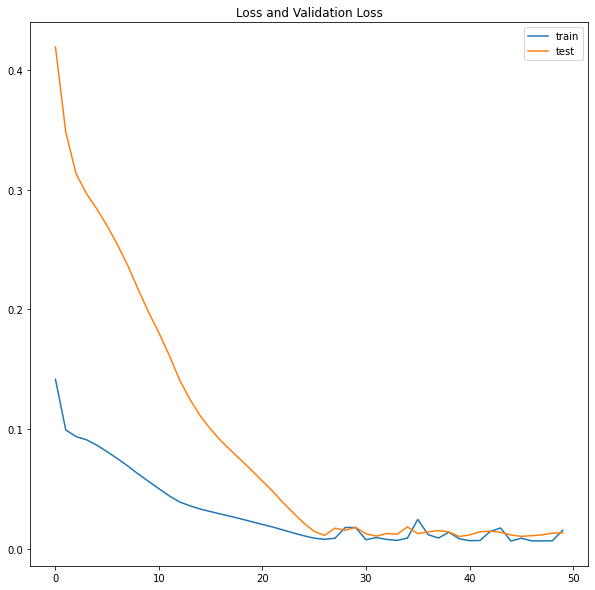

In [ ]:
# fitting the model
history_same_apple_hv = model_same_apple_hv.fit(x_train_same_hv, ytrain_same_hv, epochs=50, batch_size=72, validation_data=(x_test_same_hv, ytest_same_hv), verbose=2, shuffle=False)

# plot history
plt.figure(figsize=(10,10))
plt.plot(history_same_apple_hv.history['loss'], label='train')
plt.plot(history_same_apple_hv.history['val_loss'], label='test')
plt.title('Loss and Validation Loss')
plt.legend()
plt.show()

In [ ]:
# predicting with the help of trained LSTM model
ypred_test_same_hv = model_same_apple_hv.predict(x_test_same_hv)
ypred_train_same_hv = model_same_apple_hv.predict(x_train_same_hv)

# inverting the scaling for predicted train and test values
ypred_test_same_hv_inv = inv_transform(scaler_same_apple,ypred_test_same_hv,'high_value',scaler_cols)
ypred_train_same_hv_inv = inv_transform(scaler_same_apple,ypred_train_same_hv,'high_value',scaler_cols)

# inverting the scaling for actual test values
ytest_same_hvn = ytest_same_hv.reshape((len(ytest_same_hv), 1))
ytest_same_hv_inv = inv_transform(scaler_same_apple,ytest_same_hv,'high_value',scaler_cols)

# calculating the RMSE score
rmse_same_hv = np.sqrt(mean_squared_error(ytest_same_hv_inv, ypred_test_same_hv_inv))
print('Test RMSE for Apple high_value: %.3f' % rmse_same_hv)

Test RMSE for Apple high_value: 3.460


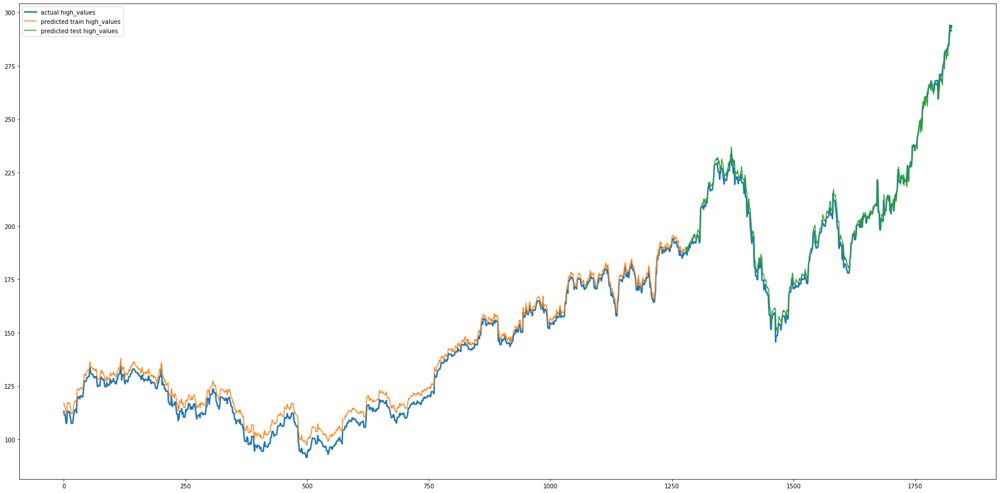

In [ ]:
# plotting original high_values, predicted train high_values and predicted test high_values

# shifting train predictions for plotting
ypred_train_same_hv_inv_plt = np.empty_like(np.array(apple_input_same['high_value']))
ypred_train_same_hv_inv_plt[:] = np.nan
ypred_train_same_hv_inv_plt[0:len(ypred_train_same_hv_inv)] = ypred_train_same_hv_inv

# shifting test predictions for plotting
ypred_test_same_hv_inv_plt = np.empty_like(np.array(apple_input_same['high_value']))
ypred_test_same_hv_inv_plt[:] = np.nan
ypred_test_same_hv_inv_plt[len(ypred_train_same_hv_inv)+1:len(np.array(apple_input_same['high_value']))] = ypred_test_same_hv_inv

plt.figure(figsize=(30,15))
plt.plot(np.array(apple_input_same['high_value']),label='actual high_values',linewidth=2.5)
plt.plot(ypred_train_same_hv_inv_plt,label='predicted train high_values',linestyle='-')
plt.plot(ypred_test_same_hv_inv_plt,label='predicted test high_values',linestyle='-')
plt.legend()
plt.show()

**Using Last 3 Days tweets and stock market data**

In [ ]:
# viewng info of the dataframe before setting the index
print('info of the dataframe before changing the index:\n')
print(apple_sm_ts_3d.info())

info of the dataframe before changing the index:

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1824 entries, 0 to 1823
Data columns (total 18 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   date           1824 non-null   object 
 1   ticker_symbol  1824 non-null   object 
 2   clean_text     1824 non-null   object 
 3   comment_num    1824 non-null   int64  
 4   retweet_num    1824 non-null   int64  
 5   like_num       1824 non-null   int64  
 6   polarity       1824 non-null   float64
 7   subjectivity   1824 non-null   float64
 8   neg            1824 non-null   float64
 9   neu            1824 non-null   float64
 10  pos            1824 non-null   float64
 11  compound       1824 non-null   float64
 12  sentiment      1824 non-null   object 
 13  volume         1824 non-null   int64  
 14  open_value     1824 non-null   float64
 15  close_value    1824 non-null   float64
 16  low_value      1824 non-null   float64
 17  hi

In [ ]:
# changing the index to datetime column and viewing the info again
apple_sm_ts_3d.set_index('date',inplace=True,drop=True)
print('info of the dataframe after changing the index:\n')
print(apple_sm_ts_3d.info())

info of the dataframe after changing the index:

<class 'pandas.core.frame.DataFrame'>
Index: 1824 entries, 2015-01-03 to 2019-12-31
Data columns (total 17 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   ticker_symbol  1824 non-null   object 
 1   clean_text     1824 non-null   object 
 2   comment_num    1824 non-null   int64  
 3   retweet_num    1824 non-null   int64  
 4   like_num       1824 non-null   int64  
 5   polarity       1824 non-null   float64
 6   subjectivity   1824 non-null   float64
 7   neg            1824 non-null   float64
 8   neu            1824 non-null   float64
 9   pos            1824 non-null   float64
 10  compound       1824 non-null   float64
 11  sentiment      1824 non-null   object 
 12  volume         1824 non-null   int64  
 13  open_value     1824 non-null   float64
 14  close_value    1824 non-null   float64
 15  low_value      1824 non-null   float64
 16  high_value     1824 non-null   float6

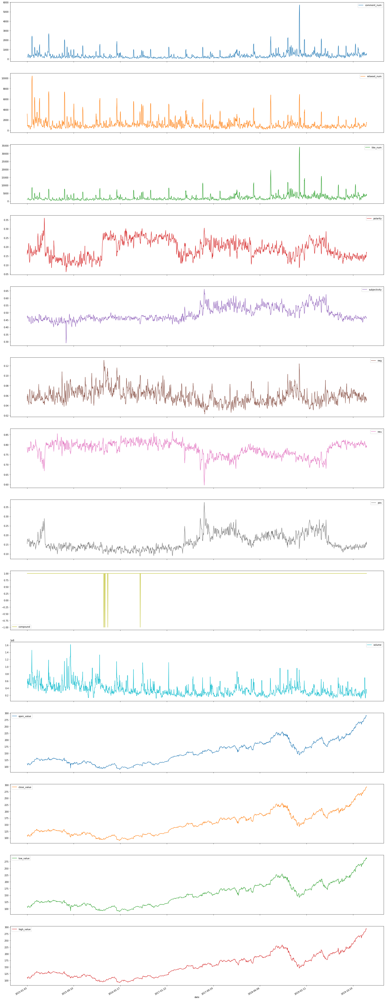

In [ ]:
# getting the columns of interest
col_intr = ['comment_num','retweet_num','like_num','polarity','subjectivity','neg','neu','pos','compound','sentiment','volume','open_value','close_value','low_value','high_value']


apple_sm_ts_3d[col_intr].plot(subplots=True,figsize=(30,90))
plt.show()

In [ ]:
pd.options.display.float_format = "{:,.6f}".format

In [ ]:
# preparing the required input data for the model
apple_input_3d = apple_sm_ts_3d[['pos','neg','subjectivity','open_value','close_value','low_value','high_value']].copy()

# normalizing the features dataframe
scaler_3d_apple = MinMaxScaler(feature_range=(0, 1))
scaled_apple_input_3d = pd.DataFrame(scaler_3d_apple.fit_transform(apple_input_3d.values),columns=['pos','neg','subjectivity','open_value','close_value','low_value','high_value'])
# getting the final input dataframe
apple_input_3d_final = data_to_input(scaled_apple_input_3d,1,1)

# viewing the prepared final input dataframe
display(apple_input_3d_final)

,pos(t-1),neg(t-1),subjectivity(t-1),open_value(t-1),close_value(t-1),low_value(t-1),high_value(t-1),open_value(t),close_value(t),low_value(t),high_value(t)
1,0.229965,0.333333,0.478872,0.106354,0.093404,0.089378,0.097726,0.106354,0.093404,0.089378,0.097726
2,0.299652,0.240741,0.498856,0.106354,0.093404,0.089378,0.097726,0.090941,0.078255,0.079680,0.083935
3,0.320557,0.277778,0.505143,0.090941,0.078255,0.079680,0.083935,0.082239,0.078304,0.075781,0.077904
4,0.310105,0.370370,0.476888,0.082239,0.078304,0.075781,0.077904,0.085521,0.085633,0.086103,0.081710
5,0.299652,0.342593,0.455241,0.085521,0.085633,0.086103,0.081710,0.095615,0.105996,0.096126,0.101236
...,...,...,...,...,...,...,...,...,...,...,...
1819,0.247387,0.268519,0.499007,0.968675,0.981604,0.975906,0.980277,1.000000,0.981063,0.993002,1.000000
1820,0.243902,0.314815,0.469880,1.000000,0.981063,0.993002,1.000000,1.000000,0.981063,0.993002,1.000000
1821,0.219512,0.287037,0.464464,1.000000,0.981063,0.993002,1.000000,1.000000,0.981063,0.993002,1.000000
1822,0.212544,0.287037,0.459774,1.000000,0.981063,0.993002,1.000000,0.991746,0.989523,0.978505,0.993673


In [ ]:
# splitting the data into training and testing set (0.7 and 0.3)
# defining the number of instances in training and testing set
train_size = int(0.7*len(apple_input_3d_final))
test_size = int(len(apple_input_3d_final)-train_size)
print('Number of instances in training set (70%):\n',train_size)
print('Number of instances in testing set (30%):\n',test_size)

# getting the values from dataframes
# for open_value
values_3d_ov = apple_input_3d_final[['pos(t-1)','neg(t-1)','subjectivity(t-1)','open_value(t-1)','open_value(t)']].values
train_dataset_3d_ov = values_3d_ov[:train_size, :]
test_dataset_3d_ov = values_3d_ov[train_size:, :]

# for close_value
values_3d_cv = apple_input_3d_final[['pos(t-1)','neg(t-1)','subjectivity(t-1)','close_value(t-1)','close_value(t)']].values
train_dataset_3d_cv = values_3d_cv[:train_size, :]
test_dataset_3d_cv = values_3d_cv[train_size:, :]

# for low_value
values_3d_lv = apple_input_3d_final[['pos(t-1)','neg(t-1)','subjectivity(t-1)','low_value(t-1)','low_value(t)']].values
train_dataset_3d_lv = values_3d_lv[:train_size, :]
test_dataset_3d_lv = values_3d_lv[train_size:, :]

# for high_value
values_3d_hv = apple_input_3d_final[['pos(t-1)','neg(t-1)','subjectivity(t-1)','high_value(t-1)','high_value(t)']].values
train_dataset_3d_hv = values_3d_hv[:train_size, :]
test_dataset_3d_hv = values_3d_hv[train_size:, :]


# splitting the train and test datasets into input features and output values
# for open_value
xtrain_3d_ov, ytrain_3d_ov = train_dataset_3d_ov[:,0:4], train_dataset_3d_ov[:,4]
xtest_3d_ov, ytest_3d_ov = test_dataset_3d_ov[:,0:4], test_dataset_3d_ov[:,4]
# for close_value
xtrain_3d_cv, ytrain_3d_cv = train_dataset_3d_cv[:,0:4], train_dataset_3d_cv[:,4]
xtest_3d_cv, ytest_3d_cv = test_dataset_3d_cv[:,0:4], test_dataset_3d_cv[:,4]
# for low_value
xtrain_3d_lv, ytrain_3d_lv = train_dataset_3d_lv[:,0:4], train_dataset_3d_lv[:,4]
xtest_3d_lv, ytest_3d_lv = test_dataset_3d_lv[:,0:4], test_dataset_3d_lv[:,4]
# for high_value
xtrain_3d_hv, ytrain_3d_hv = train_dataset_3d_hv[:,0:4], train_dataset_3d_hv[:,4]
xtest_3d_hv, ytest_3d_hv = test_dataset_3d_hv[:,0:4], test_dataset_3d_hv[:,4]



# reshaping input features in 3D format [samples, timesteps, features]
# for open_value
x_train_3d_ov = xtrain_3d_ov.reshape((xtrain_3d_ov.shape[0], 1, xtrain_3d_ov.shape[1]))
x_test_3d_ov = xtest_3d_ov.reshape((xtest_3d_ov.shape[0], 1, xtest_3d_ov.shape[1]))
print('\nfor open_value:\n')
print(x_train_3d_ov.shape, ytrain_3d_ov.shape, x_test_3d_ov.shape, ytest_3d_ov.shape)

# for close_value
x_train_3d_cv = xtrain_3d_cv.reshape((xtrain_3d_cv.shape[0], 1, xtrain_3d_cv.shape[1]))
x_test_3d_cv = xtest_3d_cv.reshape((xtest_3d_cv.shape[0], 1, xtest_3d_cv.shape[1]))
print('\nfor close_value:\n')
print(x_train_3d_cv.shape, ytrain_3d_cv.shape, x_test_3d_cv.shape, ytest_3d_cv.shape)

# for low_value
x_train_3d_lv = xtrain_3d_lv.reshape((xtrain_3d_lv.shape[0], 1, xtrain_3d_lv.shape[1]))
x_test_3d_lv = xtest_3d_lv.reshape((xtest_3d_lv.shape[0], 1, xtest_3d_lv.shape[1]))
print('\nfor low_value:\n')
print(x_train_3d_lv.shape, ytrain_3d_lv.shape, x_test_3d_lv.shape, ytest_3d_lv.shape)

# for open_value
x_train_3d_hv = xtrain_3d_hv.reshape((xtrain_3d_hv.shape[0], 1, xtrain_3d_hv.shape[1]))
x_test_3d_hv = xtest_3d_hv.reshape((xtest_3d_hv.shape[0], 1, xtest_3d_hv.shape[1]))
print('\nfor high_value:\n')
print(x_train_3d_hv.shape, ytrain_3d_hv.shape, x_test_3d_hv.shape, ytest_3d_hv.shape)

Number of instances in training set (70%):
 1276
Number of instances in testing set (30%):
 547

for open_value:

(1276, 1, 4) (1276,) (547, 1, 4) (547,)

for close_value:

(1276, 1, 4) (1276,) (547, 1, 4) (547,)

for low_value:

(1276, 1, 4) (1276,) (547, 1, 4) (547,)

for high_value:

(1276, 1, 4) (1276,) (547, 1, 4) (547,)


In [ ]:
# Defining the LSTM model
# for open_value
model_3d_apple_ov = Sequential()
model_3d_apple_ov.add(LSTM(50, input_shape=(x_train_3d_ov.shape[1], x_train_3d_ov.shape[2])))
model_3d_apple_ov.add(Dense(1))
model_3d_apple_ov.compile(loss='mae', optimizer='adam')
model_3d_apple_ov.build(input_shape=(x_train_3d_ov.shape[1], x_train_3d_ov.shape[2])) 

# viewing the summary of the model
print('sequential model for Apple Open values:\n')
model_3d_apple_ov.summary()

# for close_value
model_3d_apple_cv = Sequential()
model_3d_apple_cv.add(LSTM(50, input_shape=(x_train_3d_cv.shape[1], x_train_3d_cv.shape[2])))
model_3d_apple_cv.add(Dense(1))
model_3d_apple_cv.compile(loss='mae', optimizer='adam')
model_3d_apple_cv.build(input_shape=(x_train_3d_cv.shape[1], x_train_3d_cv.shape[2])) 

# viewing the summary of the model
print('\nsequential model for Apple Close values:\n')
model_3d_apple_cv.summary()

# for low_value
model_3d_apple_lv = Sequential()
model_3d_apple_lv.add(LSTM(50, input_shape=(x_train_3d_lv.shape[1], x_train_3d_lv.shape[2])))
model_3d_apple_lv.add(Dense(1))
model_3d_apple_lv.compile(loss='mae', optimizer='adam')
model_3d_apple_lv.build(input_shape=(x_train_3d_lv.shape[1], x_train_3d_lv.shape[2])) 

# viewing the summary of the model
print('\nsequential model for Apple Low values:\n')
model_3d_apple_lv.summary()

# for open_value
model_3d_apple_hv = Sequential()
model_3d_apple_hv.add(LSTM(50, input_shape=(x_train_3d_hv.shape[1], x_train_3d_hv.shape[2])))
model_3d_apple_hv.add(Dense(1))
model_3d_apple_hv.compile(loss='mae', optimizer='adam')
model_3d_apple_hv.build(input_shape=(x_train_3d_hv.shape[1], x_train_3d_hv.shape[2])) 

# viewing the summary of the model
print('\nsequential model for Apple High values:\n')
model_3d_apple_hv.summary()

sequential model for Apple Open values:

Model: "sequential_12"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_12 (LSTM)              (None, 50)                11000     
                                                                 
 dense_12 (Dense)            (None, 1)                 51        
                                                                 
Total params: 11,051
Trainable params: 11,051
Non-trainable params: 0
_________________________________________________________________

sequential model for Apple Close values:

Model: "sequential_13"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_13 (LSTM)              (None, 50)                11000     
                                                                 
 dense_13 (Dense)            (None, 1)                 51        
        

**For open_value**

Epoch 1/50
18/18 - 3s - loss: 0.1798 - val_loss: 0.4887 - 3s/epoch - 144ms/step
Epoch 2/50
18/18 - 0s - loss: 0.1225 - val_loss: 0.4075 - 73ms/epoch - 4ms/step
Epoch 3/50
18/18 - 0s - loss: 0.1117 - val_loss: 0.3635 - 98ms/epoch - 5ms/step
Epoch 4/50
18/18 - 0s - loss: 0.1067 - val_loss: 0.3384 - 88ms/epoch - 5ms/step
Epoch 5/50
18/18 - 0s - loss: 0.1023 - val_loss: 0.3233 - 92ms/epoch - 5ms/step
Epoch 6/50
18/18 - 0s - loss: 0.0966 - val_loss: 0.3099 - 104ms/epoch - 6ms/step
Epoch 7/50
18/18 - 0s - loss: 0.0902 - val_loss: 0.2946 - 77ms/epoch - 4ms/step
Epoch 8/50
18/18 - 0s - loss: 0.0838 - val_loss: 0.2785 - 99ms/epoch - 5ms/step
Epoch 9/50
18/18 - 0s - loss: 0.0773 - val_loss: 0.2622 - 105ms/epoch - 6ms/step
Epoch 10/50
18/18 - 0s - loss: 0.0704 - val_loss: 0.2453 - 99ms/epoch - 6ms/step
Epoch 11/50
18/18 - 0s - loss: 0.0633 - val_loss: 0.2282 - 97ms/epoch - 5ms/step
Epoch 12/50
18/18 - 0s - loss: 0.0565 - val_loss: 0.2122 - 92ms/epoch - 5ms/step
Epoch 13/50
18/18 - 0s - loss: 0.05

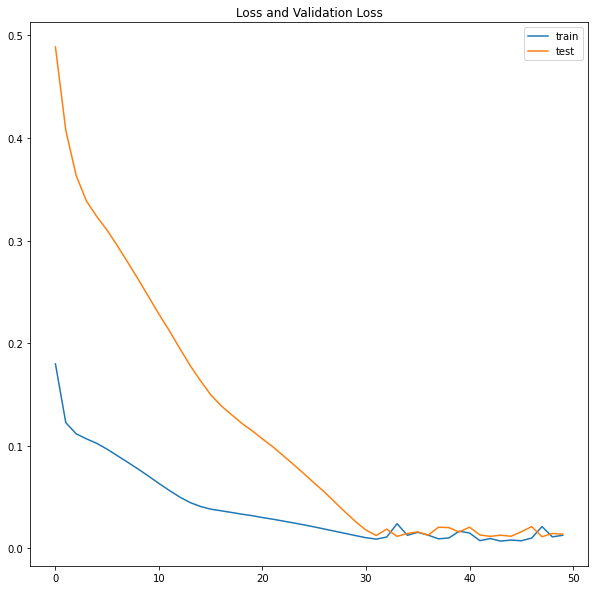

In [ ]:
# fitting the model
history_3d_apple_ov = model_3d_apple_ov.fit(x_train_3d_ov, ytrain_3d_ov, epochs=50, batch_size=72, validation_data=(x_test_3d_ov, ytest_3d_ov), verbose=2, shuffle=False)

# plot history
plt.figure(figsize=(10,10))
plt.plot(history_3d_apple_ov.history['loss'], label='train')
plt.plot(history_3d_apple_ov.history['val_loss'], label='test')
plt.title('Loss and Validation Loss')
plt.legend()
plt.show()

In [ ]:
# predicting with the help of trained LSTM model
ypred_test_3d_ov = model_3d_apple_ov.predict(x_test_3d_ov)
ypred_train_3d_ov = model_3d_apple_ov.predict(x_train_3d_ov)

# inverting the scaling for predicted train and test values
scaler_cols = ['pos','neg','subjectivity','open_value','close_value','low_value','high_value']
ypred_test_3d_ov_inv = inv_transform(scaler_3d_apple,ypred_test_3d_ov,'open_value',scaler_cols)
ypred_train_3d_ov_inv = inv_transform(scaler_3d_apple,ypred_train_3d_ov,'open_value',scaler_cols)

# inverting the scaling for actual test values
ytest_3d_ovn = ytest_3d_ov.reshape((len(ytest_3d_ov), 1))
ytest_3d_ov_inv = inv_transform(scaler_3d_apple,ytest_3d_ov,'open_value',scaler_cols)

# calculating the RMSE score
rmse_3d_ov = np.sqrt(mean_squared_error(ytest_3d_ov_inv, ypred_test_3d_ov_inv))
print('Test RMSE for Apple open_values:\n %.3f' % rmse_3d_ov)

Test RMSE for Apple open_values:
 3.553


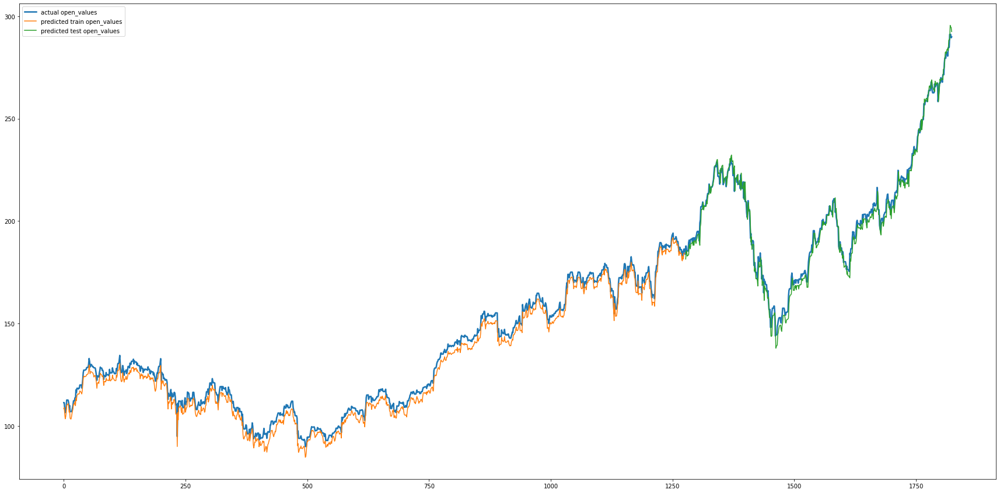

In [ ]:
# plotting original open_values, predicted train open_values and predicted test open_values

# shifting train predictions for plotting
ypred_train_3d_ov_inv_plt = np.empty_like(np.array(apple_input_3d['open_value']))
ypred_train_3d_ov_inv_plt[:] = np.nan
ypred_train_3d_ov_inv_plt[0:len(ypred_train_3d_ov_inv)] = ypred_train_3d_ov_inv

# shifting test predictions for plotting
ypred_test_3d_ov_inv_plt = np.empty_like(np.array(apple_input_3d['open_value']))
ypred_test_3d_ov_inv_plt[:] = np.nan
ypred_test_3d_ov_inv_plt[len(ypred_train_3d_ov_inv)+1:len(np.array(apple_input_3d['open_value']))] = ypred_test_3d_ov_inv

plt.figure(figsize=(30,15))
plt.plot(np.array(apple_input_3d['open_value']),label='actual open_values',linewidth=2.5)
plt.plot(ypred_train_3d_ov_inv_plt,label='predicted train open_values',linestyle='-')
plt.plot(ypred_test_3d_ov_inv_plt,label='predicted test open_values',linestyle='-')
plt.legend()
plt.show()

**For close_value**

Epoch 1/50
18/18 - 3s - loss: 0.1502 - val_loss: 0.4249 - 3s/epoch - 146ms/step
Epoch 2/50
18/18 - 0s - loss: 0.1014 - val_loss: 0.3445 - 82ms/epoch - 5ms/step
Epoch 3/50
18/18 - 0s - loss: 0.0945 - val_loss: 0.3062 - 95ms/epoch - 5ms/step
Epoch 4/50
18/18 - 0s - loss: 0.0907 - val_loss: 0.2876 - 106ms/epoch - 6ms/step
Epoch 5/50
18/18 - 0s - loss: 0.0850 - val_loss: 0.2740 - 88ms/epoch - 5ms/step
Epoch 6/50
18/18 - 0s - loss: 0.0785 - val_loss: 0.2597 - 96ms/epoch - 5ms/step
Epoch 7/50
18/18 - 0s - loss: 0.0720 - val_loss: 0.2447 - 104ms/epoch - 6ms/step
Epoch 8/50
18/18 - 0s - loss: 0.0655 - val_loss: 0.2298 - 104ms/epoch - 6ms/step
Epoch 9/50
18/18 - 0s - loss: 0.0592 - val_loss: 0.2157 - 84ms/epoch - 5ms/step
Epoch 10/50
18/18 - 0s - loss: 0.0529 - val_loss: 0.2011 - 102ms/epoch - 6ms/step
Epoch 11/50
18/18 - 0s - loss: 0.0469 - val_loss: 0.1833 - 99ms/epoch - 6ms/step
Epoch 12/50
18/18 - 0s - loss: 0.0425 - val_loss: 0.1681 - 110ms/epoch - 6ms/step
Epoch 13/50
18/18 - 0s - loss: 0

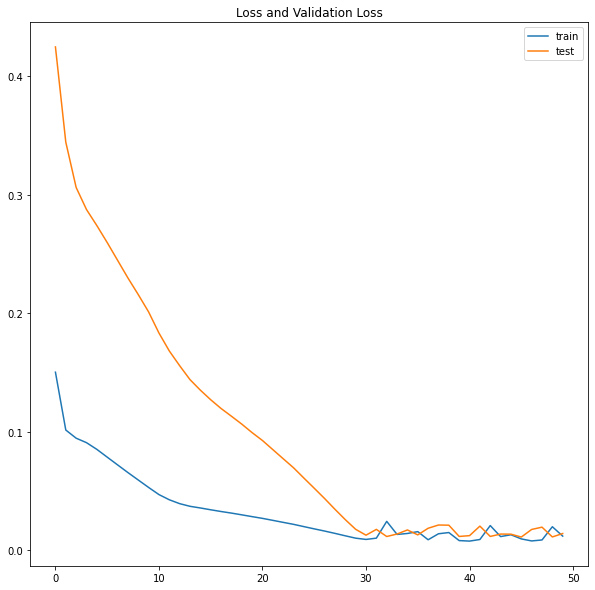

In [ ]:
# fitting the model
history_3d_apple_cv = model_3d_apple_cv.fit(x_train_3d_cv, ytrain_3d_cv, epochs=50, batch_size=72, validation_data=(x_test_3d_cv, ytest_3d_cv), verbose=2, shuffle=False)

# plot history
plt.figure(figsize=(10,10))
plt.plot(history_3d_apple_cv.history['loss'], label='train')
plt.plot(history_3d_apple_cv.history['val_loss'], label='test')
plt.title('Loss and Validation Loss')
plt.legend()
plt.show()

In [ ]:
# predicting with the help of trained LSTM model
ypred_test_3d_cv = model_3d_apple_cv.predict(x_test_3d_cv)
ypred_train_3d_cv = model_3d_apple_cv.predict(x_train_3d_cv)

# inverting the scaling for predicted train and test values
ypred_test_3d_cv_inv = inv_transform(scaler_3d_apple,ypred_test_3d_cv,'close_value',scaler_cols)
ypred_train_3d_cv_inv = inv_transform(scaler_3d_apple,ypred_train_3d_cv,'close_value',scaler_cols)

# inverting the scaling for actual test values
ytest_3d_cvn = ytest_3d_cv.reshape((len(ytest_3d_cv), 1))
ytest_3d_cv_inv = inv_transform(scaler_3d_apple,ytest_3d_cv,'close_value',scaler_cols)

# calculating the RMSE score
rmse_3d_cv = np.sqrt(mean_squared_error(ytest_3d_cv_inv, ypred_test_3d_cv_inv))
print('Test RMSE for Apple close_value: %.3f' % rmse_3d_cv)

Test RMSE for Apple close_value: 3.863


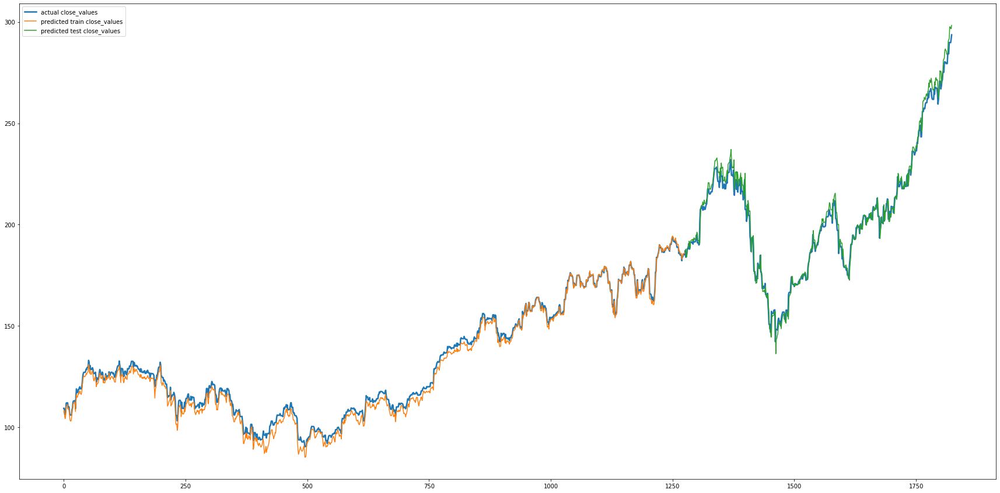

In [ ]:
# plotting original close_values, predicted train close_values and predicted test close_values

# shifting train predictions for plotting
ypred_train_3d_cv_inv_plt = np.empty_like(np.array(apple_input_3d['close_value']))
ypred_train_3d_cv_inv_plt[:] = np.nan
ypred_train_3d_cv_inv_plt[0:len(ypred_train_3d_cv_inv)] = ypred_train_3d_cv_inv

# shifting test predictions for plotting
ypred_test_3d_cv_inv_plt = np.empty_like(np.array(apple_input_3d['close_value']))
ypred_test_3d_cv_inv_plt[:] = np.nan
ypred_test_3d_cv_inv_plt[len(ypred_train_3d_cv_inv)+1:len(np.array(apple_input_3d['close_value']))] = ypred_test_3d_cv_inv

plt.figure(figsize=(30,15))
plt.plot(np.array(apple_input_3d['close_value']),label='actual close_values',linewidth=2.5)
plt.plot(ypred_train_3d_cv_inv_plt,label='predicted train close_values',linestyle='-')
plt.plot(ypred_test_3d_cv_inv_plt,label='predicted test close_values',linestyle='-')
plt.legend()
plt.show()

**For low_value**

Epoch 1/50
18/18 - 3s - loss: 0.1511 - val_loss: 0.4249 - 3s/epoch - 146ms/step
Epoch 2/50
18/18 - 0s - loss: 0.1016 - val_loss: 0.3477 - 78ms/epoch - 4ms/step
Epoch 3/50
18/18 - 0s - loss: 0.0945 - val_loss: 0.3103 - 90ms/epoch - 5ms/step
Epoch 4/50
18/18 - 0s - loss: 0.0903 - val_loss: 0.2905 - 99ms/epoch - 5ms/step
Epoch 5/50
18/18 - 0s - loss: 0.0849 - val_loss: 0.2767 - 102ms/epoch - 6ms/step
Epoch 6/50
18/18 - 0s - loss: 0.0786 - val_loss: 0.2633 - 88ms/epoch - 5ms/step
Epoch 7/50
18/18 - 0s - loss: 0.0719 - val_loss: 0.2486 - 87ms/epoch - 5ms/step
Epoch 8/50
18/18 - 0s - loss: 0.0651 - val_loss: 0.2324 - 100ms/epoch - 6ms/step
Epoch 9/50
18/18 - 0s - loss: 0.0587 - val_loss: 0.2167 - 95ms/epoch - 5ms/step
Epoch 10/50
18/18 - 0s - loss: 0.0527 - val_loss: 0.2025 - 94ms/epoch - 5ms/step
Epoch 11/50
18/18 - 0s - loss: 0.0469 - val_loss: 0.1857 - 94ms/epoch - 5ms/step
Epoch 12/50
18/18 - 0s - loss: 0.0425 - val_loss: 0.1706 - 110ms/epoch - 6ms/step
Epoch 13/50
18/18 - 0s - loss: 0.0

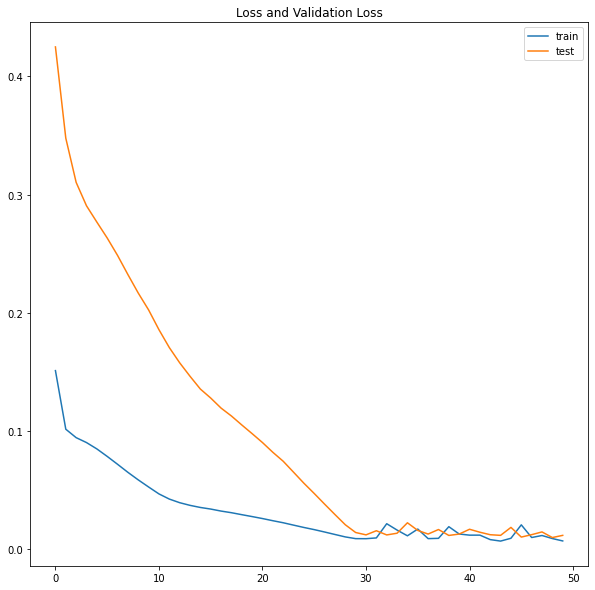

In [ ]:
# fitting the model
history_3d_apple_lv = model_3d_apple_lv.fit(x_train_3d_lv, ytrain_3d_lv, epochs=50, batch_size=72, validation_data=(x_test_3d_lv, ytest_3d_lv), verbose=2, shuffle=False)

# plot history
plt.figure(figsize=(10,10))
plt.plot(history_3d_apple_lv.history['loss'], label='train')
plt.plot(history_3d_apple_lv.history['val_loss'], label='test')
plt.title('Loss and Validation Loss')
plt.legend()
plt.show()

In [ ]:
# predicting with the help of trained LSTM model
ypred_test_3d_lv = model_3d_apple_lv.predict(x_test_3d_lv)
ypred_train_3d_lv = model_3d_apple_lv.predict(x_train_3d_lv)

# inverting the scaling for predicted train and test values
ypred_test_3d_lv_inv = inv_transform(scaler_3d_apple,ypred_test_3d_lv,'low_value',scaler_cols)
ypred_train_3d_lv_inv = inv_transform(scaler_3d_apple,ypred_train_3d_lv,'low_value',scaler_cols)

# inverting the scaling for actual test values
ytest_3d_lvn = ytest_3d_lv.reshape((len(ytest_3d_lv), 1))
ytest_3d_lv_inv = inv_transform(scaler_3d_apple,ytest_3d_lv,'low_value',scaler_cols)

# calculating the RMSE score
rmse_3d_lv = np.sqrt(mean_squared_error(ytest_3d_lv_inv, ypred_test_3d_lv_inv))
print('Test RMSE for Apple low_value: %.3f' % rmse_3d_lv)

Test RMSE for Apple low_value: 3.274


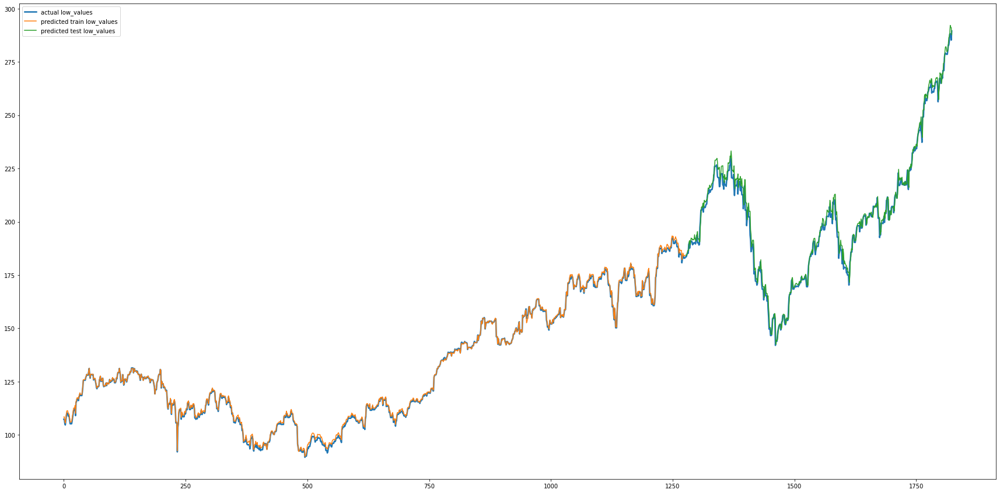

In [ ]:
# plotting original low_values, predicted train low_values and predicted test low_values

# shifting train predictions for plotting
ypred_train_3d_lv_inv_plt = np.empty_like(np.array(apple_input_3d['low_value']))
ypred_train_3d_lv_inv_plt[:] = np.nan
ypred_train_3d_lv_inv_plt[0:len(ypred_train_3d_lv_inv)] = ypred_train_3d_lv_inv

# shifting test predictions for plotting
ypred_test_3d_lv_inv_plt = np.empty_like(np.array(apple_input_3d['low_value']))
ypred_test_3d_lv_inv_plt[:] = np.nan
ypred_test_3d_lv_inv_plt[len(ypred_train_3d_lv_inv)+1:len(np.array(apple_input_3d['low_value']))] = ypred_test_3d_lv_inv

plt.figure(figsize=(30,15))
plt.plot(np.array(apple_input_3d['low_value']),label='actual low_values',linewidth=2.5)
plt.plot(ypred_train_3d_lv_inv_plt,label='predicted train low_values',linestyle='-')
plt.plot(ypred_test_3d_lv_inv_plt,label='predicted test low_values',linestyle='-')
plt.legend()
plt.show()

**For high_value**

Epoch 1/50
18/18 - 3s - loss: 0.1509 - val_loss: 0.4383 - 3s/epoch - 149ms/step
Epoch 2/50
18/18 - 0s - loss: 0.1101 - val_loss: 0.3656 - 95ms/epoch - 5ms/step
Epoch 3/50
18/18 - 0s - loss: 0.1012 - val_loss: 0.3252 - 86ms/epoch - 5ms/step
Epoch 4/50
18/18 - 0s - loss: 0.0970 - val_loss: 0.3044 - 83ms/epoch - 5ms/step
Epoch 5/50
18/18 - 0s - loss: 0.0922 - val_loss: 0.2911 - 77ms/epoch - 4ms/step
Epoch 6/50
18/18 - 0s - loss: 0.0858 - val_loss: 0.2767 - 100ms/epoch - 6ms/step
Epoch 7/50
18/18 - 0s - loss: 0.0792 - val_loss: 0.2609 - 80ms/epoch - 4ms/step
Epoch 8/50
18/18 - 0s - loss: 0.0726 - val_loss: 0.2443 - 97ms/epoch - 5ms/step
Epoch 9/50
18/18 - 0s - loss: 0.0658 - val_loss: 0.2271 - 110ms/epoch - 6ms/step
Epoch 10/50
18/18 - 0s - loss: 0.0592 - val_loss: 0.2122 - 111ms/epoch - 6ms/step
Epoch 11/50
18/18 - 0s - loss: 0.0523 - val_loss: 0.1969 - 90ms/epoch - 5ms/step
Epoch 12/50
18/18 - 0s - loss: 0.0456 - val_loss: 0.1791 - 145ms/epoch - 8ms/step
Epoch 13/50
18/18 - 0s - loss: 0.

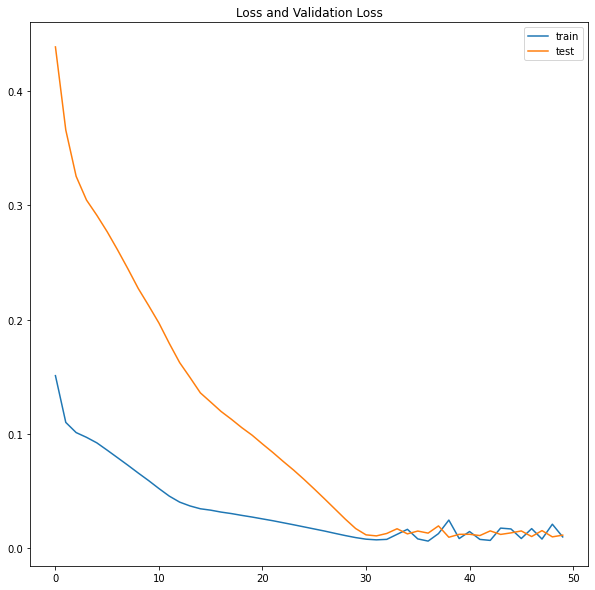

In [ ]:
# fitting the model
history_3d_apple_hv = model_3d_apple_hv.fit(x_train_3d_hv, ytrain_3d_hv, epochs=50, batch_size=72, validation_data=(x_test_3d_hv, ytest_3d_hv), verbose=2, shuffle=False)

# plot history
plt.figure(figsize=(10,10))
plt.plot(history_3d_apple_hv.history['loss'], label='train')
plt.plot(history_3d_apple_hv.history['val_loss'], label='test')
plt.title('Loss and Validation Loss')
plt.legend()
plt.show()

In [ ]:
# predicting with the help of trained LSTM model
ypred_test_3d_hv = model_3d_apple_hv.predict(x_test_3d_hv)
ypred_train_3d_hv = model_3d_apple_hv.predict(x_train_3d_hv)

# inverting the scaling for predicted train and test values
ypred_test_3d_hv_inv = inv_transform(scaler_3d_apple,ypred_test_3d_hv,'high_value',scaler_cols)
ypred_train_3d_hv_inv = inv_transform(scaler_3d_apple,ypred_train_3d_hv,'high_value',scaler_cols)

# inverting the scaling for actual test values
ytest_3d_hvn = ytest_3d_hv.reshape((len(ytest_3d_hv), 1))
ytest_3d_hv_inv = inv_transform(scaler_3d_apple,ytest_3d_hv,'high_value',scaler_cols)

# calculating the RMSE score
rmse_3d_hv = np.sqrt(mean_squared_error(ytest_3d_hv_inv, ypred_test_3d_hv_inv))
print('Test RMSE for Apple high_value: %.3f' % rmse_3d_hv)

Test RMSE for Apple high_value: 3.218


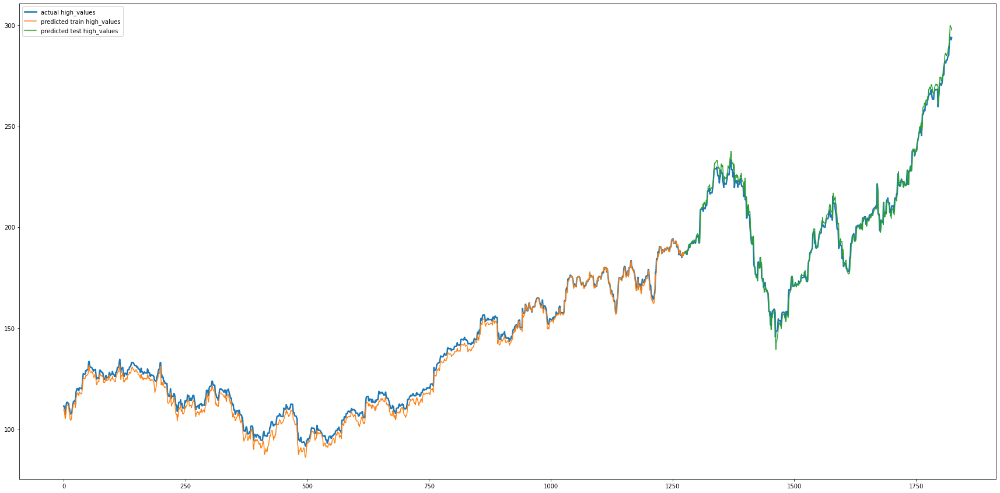

In [ ]:
# plotting original high_values, predicted train high_values and predicted test high_values

# shifting train predictions for plotting
ypred_train_3d_hv_inv_plt = np.empty_like(np.array(apple_input_3d['high_value']))
ypred_train_3d_hv_inv_plt[:] = np.nan
ypred_train_3d_hv_inv_plt[0:len(ypred_train_3d_hv_inv)] = ypred_train_3d_hv_inv

# shifting test predictions for plotting
ypred_test_3d_hv_inv_plt = np.empty_like(np.array(apple_input_3d['high_value']))
ypred_test_3d_hv_inv_plt[:] = np.nan
ypred_test_3d_hv_inv_plt[len(ypred_train_3d_hv_inv)+1:len(np.array(apple_input_3d['high_value']))] = ypred_test_3d_hv_inv

plt.figure(figsize=(30,15))
plt.plot(np.array(apple_input_3d['high_value']),label='actual high_values',linewidth=2.5)
plt.plot(ypred_train_3d_hv_inv_plt,label='predicted train high_values',linestyle='-')
plt.plot(ypred_test_3d_hv_inv_plt,label='predicted test high_values',linestyle='-')
plt.legend()
plt.show()

## **For Amazon**

In [ ]:
# importing the datasets
# same day
amazon_sm_ts_same = pd.read_csv('/content/gdrive/MyDrive/DATA_602_Project/datasets/Amazon/amazon_sm_ts_same.csv')

# previous day
amazon_sm_ts_prev = pd.read_csv('/content/gdrive/MyDrive/DATA_602_Project/datasets/Amazon/amazon_sm_ts_prev.csv')

# last 3 days
amazon_sm_ts_3d = pd.read_csv('/content/gdrive/MyDrive/DATA_602_Project/datasets/Amazon/amazon_sm_ts_3d.csv')

### **LSTM model for predicting stock prices**

**Using Same Day tweets and stock market data**

In [ ]:
# viewng info of the dataframe before setting the index
print('info of the dataframe before changing the index:\n')
print(amazon_sm_ts_same.info())

info of the dataframe before changing the index:

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1826 entries, 0 to 1825
Data columns (total 18 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   date           1826 non-null   object 
 1   ticker_symbol  1826 non-null   object 
 2   clean_text     1826 non-null   object 
 3   comment_num    1826 non-null   int64  
 4   retweet_num    1826 non-null   int64  
 5   like_num       1826 non-null   int64  
 6   polarity       1826 non-null   float64
 7   subjectivity   1826 non-null   float64
 8   neg            1826 non-null   float64
 9   neu            1826 non-null   float64
 10  pos            1826 non-null   float64
 11  compound       1826 non-null   float64
 12  sentiment      1826 non-null   object 
 13  volume         1826 non-null   int64  
 14  open_value     1826 non-null   float64
 15  close_value    1826 non-null   float64
 16  low_value      1826 non-null   float64
 17  hi

In [ ]:
# changing the index to datetime column and viewing the info again
amazon_sm_ts_same.set_index('date',inplace=True,drop=True)
print('info of the dataframe after changing the index:\n')
print(amazon_sm_ts_same.info())

info of the dataframe after changing the index:

<class 'pandas.core.frame.DataFrame'>
Index: 1826 entries, 2015-01-01 to 2019-12-31
Data columns (total 17 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   ticker_symbol  1826 non-null   object 
 1   clean_text     1826 non-null   object 
 2   comment_num    1826 non-null   int64  
 3   retweet_num    1826 non-null   int64  
 4   like_num       1826 non-null   int64  
 5   polarity       1826 non-null   float64
 6   subjectivity   1826 non-null   float64
 7   neg            1826 non-null   float64
 8   neu            1826 non-null   float64
 9   pos            1826 non-null   float64
 10  compound       1826 non-null   float64
 11  sentiment      1826 non-null   object 
 12  volume         1826 non-null   int64  
 13  open_value     1826 non-null   float64
 14  close_value    1826 non-null   float64
 15  low_value      1826 non-null   float64
 16  high_value     1826 non-null   float6

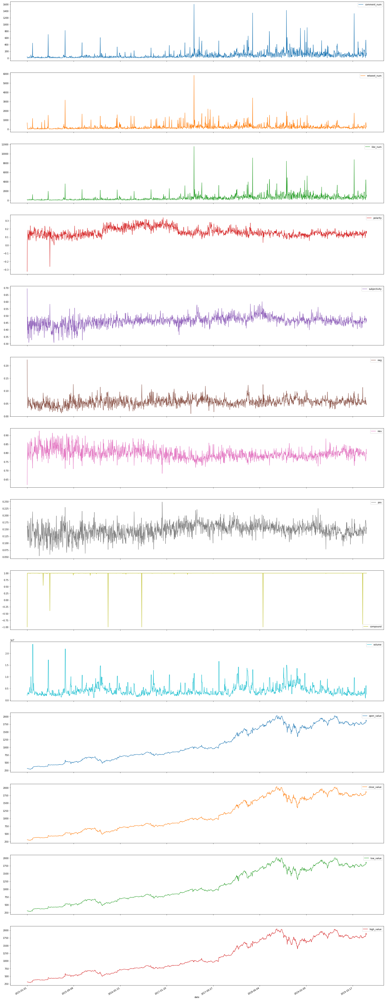

In [ ]:
# getting the columns of interest
col_intr = ['comment_num','retweet_num','like_num','polarity','subjectivity','neg','neu','pos','compound','sentiment','volume','open_value','close_value','low_value','high_value']


amazon_sm_ts_same[col_intr].plot(subplots=True,figsize=(30,90))
plt.show()

In [ ]:
pd.options.display.float_format = "{:,.6f}".format

In [ ]:
# preparing the required input data for the model
amazon_input_same = amazon_sm_ts_same[['pos','neg','subjectivity','open_value','close_value','low_value','high_value']].copy()

# normalizing the features dataframe
scaler_same_amazon = MinMaxScaler(feature_range=(0, 1))
scaled_amazon_input_same = pd.DataFrame(scaler_same_amazon.fit_transform(amazon_input_same.values),columns=['pos','neg','subjectivity','open_value','close_value','low_value','high_value'])
# getting the final input dataframe
amazon_input_same_final = data_to_input(scaled_amazon_input_same,1,1)

# viewing the prepared final input dataframe
display(amazon_input_same_final)

,pos(t-1),neg(t-1),subjectivity(t-1),open_value(t-1),close_value(t-1),low_value(t-1),high_value(t-1),open_value(t),close_value(t),low_value(t),high_value(t)
1,0.530928,1.000000,1.000000,0.014425,0.013352,0.014331,0.012610,0.015013,0.012308,0.012566,0.013616
2,0.556701,0.328638,0.290565,0.015013,0.012308,0.012566,0.013616,0.015013,0.012308,0.012566,0.013616
3,0.365979,0.192488,0.077183,0.015013,0.012308,0.012566,0.013616,0.015013,0.012308,0.012566,0.013616
4,0.283505,0.103286,0.476201,0.015013,0.012308,0.012566,0.013616,0.011833,0.008696,0.009029,0.009996
5,0.649485,0.159624,0.233473,0.011833,0.008696,0.009029,0.009996,0.009110,0.004759,0.004127,0.006939
...,...,...,...,...,...,...,...,...,...,...,...
1821,0.664948,0.248826,0.436292,0.864656,0.902577,0.876429,0.897688,0.911413,0.903165,0.914924,0.915270
1822,0.608247,0.225352,0.428311,0.911413,0.903165,0.914924,0.915270,0.911413,0.903165,0.914924,0.915270
1823,0.597938,0.206573,0.420389,0.911413,0.903165,0.914924,0.915270,0.911413,0.903165,0.914924,0.915270
1824,0.412371,0.164319,0.376610,0.911413,0.903165,0.914924,0.915270,0.906321,0.890092,0.900229,0.905382


In [ ]:
# splitting the data into training and testing set (0.7 and 0.3)
# defining the number of instances in training and testing set
train_size = int(0.7*len(amazon_input_same_final))
test_size = int(len(amazon_input_same_final)-train_size)
print('Number of instances in training set (70%):\n',train_size)
print('Number of instances in testing set (30%):\n',test_size)

# getting the values from dataframes
# for open_value
values_same_ov = amazon_input_same_final[['pos(t-1)','neg(t-1)','subjectivity(t-1)','open_value(t-1)','open_value(t)']].values
train_dataset_same_ov = values_same_ov[:train_size, :]
test_dataset_same_ov = values_same_ov[train_size:, :]

# for close_value
values_same_cv = amazon_input_same_final[['pos(t-1)','neg(t-1)','subjectivity(t-1)','close_value(t-1)','close_value(t)']].values
train_dataset_same_cv = values_same_cv[:train_size, :]
test_dataset_same_cv = values_same_cv[train_size:, :]

# for low_value
values_same_lv = amazon_input_same_final[['pos(t-1)','neg(t-1)','subjectivity(t-1)','low_value(t-1)','low_value(t)']].values
train_dataset_same_lv = values_same_lv[:train_size, :]
test_dataset_same_lv = values_same_lv[train_size:, :]

# for high_value
values_same_hv = amazon_input_same_final[['pos(t-1)','neg(t-1)','subjectivity(t-1)','high_value(t-1)','high_value(t)']].values
train_dataset_same_hv = values_same_hv[:train_size, :]
test_dataset_same_hv = values_same_hv[train_size:, :]


# splitting the train and test datasets into input features and output values
# for open_value
xtrain_same_ov, ytrain_same_ov = train_dataset_same_ov[:,0:4], train_dataset_same_ov[:,4]
xtest_same_ov, ytest_same_ov = test_dataset_same_ov[:,0:4], test_dataset_same_ov[:,4]
# for close_value
xtrain_same_cv, ytrain_same_cv = train_dataset_same_cv[:,0:4], train_dataset_same_cv[:,4]
xtest_same_cv, ytest_same_cv = test_dataset_same_cv[:,0:4], test_dataset_same_cv[:,4]
# for low_value
xtrain_same_lv, ytrain_same_lv = train_dataset_same_lv[:,0:4], train_dataset_same_lv[:,4]
xtest_same_lv, ytest_same_lv = test_dataset_same_lv[:,0:4], test_dataset_same_lv[:,4]
# for high_value
xtrain_same_hv, ytrain_same_hv = train_dataset_same_hv[:,0:4], train_dataset_same_hv[:,4]
xtest_same_hv, ytest_same_hv = test_dataset_same_hv[:,0:4], test_dataset_same_hv[:,4]



# reshaping input features in 3D format [samples, timesteps, features]
# for open_value
x_train_same_ov = xtrain_same_ov.reshape((xtrain_same_ov.shape[0], 1, xtrain_same_ov.shape[1]))
x_test_same_ov = xtest_same_ov.reshape((xtest_same_ov.shape[0], 1, xtest_same_ov.shape[1]))
print('\nfor open_value:\n')
print(x_train_same_ov.shape, ytrain_same_ov.shape, x_test_same_ov.shape, ytest_same_ov.shape)

# for close_value
x_train_same_cv = xtrain_same_cv.reshape((xtrain_same_cv.shape[0], 1, xtrain_same_cv.shape[1]))
x_test_same_cv = xtest_same_cv.reshape((xtest_same_cv.shape[0], 1, xtest_same_cv.shape[1]))
print('\nfor close_value:\n')
print(x_train_same_cv.shape, ytrain_same_cv.shape, x_test_same_cv.shape, ytest_same_cv.shape)

# for low_value
x_train_same_lv = xtrain_same_lv.reshape((xtrain_same_lv.shape[0], 1, xtrain_same_lv.shape[1]))
x_test_same_lv = xtest_same_lv.reshape((xtest_same_lv.shape[0], 1, xtest_same_lv.shape[1]))
print('\nfor low_value:\n')
print(x_train_same_lv.shape, ytrain_same_lv.shape, x_test_same_lv.shape, ytest_same_lv.shape)

# for open_value
x_train_same_hv = xtrain_same_hv.reshape((xtrain_same_hv.shape[0], 1, xtrain_same_hv.shape[1]))
x_test_same_hv = xtest_same_hv.reshape((xtest_same_hv.shape[0], 1, xtest_same_hv.shape[1]))
print('\nfor high_value:\n')
print(x_train_same_hv.shape, ytrain_same_hv.shape, x_test_same_hv.shape, ytest_same_hv.shape)

Number of instances in training set (70%):
 1277
Number of instances in testing set (30%):
 548

for open_value:

(1277, 1, 4) (1277,) (548, 1, 4) (548,)

for close_value:

(1277, 1, 4) (1277,) (548, 1, 4) (548,)

for low_value:

(1277, 1, 4) (1277,) (548, 1, 4) (548,)

for high_value:

(1277, 1, 4) (1277,) (548, 1, 4) (548,)


In [ ]:
# Defining the LSTM model
# for open_value
model_same_amazon_ov = Sequential()
model_same_amazon_ov.add(LSTM(50, input_shape=(x_train_same_ov.shape[1], x_train_same_ov.shape[2])))
model_same_amazon_ov.add(Dense(1))
model_same_amazon_ov.compile(loss='mae', optimizer='adam')
model_same_amazon_ov.build(input_shape=(x_train_same_ov.shape[1], x_train_same_ov.shape[2])) 

# viewing the summary of the model
print('sequential model for amazon Open values:\n')
model_same_amazon_ov.summary()

# for close_value
model_same_amazon_cv = Sequential()
model_same_amazon_cv.add(LSTM(50, input_shape=(x_train_same_cv.shape[1], x_train_same_cv.shape[2])))
model_same_amazon_cv.add(Dense(1))
model_same_amazon_cv.compile(loss='mae', optimizer='adam')
model_same_amazon_cv.build(input_shape=(x_train_same_cv.shape[1], x_train_same_cv.shape[2])) 

# viewing the summary of the model
print('\nsequential model for amazon Close values:\n')
model_same_amazon_cv.summary()

# for low_value
model_same_amazon_lv = Sequential()
model_same_amazon_lv.add(LSTM(50, input_shape=(x_train_same_lv.shape[1], x_train_same_lv.shape[2])))
model_same_amazon_lv.add(Dense(1))
model_same_amazon_lv.compile(loss='mae', optimizer='adam')
model_same_amazon_lv.build(input_shape=(x_train_same_lv.shape[1], x_train_same_lv.shape[2])) 

# viewing the summary of the model
print('\nsequential model for amazon Low values:\n')
model_same_amazon_lv.summary()

# for open_value
model_same_amazon_hv = Sequential()
model_same_amazon_hv.add(LSTM(50, input_shape=(x_train_same_hv.shape[1], x_train_same_hv.shape[2])))
model_same_amazon_hv.add(Dense(1))
model_same_amazon_hv.compile(loss='mae', optimizer='adam')
model_same_amazon_hv.build(input_shape=(x_train_same_hv.shape[1], x_train_same_hv.shape[2])) 

# viewing the summary of the model
print('\nsequential model for amazon High values:\n')
model_same_amazon_hv.summary()

sequential model for amazon Open values:

Model: "sequential_16"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_16 (LSTM)              (None, 50)                11000     
                                                                 
 dense_16 (Dense)            (None, 1)                 51        
                                                                 
Total params: 11,051
Trainable params: 11,051
Non-trainable params: 0
_________________________________________________________________

sequential model for amazon Close values:

Model: "sequential_17"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_17 (LSTM)              (None, 50)                11000     
                                                                 
 dense_17 (Dense)            (None, 1)                 51        
      

**For open_value**

Epoch 1/50
18/18 - 3s - loss: 0.2529 - val_loss: 0.6924 - 3s/epoch - 150ms/step
Epoch 2/50
18/18 - 0s - loss: 0.1541 - val_loss: 0.5581 - 84ms/epoch - 5ms/step
Epoch 3/50
18/18 - 0s - loss: 0.1149 - val_loss: 0.4644 - 88ms/epoch - 5ms/step
Epoch 4/50
18/18 - 0s - loss: 0.1176 - val_loss: 0.4287 - 90ms/epoch - 5ms/step
Epoch 5/50
18/18 - 0s - loss: 0.1187 - val_loss: 0.4187 - 96ms/epoch - 5ms/step
Epoch 6/50
18/18 - 0s - loss: 0.1139 - val_loss: 0.4077 - 102ms/epoch - 6ms/step
Epoch 7/50
18/18 - 0s - loss: 0.1090 - val_loss: 0.3923 - 85ms/epoch - 5ms/step
Epoch 8/50
18/18 - 0s - loss: 0.1046 - val_loss: 0.3750 - 97ms/epoch - 5ms/step
Epoch 9/50
18/18 - 0s - loss: 0.1003 - val_loss: 0.3567 - 105ms/epoch - 6ms/step
Epoch 10/50
18/18 - 0s - loss: 0.0958 - val_loss: 0.3378 - 91ms/epoch - 5ms/step
Epoch 11/50
18/18 - 0s - loss: 0.0912 - val_loss: 0.3184 - 80ms/epoch - 4ms/step
Epoch 12/50
18/18 - 0s - loss: 0.0863 - val_loss: 0.2979 - 90ms/epoch - 5ms/step
Epoch 13/50
18/18 - 0s - loss: 0.08

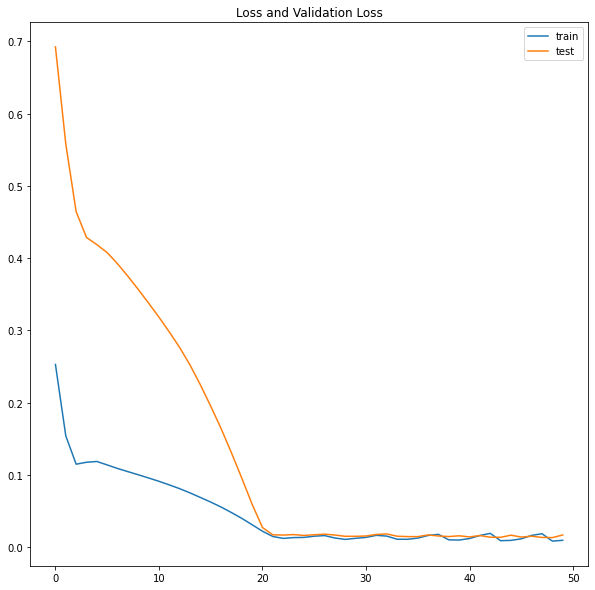

In [ ]:
# fitting the model
history_same_amazon_ov = model_same_amazon_ov.fit(x_train_same_ov, ytrain_same_ov, epochs=50, batch_size=72, validation_data=(x_test_same_ov, ytest_same_ov), verbose=2, shuffle=False)

# plot history
plt.figure(figsize=(10,10))
plt.plot(history_same_amazon_ov.history['loss'], label='train')
plt.plot(history_same_amazon_ov.history['val_loss'], label='test')
plt.title('Loss and Validation Loss')
plt.legend()
plt.show()

In [ ]:
# predicting with the help of trained LSTM model
ypred_test_same_ov = model_same_amazon_ov.predict(x_test_same_ov)
ypred_train_same_ov = model_same_amazon_ov.predict(x_train_same_ov)

# inverting the scaling for predicted train and test values
scaler_cols = ['pos','neg','subjectivity','open_value','close_value','low_value','high_value']
ypred_test_same_ov_inv = inv_transform(scaler_same_amazon,ypred_test_same_ov,'open_value',scaler_cols)
ypred_train_same_ov_inv = inv_transform(scaler_same_amazon,ypred_train_same_ov,'open_value',scaler_cols)

# inverting the scaling for actual test values
ytest_same_ovn = ytest_same_ov.reshape((len(ytest_same_ov), 1))
ytest_same_ov_inv = inv_transform(scaler_same_amazon,ytest_same_ov,'open_value',scaler_cols)

# calculating the RMSE score
rmse_same_ov = np.sqrt(mean_squared_error(ytest_same_ov_inv, ypred_test_same_ov_inv))
print('Test RMSE for amazon open_values:\n %.3f' % rmse_same_ov)

Test RMSE for amazon open_values:
 38.027


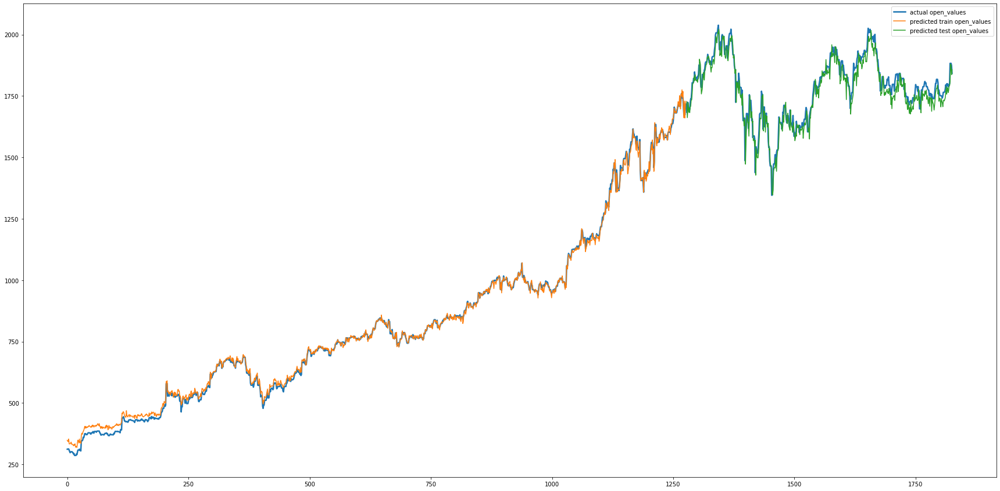

In [ ]:
# plotting original open_values, predicted train open_values and predicted test open_values

# shifting train predictions for plotting
ypred_train_same_ov_inv_plt = np.empty_like(np.array(amazon_input_same['open_value']))
ypred_train_same_ov_inv_plt[:] = np.nan
ypred_train_same_ov_inv_plt[0:len(ypred_train_same_ov_inv)] = ypred_train_same_ov_inv

# shifting test predictions for plotting
ypred_test_same_ov_inv_plt = np.empty_like(np.array(amazon_input_same['open_value']))
ypred_test_same_ov_inv_plt[:] = np.nan
ypred_test_same_ov_inv_plt[len(ypred_train_same_ov_inv)+1:len(np.array(amazon_input_same['open_value']))] = ypred_test_same_ov_inv

plt.figure(figsize=(30,15))
plt.plot(np.array(amazon_input_same['open_value']),label='actual open_values',linewidth=2.5)
plt.plot(ypred_train_same_ov_inv_plt,label='predicted train open_values',linestyle='-')
plt.plot(ypred_test_same_ov_inv_plt,label='predicted test open_values',linestyle='-')
plt.legend()
plt.show()

**For close_value**

Epoch 1/50
18/18 - 3s - loss: 0.2751 - val_loss: 0.7178 - 3s/epoch - 143ms/step
Epoch 2/50
18/18 - 0s - loss: 0.1646 - val_loss: 0.5733 - 77ms/epoch - 4ms/step
Epoch 3/50
18/18 - 0s - loss: 0.1163 - val_loss: 0.4699 - 75ms/epoch - 4ms/step
Epoch 4/50
18/18 - 0s - loss: 0.1169 - val_loss: 0.4294 - 104ms/epoch - 6ms/step
Epoch 5/50
18/18 - 0s - loss: 0.1187 - val_loss: 0.4177 - 96ms/epoch - 5ms/step
Epoch 6/50
18/18 - 0s - loss: 0.1142 - val_loss: 0.4070 - 99ms/epoch - 6ms/step
Epoch 7/50
18/18 - 0s - loss: 0.1090 - val_loss: 0.3907 - 92ms/epoch - 5ms/step
Epoch 8/50
18/18 - 0s - loss: 0.1046 - val_loss: 0.3729 - 106ms/epoch - 6ms/step
Epoch 9/50
18/18 - 0s - loss: 0.1003 - val_loss: 0.3550 - 91ms/epoch - 5ms/step
Epoch 10/50
18/18 - 0s - loss: 0.0956 - val_loss: 0.3359 - 110ms/epoch - 6ms/step
Epoch 11/50
18/18 - 0s - loss: 0.0909 - val_loss: 0.3162 - 88ms/epoch - 5ms/step
Epoch 12/50
18/18 - 0s - loss: 0.0859 - val_loss: 0.2957 - 118ms/epoch - 7ms/step
Epoch 13/50
18/18 - 0s - loss: 0.

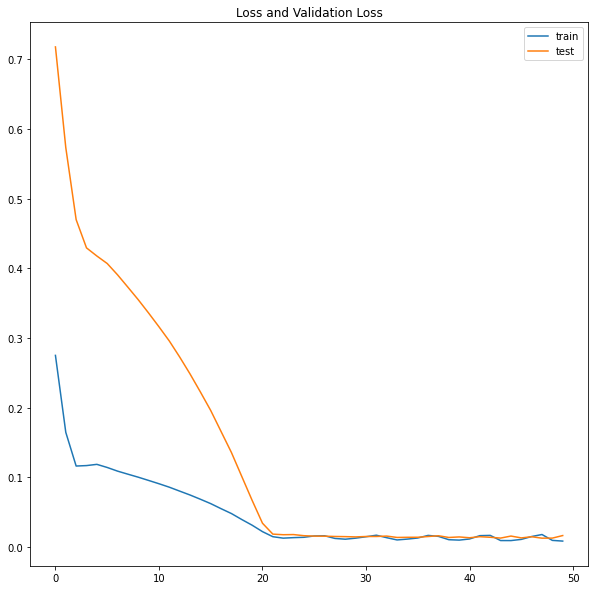

In [ ]:
# fitting the model
history_same_amazon_cv = model_same_amazon_cv.fit(x_train_same_cv, ytrain_same_cv, epochs=50, batch_size=72, validation_data=(x_test_same_cv, ytest_same_cv), verbose=2, shuffle=False)

# plot history
plt.figure(figsize=(10,10))
plt.plot(history_same_amazon_cv.history['loss'], label='train')
plt.plot(history_same_amazon_cv.history['val_loss'], label='test')
plt.title('Loss and Validation Loss')
plt.legend()
plt.show()

In [ ]:
# predicting with the help of trained LSTM model
ypred_test_same_cv = model_same_amazon_cv.predict(x_test_same_cv)
ypred_train_same_cv = model_same_amazon_cv.predict(x_train_same_cv)

# inverting the scaling for predicted train and test values
ypred_test_same_cv_inv = inv_transform(scaler_same_amazon,ypred_test_same_cv,'close_value',scaler_cols)
ypred_train_same_cv_inv = inv_transform(scaler_same_amazon,ypred_train_same_cv,'close_value',scaler_cols)

# inverting the scaling for actual test values
ytest_same_cvn = ytest_same_cv.reshape((len(ytest_same_cv), 1))
ytest_same_cv_inv = inv_transform(scaler_same_amazon,ytest_same_cv,'close_value',scaler_cols)

# calculating the RMSE score
rmse_same_cv = np.sqrt(mean_squared_error(ytest_same_cv_inv, ypred_test_same_cv_inv))
print('Test RMSE for amazon close_value: %.3f' % rmse_same_cv)

Test RMSE for amazon close_value: 36.788


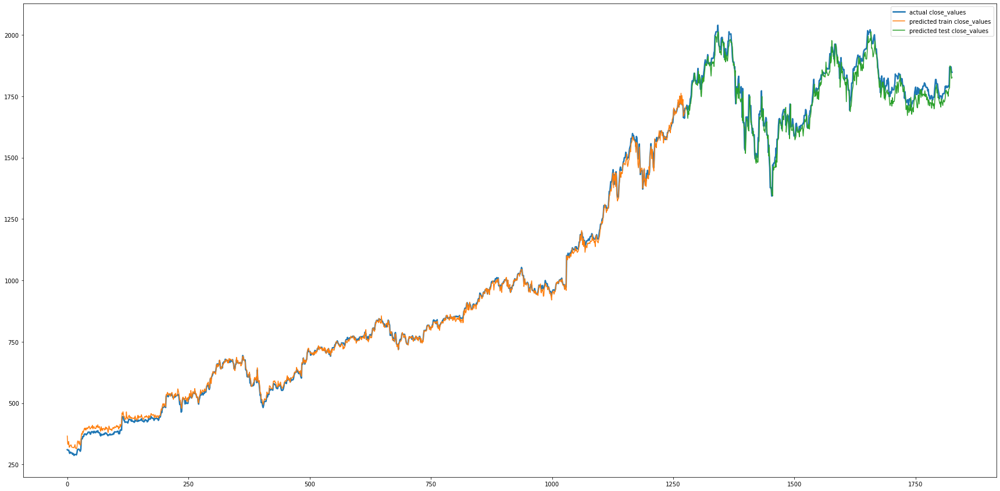

In [ ]:
# plotting original close_values, predicted train close_values and predicted test close_values

# shifting train predictions for plotting
ypred_train_same_cv_inv_plt = np.empty_like(np.array(amazon_input_same['close_value']))
ypred_train_same_cv_inv_plt[:] = np.nan
ypred_train_same_cv_inv_plt[0:len(ypred_train_same_cv_inv)] = ypred_train_same_cv_inv

# shifting test predictions for plotting
ypred_test_same_cv_inv_plt = np.empty_like(np.array(amazon_input_same['close_value']))
ypred_test_same_cv_inv_plt[:] = np.nan
ypred_test_same_cv_inv_plt[len(ypred_train_same_cv_inv)+1:len(np.array(amazon_input_same['close_value']))] = ypred_test_same_cv_inv

plt.figure(figsize=(30,15))
plt.plot(np.array(amazon_input_same['close_value']),label='actual close_values',linewidth=2.5)
plt.plot(ypred_train_same_cv_inv_plt,label='predicted train close_values',linestyle='-')
plt.plot(ypred_test_same_cv_inv_plt,label='predicted test close_values',linestyle='-')
plt.legend()
plt.show()

**For low_value**

Epoch 1/50
18/18 - 3s - loss: 0.2229 - val_loss: 0.6507 - 3s/epoch - 170ms/step
Epoch 2/50
18/18 - 0s - loss: 0.1332 - val_loss: 0.5215 - 101ms/epoch - 6ms/step
Epoch 3/50
18/18 - 0s - loss: 0.1127 - val_loss: 0.4488 - 103ms/epoch - 6ms/step
Epoch 4/50
18/18 - 0s - loss: 0.1184 - val_loss: 0.4256 - 104ms/epoch - 6ms/step
Epoch 5/50
18/18 - 0s - loss: 0.1170 - val_loss: 0.4180 - 100ms/epoch - 6ms/step
Epoch 6/50
18/18 - 0s - loss: 0.1116 - val_loss: 0.4055 - 92ms/epoch - 5ms/step
Epoch 7/50
18/18 - 0s - loss: 0.1069 - val_loss: 0.3893 - 95ms/epoch - 5ms/step
Epoch 8/50
18/18 - 0s - loss: 0.1027 - val_loss: 0.3725 - 115ms/epoch - 6ms/step
Epoch 9/50
18/18 - 0s - loss: 0.0983 - val_loss: 0.3549 - 95ms/epoch - 5ms/step
Epoch 10/50
18/18 - 0s - loss: 0.0936 - val_loss: 0.3358 - 104ms/epoch - 6ms/step
Epoch 11/50
18/18 - 0s - loss: 0.0888 - val_loss: 0.3156 - 90ms/epoch - 5ms/step
Epoch 12/50
18/18 - 0s - loss: 0.0838 - val_loss: 0.2944 - 86ms/epoch - 5ms/step
Epoch 13/50
18/18 - 0s - loss: 

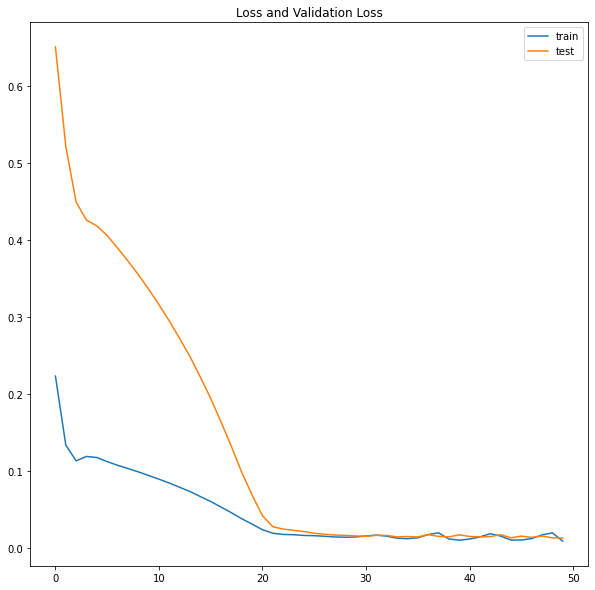

In [ ]:
# fitting the model
history_same_amazon_lv = model_same_amazon_lv.fit(x_train_same_lv, ytrain_same_lv, epochs=50, batch_size=72, validation_data=(x_test_same_lv, ytest_same_lv), verbose=2, shuffle=False)

# plot history
plt.figure(figsize=(10,10))
plt.plot(history_same_amazon_lv.history['loss'], label='train')
plt.plot(history_same_amazon_lv.history['val_loss'], label='test')
plt.title('Loss and Validation Loss')
plt.legend()
plt.show()

In [ ]:
# predicting with the help of trained LSTM model
ypred_test_same_lv = model_same_amazon_lv.predict(x_test_same_lv)
ypred_train_same_lv = model_same_amazon_lv.predict(x_train_same_lv)

# inverting the scaling for predicted train and test values
ypred_test_same_lv_inv = inv_transform(scaler_same_amazon,ypred_test_same_lv,'low_value',scaler_cols)
ypred_train_same_lv_inv = inv_transform(scaler_same_amazon,ypred_train_same_lv,'low_value',scaler_cols)

# inverting the scaling for actual test values
ytest_same_lvn = ytest_same_lv.reshape((len(ytest_same_lv), 1))
ytest_same_lv_inv = inv_transform(scaler_same_amazon,ytest_same_lv,'low_value',scaler_cols)

# calculating the RMSE score
rmse_same_lv = np.sqrt(mean_squared_error(ytest_same_lv_inv, ypred_test_same_lv_inv))
print('Test RMSE for amazon low_value: %.3f' % rmse_same_lv)

Test RMSE for amazon low_value: 28.922


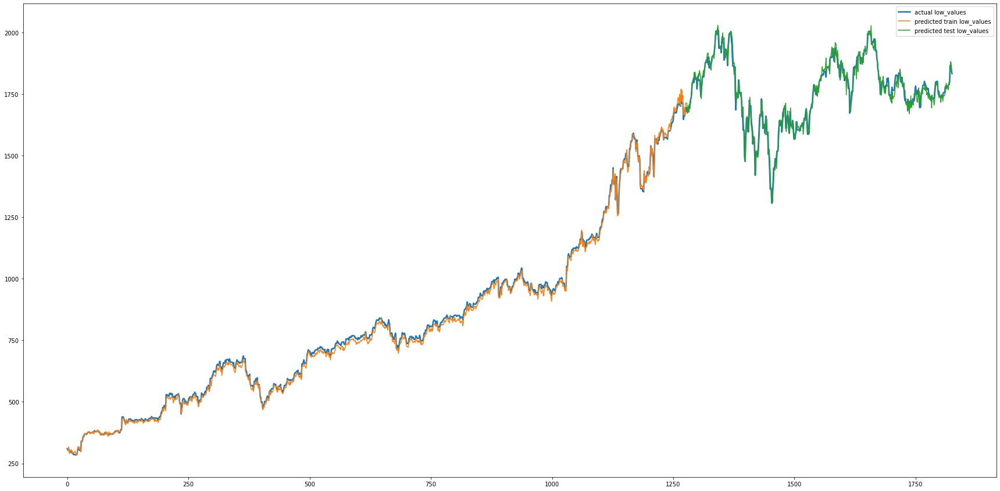

In [ ]:
# plotting original low_values, predicted train low_values and predicted test low_values

# shifting train predictions for plotting
ypred_train_same_lv_inv_plt = np.empty_like(np.array(amazon_input_same['low_value']))
ypred_train_same_lv_inv_plt[:] = np.nan
ypred_train_same_lv_inv_plt[0:len(ypred_train_same_lv_inv)] = ypred_train_same_lv_inv

# shifting test predictions for plotting
ypred_test_same_lv_inv_plt = np.empty_like(np.array(amazon_input_same['low_value']))
ypred_test_same_lv_inv_plt[:] = np.nan
ypred_test_same_lv_inv_plt[len(ypred_train_same_lv_inv)+1:len(np.array(amazon_input_same['low_value']))] = ypred_test_same_lv_inv

plt.figure(figsize=(30,15))
plt.plot(np.array(amazon_input_same['low_value']),label='actual low_values',linewidth=2.5)
plt.plot(ypred_train_same_lv_inv_plt,label='predicted train low_values',linestyle='-')
plt.plot(ypred_test_same_lv_inv_plt,label='predicted test low_values',linestyle='-')
plt.legend()
plt.show()

**For high_value**

Epoch 1/50
18/18 - 3s - loss: 0.2512 - val_loss: 0.7353 - 3s/epoch - 141ms/step
Epoch 2/50
18/18 - 0s - loss: 0.1621 - val_loss: 0.6120 - 79ms/epoch - 4ms/step
Epoch 3/50
18/18 - 0s - loss: 0.1271 - val_loss: 0.5266 - 101ms/epoch - 6ms/step
Epoch 4/50
18/18 - 0s - loss: 0.1276 - val_loss: 0.4902 - 122ms/epoch - 7ms/step
Epoch 5/50
18/18 - 0s - loss: 0.1291 - val_loss: 0.4774 - 103ms/epoch - 6ms/step
Epoch 6/50
18/18 - 0s - loss: 0.1260 - val_loss: 0.4679 - 98ms/epoch - 5ms/step
Epoch 7/50
18/18 - 0s - loss: 0.1219 - val_loss: 0.4558 - 94ms/epoch - 5ms/step
Epoch 8/50
18/18 - 0s - loss: 0.1180 - val_loss: 0.4414 - 80ms/epoch - 4ms/step
Epoch 9/50
18/18 - 0s - loss: 0.1144 - val_loss: 0.4266 - 105ms/epoch - 6ms/step
Epoch 10/50
18/18 - 0s - loss: 0.1107 - val_loss: 0.4110 - 113ms/epoch - 6ms/step
Epoch 11/50
18/18 - 0s - loss: 0.1068 - val_loss: 0.3944 - 95ms/epoch - 5ms/step
Epoch 12/50
18/18 - 0s - loss: 0.1028 - val_loss: 0.3775 - 91ms/epoch - 5ms/step
Epoch 13/50
18/18 - 0s - loss: 0

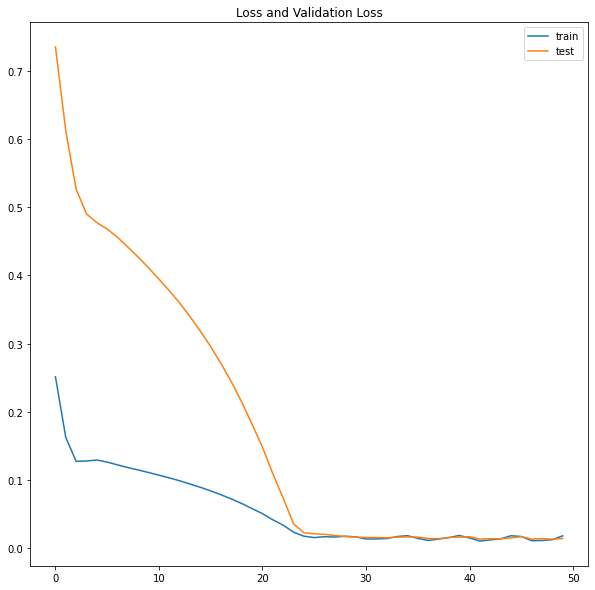

In [ ]:
# fitting the model
history_same_amazon_hv = model_same_amazon_hv.fit(x_train_same_hv, ytrain_same_hv, epochs=50, batch_size=72, validation_data=(x_test_same_hv, ytest_same_hv), verbose=2, shuffle=False)

# plot history
plt.figure(figsize=(10,10))
plt.plot(history_same_amazon_hv.history['loss'], label='train')
plt.plot(history_same_amazon_hv.history['val_loss'], label='test')
plt.title('Loss and Validation Loss')
plt.legend()
plt.show()

In [ ]:
# predicting with the help of trained LSTM model
ypred_test_same_hv = model_same_amazon_hv.predict(x_test_same_hv)
ypred_train_same_hv = model_same_amazon_hv.predict(x_train_same_hv)

# inverting the scaling for predicted train and test values
ypred_test_same_hv_inv = inv_transform(scaler_same_amazon,ypred_test_same_hv,'high_value',scaler_cols)
ypred_train_same_hv_inv = inv_transform(scaler_same_amazon,ypred_train_same_hv,'high_value',scaler_cols)

# inverting the scaling for actual test values
ytest_same_hvn = ytest_same_hv.reshape((len(ytest_same_hv), 1))
ytest_same_hv_inv = inv_transform(scaler_same_amazon,ytest_same_hv,'high_value',scaler_cols)

# calculating the RMSE score
rmse_same_hv = np.sqrt(mean_squared_error(ytest_same_hv_inv, ypred_test_same_hv_inv))
print('Test RMSE for amazon high_value: %.3f' % rmse_same_hv)

Test RMSE for amazon high_value: 32.593


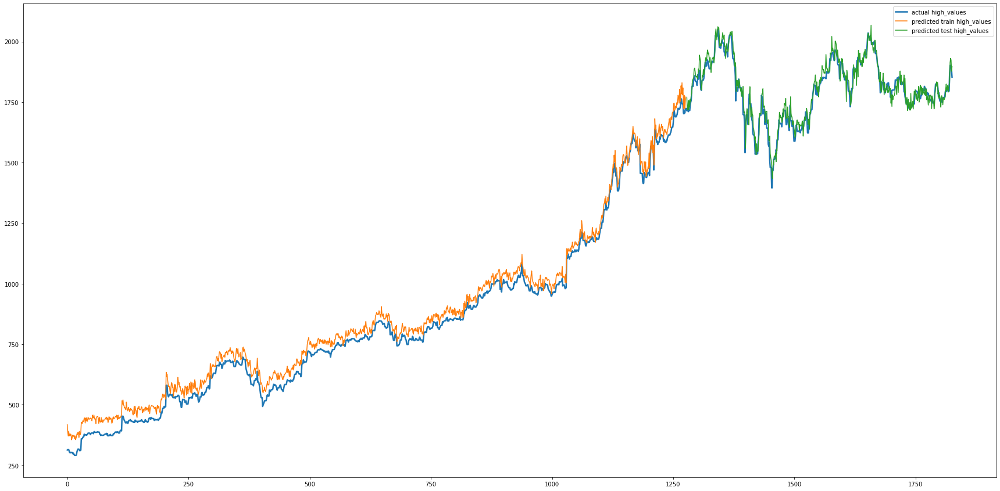

In [ ]:
# plotting original high_values, predicted train high_values and predicted test high_values

# shifting train predictions for plotting
ypred_train_same_hv_inv_plt = np.empty_like(np.array(amazon_input_same['high_value']))
ypred_train_same_hv_inv_plt[:] = np.nan
ypred_train_same_hv_inv_plt[0:len(ypred_train_same_hv_inv)] = ypred_train_same_hv_inv

# shifting test predictions for plotting
ypred_test_same_hv_inv_plt = np.empty_like(np.array(amazon_input_same['high_value']))
ypred_test_same_hv_inv_plt[:] = np.nan
ypred_test_same_hv_inv_plt[len(ypred_train_same_hv_inv)+1:len(np.array(amazon_input_same['high_value']))] = ypred_test_same_hv_inv

plt.figure(figsize=(30,15))
plt.plot(np.array(amazon_input_same['high_value']),label='actual high_values',linewidth=2.5)
plt.plot(ypred_train_same_hv_inv_plt,label='predicted train high_values',linestyle='-')
plt.plot(ypred_test_same_hv_inv_plt,label='predicted test high_values',linestyle='-')
plt.legend()
plt.show()

**Using Last 3 Days tweets and stock market data**

In [ ]:
# viewng info of the dataframe before setting the index
print('info of the dataframe before changing the index:\n')
print(amazon_sm_ts_3d.info())

info of the dataframe before changing the index:

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1824 entries, 0 to 1823
Data columns (total 18 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   date           1824 non-null   object 
 1   ticker_symbol  1824 non-null   object 
 2   clean_text     1824 non-null   object 
 3   comment_num    1824 non-null   int64  
 4   retweet_num    1824 non-null   int64  
 5   like_num       1824 non-null   int64  
 6   polarity       1824 non-null   float64
 7   subjectivity   1824 non-null   float64
 8   neg            1824 non-null   float64
 9   neu            1824 non-null   float64
 10  pos            1824 non-null   float64
 11  compound       1824 non-null   float64
 12  sentiment      1824 non-null   object 
 13  volume         1824 non-null   int64  
 14  open_value     1824 non-null   float64
 15  close_value    1824 non-null   float64
 16  low_value      1824 non-null   float64
 17  hi

In [ ]:
# changing the index to datetime column and viewing the info again
amazon_sm_ts_3d.set_index('date',inplace=True,drop=True)
print('info of the dataframe after changing the index:\n')
print(amazon_sm_ts_3d.info())

info of the dataframe after changing the index:

<class 'pandas.core.frame.DataFrame'>
Index: 1824 entries, 2015-01-03 to 2019-12-31
Data columns (total 17 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   ticker_symbol  1824 non-null   object 
 1   clean_text     1824 non-null   object 
 2   comment_num    1824 non-null   int64  
 3   retweet_num    1824 non-null   int64  
 4   like_num       1824 non-null   int64  
 5   polarity       1824 non-null   float64
 6   subjectivity   1824 non-null   float64
 7   neg            1824 non-null   float64
 8   neu            1824 non-null   float64
 9   pos            1824 non-null   float64
 10  compound       1824 non-null   float64
 11  sentiment      1824 non-null   object 
 12  volume         1824 non-null   int64  
 13  open_value     1824 non-null   float64
 14  close_value    1824 non-null   float64
 15  low_value      1824 non-null   float64
 16  high_value     1824 non-null   float6

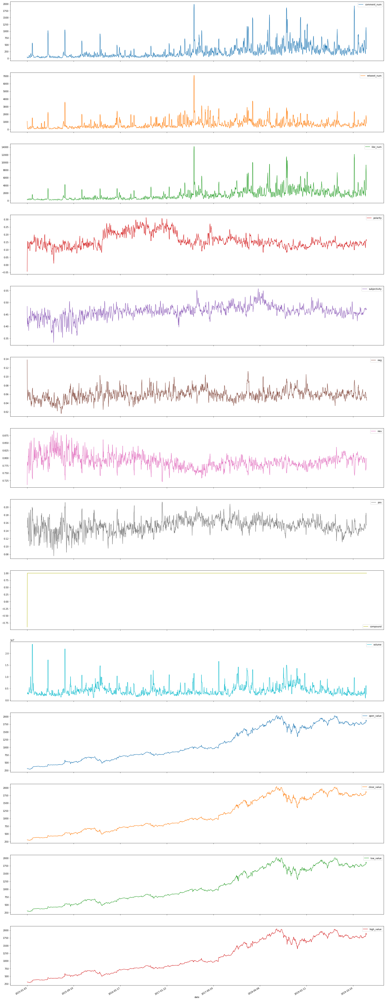

In [ ]:
# getting the columns of interest
col_intr = ['comment_num','retweet_num','like_num','polarity','subjectivity','neg','neu','pos','compound','sentiment','volume','open_value','close_value','low_value','high_value']


amazon_sm_ts_3d[col_intr].plot(subplots=True,figsize=(30,90))
plt.show()

In [ ]:
pd.options.display.float_format = "{:,.6f}".format

In [ ]:
# preparing the required input data for the model
amazon_input_3d = amazon_sm_ts_3d[['pos','neg','subjectivity','open_value','close_value','low_value','high_value']].copy()

# normalizing the features dataframe
scaler_3d_amazon = MinMaxScaler(feature_range=(0, 1))
scaled_amazon_input_3d = pd.DataFrame(scaler_3d_amazon.fit_transform(amazon_input_3d.values),columns=['pos','neg','subjectivity','open_value','close_value','low_value','high_value'])
# getting the final input dataframe
amazon_input_3d_final = data_to_input(scaled_amazon_input_3d,1,1)

# viewing the prepared final input dataframe
display(amazon_input_3d_final)

,pos(t-1),neg(t-1),subjectivity(t-1),open_value(t-1),close_value(t-1),low_value(t-1),high_value(t-1),open_value(t),close_value(t),low_value(t),high_value(t)
1,0.547445,1.000000,0.672587,0.015013,0.012308,0.012566,0.013616,0.015013,0.012308,0.012566,0.013616
2,0.525547,0.409836,0.356341,0.015013,0.012308,0.012566,0.013616,0.011833,0.008696,0.009029,0.009996
3,0.656934,0.245902,0.298456,0.011833,0.008696,0.009029,0.009996,0.009110,0.004759,0.004127,0.006939
4,0.708029,0.295082,0.449771,0.009110,0.004759,0.004127,0.006939,0.006405,0.006545,0.005834,0.005961
5,0.635036,0.360656,0.344259,0.006405,0.006545,0.005834,0.005961,0.008014,0.007709,0.006286,0.007018
...,...,...,...,...,...,...,...,...,...,...,...
1819,0.744526,0.377049,0.642547,0.864656,0.902577,0.876429,0.897688,0.911413,0.903165,0.914924,0.915270
1820,0.744526,0.360656,0.634242,0.911413,0.903165,0.914924,0.915270,0.911413,0.903165,0.914924,0.915270
1821,0.795620,0.295082,0.630536,0.911413,0.903165,0.914924,0.915270,0.911413,0.903165,0.914924,0.915270
1822,0.708029,0.295082,0.613671,0.911413,0.903165,0.914924,0.915270,0.906321,0.890092,0.900229,0.905382


In [ ]:
# splitting the data into training and testing set (0.7 and 0.3)
# defining the number of instances in training and testing set
train_size = int(0.7*len(amazon_input_3d_final))
test_size = int(len(amazon_input_3d_final)-train_size)
print('Number of instances in training set (70%):\n',train_size)
print('Number of instances in testing set (30%):\n',test_size)

# getting the values from dataframes
# for open_value
values_3d_ov = amazon_input_3d_final[['pos(t-1)','neg(t-1)','subjectivity(t-1)','open_value(t-1)','open_value(t)']].values
train_dataset_3d_ov = values_3d_ov[:train_size, :]
test_dataset_3d_ov = values_3d_ov[train_size:, :]

# for close_value
values_3d_cv = amazon_input_3d_final[['pos(t-1)','neg(t-1)','subjectivity(t-1)','close_value(t-1)','close_value(t)']].values
train_dataset_3d_cv = values_3d_cv[:train_size, :]
test_dataset_3d_cv = values_3d_cv[train_size:, :]

# for low_value
values_3d_lv = amazon_input_3d_final[['pos(t-1)','neg(t-1)','subjectivity(t-1)','low_value(t-1)','low_value(t)']].values
train_dataset_3d_lv = values_3d_lv[:train_size, :]
test_dataset_3d_lv = values_3d_lv[train_size:, :]

# for high_value
values_3d_hv = amazon_input_3d_final[['pos(t-1)','neg(t-1)','subjectivity(t-1)','high_value(t-1)','high_value(t)']].values
train_dataset_3d_hv = values_3d_hv[:train_size, :]
test_dataset_3d_hv = values_3d_hv[train_size:, :]


# splitting the train and test datasets into input features and output values
# for open_value
xtrain_3d_ov, ytrain_3d_ov = train_dataset_3d_ov[:,0:4], train_dataset_3d_ov[:,4]
xtest_3d_ov, ytest_3d_ov = test_dataset_3d_ov[:,0:4], test_dataset_3d_ov[:,4]
# for close_value
xtrain_3d_cv, ytrain_3d_cv = train_dataset_3d_cv[:,0:4], train_dataset_3d_cv[:,4]
xtest_3d_cv, ytest_3d_cv = test_dataset_3d_cv[:,0:4], test_dataset_3d_cv[:,4]
# for low_value
xtrain_3d_lv, ytrain_3d_lv = train_dataset_3d_lv[:,0:4], train_dataset_3d_lv[:,4]
xtest_3d_lv, ytest_3d_lv = test_dataset_3d_lv[:,0:4], test_dataset_3d_lv[:,4]
# for high_value
xtrain_3d_hv, ytrain_3d_hv = train_dataset_3d_hv[:,0:4], train_dataset_3d_hv[:,4]
xtest_3d_hv, ytest_3d_hv = test_dataset_3d_hv[:,0:4], test_dataset_3d_hv[:,4]



# reshaping input features in 3D format [samples, timesteps, features]
# for open_value
x_train_3d_ov = xtrain_3d_ov.reshape((xtrain_3d_ov.shape[0], 1, xtrain_3d_ov.shape[1]))
x_test_3d_ov = xtest_3d_ov.reshape((xtest_3d_ov.shape[0], 1, xtest_3d_ov.shape[1]))
print('\nfor open_value:\n')
print(x_train_3d_ov.shape, ytrain_3d_ov.shape, x_test_3d_ov.shape, ytest_3d_ov.shape)

# for close_value
x_train_3d_cv = xtrain_3d_cv.reshape((xtrain_3d_cv.shape[0], 1, xtrain_3d_cv.shape[1]))
x_test_3d_cv = xtest_3d_cv.reshape((xtest_3d_cv.shape[0], 1, xtest_3d_cv.shape[1]))
print('\nfor close_value:\n')
print(x_train_3d_cv.shape, ytrain_3d_cv.shape, x_test_3d_cv.shape, ytest_3d_cv.shape)

# for low_value
x_train_3d_lv = xtrain_3d_lv.reshape((xtrain_3d_lv.shape[0], 1, xtrain_3d_lv.shape[1]))
x_test_3d_lv = xtest_3d_lv.reshape((xtest_3d_lv.shape[0], 1, xtest_3d_lv.shape[1]))
print('\nfor low_value:\n')
print(x_train_3d_lv.shape, ytrain_3d_lv.shape, x_test_3d_lv.shape, ytest_3d_lv.shape)

# for open_value
x_train_3d_hv = xtrain_3d_hv.reshape((xtrain_3d_hv.shape[0], 1, xtrain_3d_hv.shape[1]))
x_test_3d_hv = xtest_3d_hv.reshape((xtest_3d_hv.shape[0], 1, xtest_3d_hv.shape[1]))
print('\nfor high_value:\n')
print(x_train_3d_hv.shape, ytrain_3d_hv.shape, x_test_3d_hv.shape, ytest_3d_hv.shape)

Number of instances in training set (70%):
 1276
Number of instances in testing set (30%):
 547

for open_value:

(1276, 1, 4) (1276,) (547, 1, 4) (547,)

for close_value:

(1276, 1, 4) (1276,) (547, 1, 4) (547,)

for low_value:

(1276, 1, 4) (1276,) (547, 1, 4) (547,)

for high_value:

(1276, 1, 4) (1276,) (547, 1, 4) (547,)


In [ ]:
# Defining the LSTM model
# for open_value
model_3d_amazon_ov = Sequential()
model_3d_amazon_ov.add(LSTM(50, input_shape=(x_train_3d_ov.shape[1], x_train_3d_ov.shape[2])))
model_3d_amazon_ov.add(Dense(1))
model_3d_amazon_ov.compile(loss='mae', optimizer='adam')
model_3d_amazon_ov.build(input_shape=(x_train_3d_ov.shape[1], x_train_3d_ov.shape[2])) 

# viewing the summary of the model
print('sequential model for amazon Open values:\n')
model_3d_amazon_ov.summary()

# for close_value
model_3d_amazon_cv = Sequential()
model_3d_amazon_cv.add(LSTM(50, input_shape=(x_train_3d_cv.shape[1], x_train_3d_cv.shape[2])))
model_3d_amazon_cv.add(Dense(1))
model_3d_amazon_cv.compile(loss='mae', optimizer='adam')
model_3d_amazon_cv.build(input_shape=(x_train_3d_cv.shape[1], x_train_3d_cv.shape[2])) 

# viewing the summary of the model
print('\nsequential model for amazon Close values:\n')
model_3d_amazon_cv.summary()

# for low_value
model_3d_amazon_lv = Sequential()
model_3d_amazon_lv.add(LSTM(50, input_shape=(x_train_3d_lv.shape[1], x_train_3d_lv.shape[2])))
model_3d_amazon_lv.add(Dense(1))
model_3d_amazon_lv.compile(loss='mae', optimizer='adam')
model_3d_amazon_lv.build(input_shape=(x_train_3d_lv.shape[1], x_train_3d_lv.shape[2])) 

# viewing the summary of the model
print('\nsequential model for amazon Low values:\n')
model_3d_amazon_lv.summary()

# for open_value
model_3d_amazon_hv = Sequential()
model_3d_amazon_hv.add(LSTM(50, input_shape=(x_train_3d_hv.shape[1], x_train_3d_hv.shape[2])))
model_3d_amazon_hv.add(Dense(1))
model_3d_amazon_hv.compile(loss='mae', optimizer='adam')
model_3d_amazon_hv.build(input_shape=(x_train_3d_hv.shape[1], x_train_3d_hv.shape[2])) 

# viewing the summary of the model
print('\nsequential model for amazon High values:\n')
model_3d_amazon_hv.summary()

sequential model for amazon Open values:

Model: "sequential_24"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_24 (LSTM)              (None, 50)                11000     
                                                                 
 dense_24 (Dense)            (None, 1)                 51        
                                                                 
Total params: 11,051
Trainable params: 11,051
Non-trainable params: 0
_________________________________________________________________

sequential model for amazon Close values:

Model: "sequential_25"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_25 (LSTM)              (None, 50)                11000     
                                                                 
 dense_25 (Dense)            (None, 1)                 51        
      

**For open_value**

Epoch 1/50
18/18 - 3s - loss: 0.2690 - val_loss: 0.6870 - 3s/epoch - 144ms/step
Epoch 2/50
18/18 - 0s - loss: 0.1436 - val_loss: 0.5231 - 94ms/epoch - 5ms/step
Epoch 3/50
18/18 - 0s - loss: 0.1056 - val_loss: 0.4326 - 91ms/epoch - 5ms/step
Epoch 4/50
18/18 - 0s - loss: 0.1170 - val_loss: 0.4131 - 109ms/epoch - 6ms/step
Epoch 5/50
18/18 - 0s - loss: 0.1153 - val_loss: 0.4148 - 93ms/epoch - 5ms/step
Epoch 6/50
18/18 - 0s - loss: 0.1081 - val_loss: 0.4043 - 94ms/epoch - 5ms/step
Epoch 7/50
18/18 - 0s - loss: 0.1031 - val_loss: 0.3880 - 118ms/epoch - 7ms/step
Epoch 8/50
18/18 - 0s - loss: 0.0992 - val_loss: 0.3714 - 105ms/epoch - 6ms/step
Epoch 9/50
18/18 - 0s - loss: 0.0954 - val_loss: 0.3562 - 88ms/epoch - 5ms/step
Epoch 10/50
18/18 - 0s - loss: 0.0909 - val_loss: 0.3398 - 108ms/epoch - 6ms/step
Epoch 11/50
18/18 - 0s - loss: 0.0865 - val_loss: 0.3227 - 93ms/epoch - 5ms/step
Epoch 12/50
18/18 - 0s - loss: 0.0817 - val_loss: 0.3041 - 100ms/epoch - 6ms/step
Epoch 13/50
18/18 - 0s - loss: 0

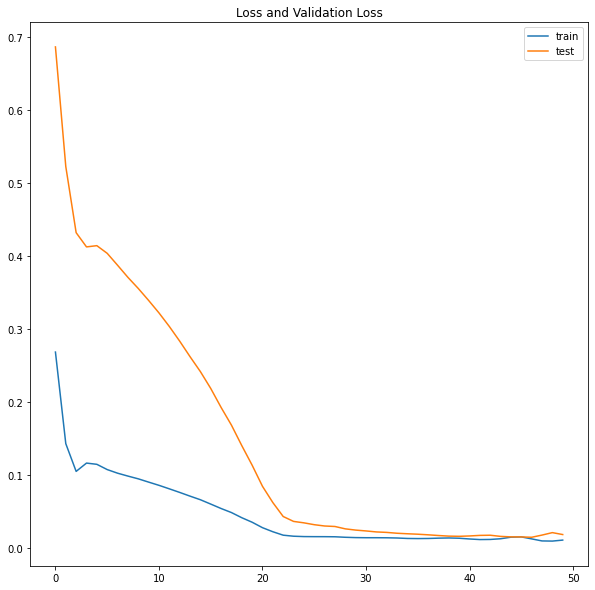

In [ ]:
# fitting the model
history_3d_amazon_ov = model_3d_amazon_ov.fit(x_train_3d_ov, ytrain_3d_ov, epochs=50, batch_size=72, validation_data=(x_test_3d_ov, ytest_3d_ov), verbose=2, shuffle=False)

# plot history
plt.figure(figsize=(10,10))
plt.plot(history_3d_amazon_ov.history['loss'], label='train')
plt.plot(history_3d_amazon_ov.history['val_loss'], label='test')
plt.title('Loss and Validation Loss')
plt.legend()
plt.show()

In [ ]:
# predicting with the help of trained LSTM model
ypred_test_3d_ov = model_3d_amazon_ov.predict(x_test_3d_ov)
ypred_train_3d_ov = model_3d_amazon_ov.predict(x_train_3d_ov)

# inverting the scaling for predicted train and test values
scaler_cols = ['pos','neg','subjectivity','open_value','close_value','low_value','high_value']
ypred_test_3d_ov_inv = inv_transform(scaler_3d_amazon,ypred_test_3d_ov,'open_value',scaler_cols)
ypred_train_3d_ov_inv = inv_transform(scaler_3d_amazon,ypred_train_3d_ov,'open_value',scaler_cols)

# inverting the scaling for actual test values
ytest_3d_ovn = ytest_3d_ov.reshape((len(ytest_3d_ov), 1))
ytest_3d_ov_inv = inv_transform(scaler_3d_amazon,ytest_3d_ov,'open_value',scaler_cols)

# calculating the RMSE score
rmse_3d_ov = np.sqrt(mean_squared_error(ytest_3d_ov_inv, ypred_test_3d_ov_inv))
print('Test RMSE for amazon open_values:\n %.3f' % rmse_3d_ov)

Test RMSE for amazon open_values:
 42.156


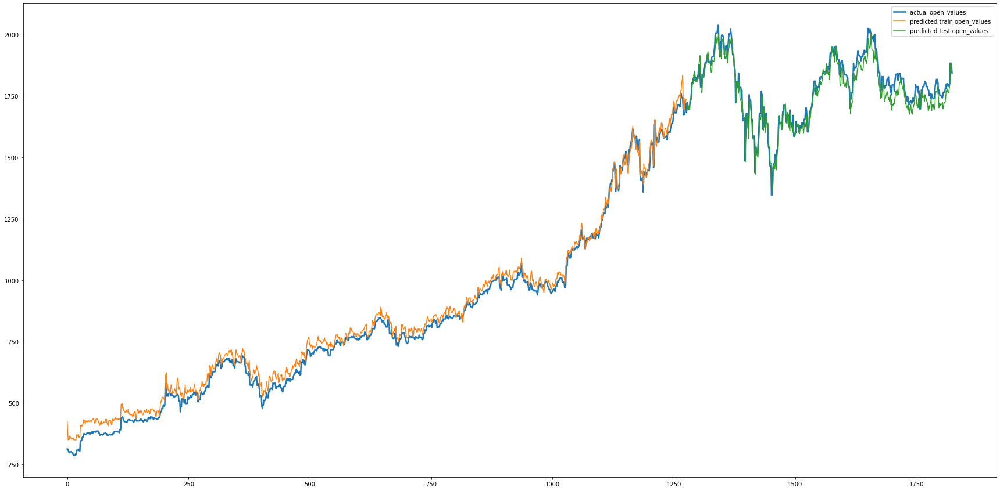

In [ ]:
# plotting original open_values, predicted train open_values and predicted test open_values

# shifting train predictions for plotting
ypred_train_3d_ov_inv_plt = np.empty_like(np.array(amazon_input_3d['open_value']))
ypred_train_3d_ov_inv_plt[:] = np.nan
ypred_train_3d_ov_inv_plt[0:len(ypred_train_3d_ov_inv)] = ypred_train_3d_ov_inv

# shifting test predictions for plotting
ypred_test_3d_ov_inv_plt = np.empty_like(np.array(amazon_input_3d['open_value']))
ypred_test_3d_ov_inv_plt[:] = np.nan
ypred_test_3d_ov_inv_plt[len(ypred_train_3d_ov_inv)+1:len(np.array(amazon_input_3d['open_value']))] = ypred_test_3d_ov_inv

plt.figure(figsize=(30,15))
plt.plot(np.array(amazon_input_3d['open_value']),label='actual open_values',linewidth=2.5)
plt.plot(ypred_train_3d_ov_inv_plt,label='predicted train open_values',linestyle='-')
plt.plot(ypred_test_3d_ov_inv_plt,label='predicted test open_values',linestyle='-')
plt.legend()
plt.show()

**For close_value**

Epoch 1/50
18/18 - 3s - loss: 0.3233 - val_loss: 0.8098 - 3s/epoch - 187ms/step
Epoch 2/50
18/18 - 0s - loss: 0.2019 - val_loss: 0.6633 - 86ms/epoch - 5ms/step
Epoch 3/50
18/18 - 0s - loss: 0.1363 - val_loss: 0.5547 - 100ms/epoch - 6ms/step
Epoch 4/50
18/18 - 0s - loss: 0.1244 - val_loss: 0.4955 - 98ms/epoch - 5ms/step
Epoch 5/50
18/18 - 0s - loss: 0.1308 - val_loss: 0.4804 - 103ms/epoch - 6ms/step
Epoch 6/50
18/18 - 0s - loss: 0.1288 - val_loss: 0.4765 - 88ms/epoch - 5ms/step
Epoch 7/50
18/18 - 0s - loss: 0.1240 - val_loss: 0.4665 - 107ms/epoch - 6ms/step
Epoch 8/50
18/18 - 0s - loss: 0.1201 - val_loss: 0.4533 - 111ms/epoch - 6ms/step
Epoch 9/50
18/18 - 0s - loss: 0.1169 - val_loss: 0.4401 - 95ms/epoch - 5ms/step
Epoch 10/50
18/18 - 0s - loss: 0.1136 - val_loss: 0.4269 - 103ms/epoch - 6ms/step
Epoch 11/50
18/18 - 0s - loss: 0.1100 - val_loss: 0.4135 - 104ms/epoch - 6ms/step
Epoch 12/50
18/18 - 0s - loss: 0.1061 - val_loss: 0.3986 - 103ms/epoch - 6ms/step
Epoch 13/50
18/18 - 0s - loss:

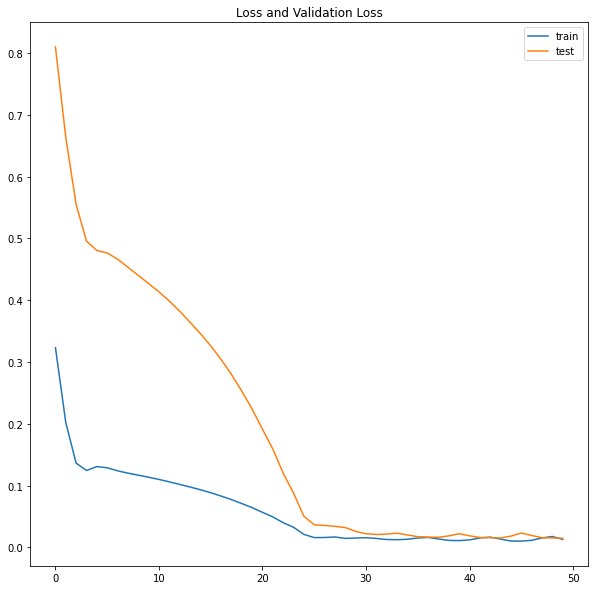

In [ ]:
# fitting the model
history_3d_amazon_cv = model_3d_amazon_cv.fit(x_train_3d_cv, ytrain_3d_cv, epochs=50, batch_size=72, validation_data=(x_test_3d_cv, ytest_3d_cv), verbose=2, shuffle=False)

# plot history
plt.figure(figsize=(10,10))
plt.plot(history_3d_amazon_cv.history['loss'], label='train')
plt.plot(history_3d_amazon_cv.history['val_loss'], label='test')
plt.title('Loss and Validation Loss')
plt.legend()
plt.show()

In [ ]:
# predicting with the help of trained LSTM model
ypred_test_3d_cv = model_3d_amazon_cv.predict(x_test_3d_cv)
ypred_train_3d_cv = model_3d_amazon_cv.predict(x_train_3d_cv)

# inverting the scaling for predicted train and test values
ypred_test_3d_cv_inv = inv_transform(scaler_3d_amazon,ypred_test_3d_cv,'close_value',scaler_cols)
ypred_train_3d_cv_inv = inv_transform(scaler_3d_amazon,ypred_train_3d_cv,'close_value',scaler_cols)

# inverting the scaling for actual test values
ytest_3d_cvn = ytest_3d_cv.reshape((len(ytest_3d_cv), 1))
ytest_3d_cv_inv = inv_transform(scaler_3d_amazon,ytest_3d_cv,'close_value',scaler_cols)

# calculating the RMSE score
rmse_3d_cv = np.sqrt(mean_squared_error(ytest_3d_cv_inv, ypred_test_3d_cv_inv))
print('Test RMSE for amazon close_value: %.3f' % rmse_3d_cv)

Test RMSE for amazon close_value: 34.521


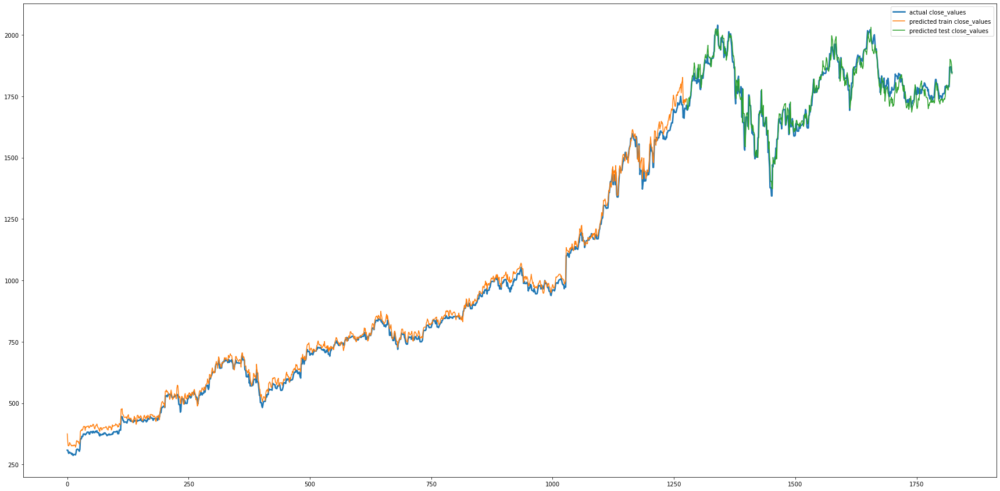

In [ ]:
# plotting original close_values, predicted train close_values and predicted test close_values

# shifting train predictions for plotting
ypred_train_3d_cv_inv_plt = np.empty_like(np.array(amazon_input_3d['close_value']))
ypred_train_3d_cv_inv_plt[:] = np.nan
ypred_train_3d_cv_inv_plt[0:len(ypred_train_3d_cv_inv)] = ypred_train_3d_cv_inv

# shifting test predictions for plotting
ypred_test_3d_cv_inv_plt = np.empty_like(np.array(amazon_input_3d['close_value']))
ypred_test_3d_cv_inv_plt[:] = np.nan
ypred_test_3d_cv_inv_plt[len(ypred_train_3d_cv_inv)+1:len(np.array(amazon_input_3d['close_value']))] = ypred_test_3d_cv_inv

plt.figure(figsize=(30,15))
plt.plot(np.array(amazon_input_3d['close_value']),label='actual close_values',linewidth=2.5)
plt.plot(ypred_train_3d_cv_inv_plt,label='predicted train close_values',linestyle='-')
plt.plot(ypred_test_3d_cv_inv_plt,label='predicted test close_values',linestyle='-')
plt.legend()
plt.show()

**For low_value**

Epoch 1/50
18/18 - 3s - loss: 0.2365 - val_loss: 0.6825 - 3s/epoch - 141ms/step
Epoch 2/50
18/18 - 0s - loss: 0.1374 - val_loss: 0.5465 - 79ms/epoch - 4ms/step
Epoch 3/50
18/18 - 0s - loss: 0.1170 - val_loss: 0.4742 - 82ms/epoch - 5ms/step
Epoch 4/50
18/18 - 0s - loss: 0.1258 - val_loss: 0.4582 - 89ms/epoch - 5ms/step
Epoch 5/50
18/18 - 0s - loss: 0.1232 - val_loss: 0.4546 - 82ms/epoch - 5ms/step
Epoch 6/50
18/18 - 0s - loss: 0.1174 - val_loss: 0.4426 - 104ms/epoch - 6ms/step
Epoch 7/50
18/18 - 0s - loss: 0.1130 - val_loss: 0.4269 - 84ms/epoch - 5ms/step
Epoch 8/50
18/18 - 0s - loss: 0.1094 - val_loss: 0.4115 - 98ms/epoch - 5ms/step
Epoch 9/50
18/18 - 0s - loss: 0.1055 - val_loss: 0.3961 - 90ms/epoch - 5ms/step
Epoch 10/50
18/18 - 0s - loss: 0.1011 - val_loss: 0.3792 - 98ms/epoch - 5ms/step
Epoch 11/50
18/18 - 0s - loss: 0.0967 - val_loss: 0.3610 - 84ms/epoch - 5ms/step
Epoch 12/50
18/18 - 0s - loss: 0.0921 - val_loss: 0.3418 - 89ms/epoch - 5ms/step
Epoch 13/50
18/18 - 0s - loss: 0.087

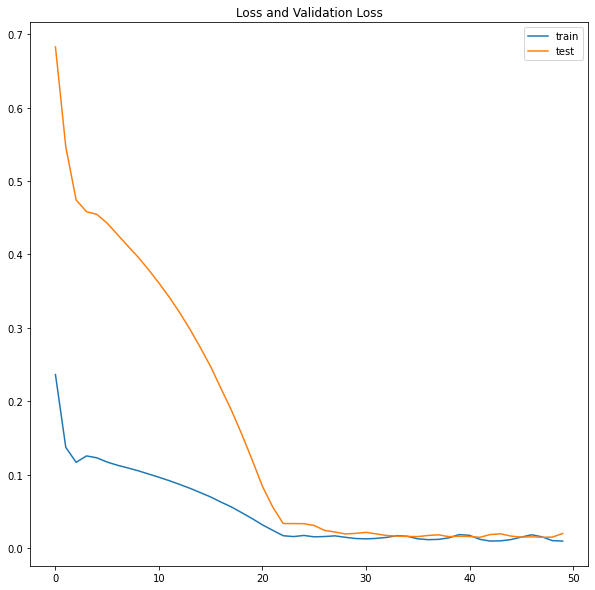

In [ ]:
# fitting the model
history_3d_amazon_lv = model_3d_amazon_lv.fit(x_train_3d_lv, ytrain_3d_lv, epochs=50, batch_size=72, validation_data=(x_test_3d_lv, ytest_3d_lv), verbose=2, shuffle=False)

# plot history
plt.figure(figsize=(10,10))
plt.plot(history_3d_amazon_lv.history['loss'], label='train')
plt.plot(history_3d_amazon_lv.history['val_loss'], label='test')
plt.title('Loss and Validation Loss')
plt.legend()
plt.show()

In [ ]:
# predicting with the help of trained LSTM model
ypred_test_3d_lv = model_3d_amazon_lv.predict(x_test_3d_lv)
ypred_train_3d_lv = model_3d_amazon_lv.predict(x_train_3d_lv)

# inverting the scaling for predicted train and test values
ypred_test_3d_lv_inv = inv_transform(scaler_3d_amazon,ypred_test_3d_lv,'low_value',scaler_cols)
ypred_train_3d_lv_inv = inv_transform(scaler_3d_amazon,ypred_train_3d_lv,'low_value',scaler_cols)

# inverting the scaling for actual test values
ytest_3d_lvn = ytest_3d_lv.reshape((len(ytest_3d_lv), 1))
ytest_3d_lv_inv = inv_transform(scaler_3d_amazon,ytest_3d_lv,'low_value',scaler_cols)

# calculating the RMSE score
rmse_3d_lv = np.sqrt(mean_squared_error(ytest_3d_lv_inv, ypred_test_3d_lv_inv))
print('Test RMSE for amazon low_value: %.3f' % rmse_3d_lv)

Test RMSE for amazon low_value: 42.300


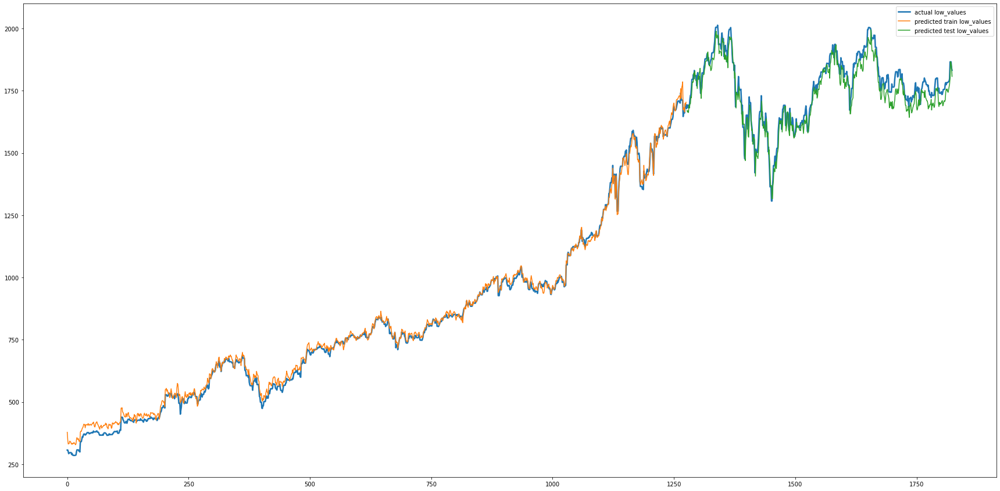

In [ ]:
# plotting original low_values, predicted train low_values and predicted test low_values

# shifting train predictions for plotting
ypred_train_3d_lv_inv_plt = np.empty_like(np.array(amazon_input_3d['low_value']))
ypred_train_3d_lv_inv_plt[:] = np.nan
ypred_train_3d_lv_inv_plt[0:len(ypred_train_3d_lv_inv)] = ypred_train_3d_lv_inv

# shifting test predictions for plotting
ypred_test_3d_lv_inv_plt = np.empty_like(np.array(amazon_input_3d['low_value']))
ypred_test_3d_lv_inv_plt[:] = np.nan
ypred_test_3d_lv_inv_plt[len(ypred_train_3d_lv_inv)+1:len(np.array(amazon_input_3d['low_value']))] = ypred_test_3d_lv_inv

plt.figure(figsize=(30,15))
plt.plot(np.array(amazon_input_3d['low_value']),label='actual low_values',linewidth=2.5)
plt.plot(ypred_train_3d_lv_inv_plt,label='predicted train low_values',linestyle='-')
plt.plot(ypred_test_3d_lv_inv_plt,label='predicted test low_values',linestyle='-')
plt.legend()
plt.show()

**For high_value**

Epoch 1/50
18/18 - 3s - loss: 0.1965 - val_loss: 0.6255 - 3s/epoch - 142ms/step
Epoch 2/50
18/18 - 0s - loss: 0.1187 - val_loss: 0.5077 - 84ms/epoch - 5ms/step
Epoch 3/50
18/18 - 0s - loss: 0.1167 - val_loss: 0.4650 - 99ms/epoch - 6ms/step
Epoch 4/50
18/18 - 0s - loss: 0.1199 - val_loss: 0.4558 - 91ms/epoch - 5ms/step
Epoch 5/50
18/18 - 0s - loss: 0.1151 - val_loss: 0.4456 - 91ms/epoch - 5ms/step
Epoch 6/50
18/18 - 0s - loss: 0.1101 - val_loss: 0.4295 - 98ms/epoch - 5ms/step
Epoch 7/50
18/18 - 0s - loss: 0.1059 - val_loss: 0.4121 - 86ms/epoch - 5ms/step
Epoch 8/50
18/18 - 0s - loss: 0.1019 - val_loss: 0.3951 - 92ms/epoch - 5ms/step
Epoch 9/50
18/18 - 0s - loss: 0.0973 - val_loss: 0.3763 - 88ms/epoch - 5ms/step
Epoch 10/50
18/18 - 0s - loss: 0.0924 - val_loss: 0.3556 - 86ms/epoch - 5ms/step
Epoch 11/50
18/18 - 0s - loss: 0.0874 - val_loss: 0.3337 - 95ms/epoch - 5ms/step
Epoch 12/50
18/18 - 0s - loss: 0.0818 - val_loss: 0.3093 - 102ms/epoch - 6ms/step
Epoch 13/50
18/18 - 0s - loss: 0.075

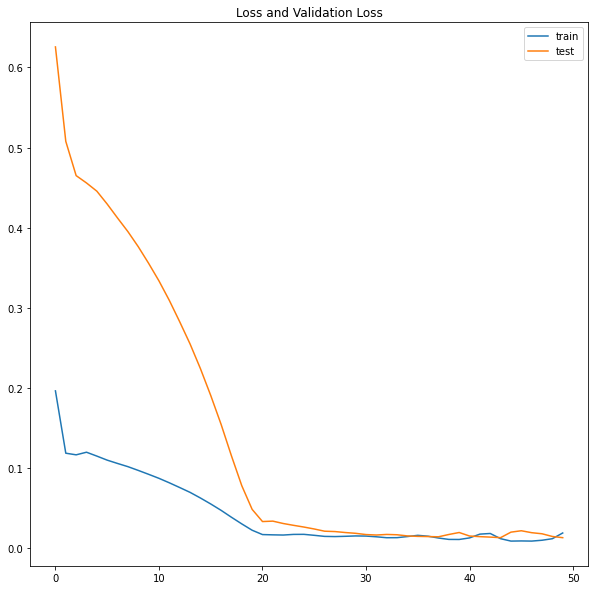

In [ ]:
# fitting the model
history_3d_amazon_hv = model_3d_amazon_hv.fit(x_train_3d_hv, ytrain_3d_hv, epochs=50, batch_size=72, validation_data=(x_test_3d_hv, ytest_3d_hv), verbose=2, shuffle=False)

# plot history
plt.figure(figsize=(10,10))
plt.plot(history_3d_amazon_hv.history['loss'], label='train')
plt.plot(history_3d_amazon_hv.history['val_loss'], label='test')
plt.title('Loss and Validation Loss')
plt.legend()
plt.show()

In [ ]:
# predicting with the help of trained LSTM model
ypred_test_3d_hv = model_3d_amazon_hv.predict(x_test_3d_hv)
ypred_train_3d_hv = model_3d_amazon_hv.predict(x_train_3d_hv)

# inverting the scaling for predicted train and test values
ypred_test_3d_hv_inv = inv_transform(scaler_3d_amazon,ypred_test_3d_hv,'high_value',scaler_cols)
ypred_train_3d_hv_inv = inv_transform(scaler_3d_amazon,ypred_train_3d_hv,'high_value',scaler_cols)

# inverting the scaling for actual test values
ytest_3d_hvn = ytest_3d_hv.reshape((len(ytest_3d_hv), 1))
ytest_3d_hv_inv = inv_transform(scaler_3d_amazon,ytest_3d_hv,'high_value',scaler_cols)

# calculating the RMSE score
rmse_3d_hv = np.sqrt(mean_squared_error(ytest_3d_hv_inv, ypred_test_3d_hv_inv))
print('Test RMSE for amazon high_value: %.3f' % rmse_3d_hv)

Test RMSE for amazon high_value: 30.744


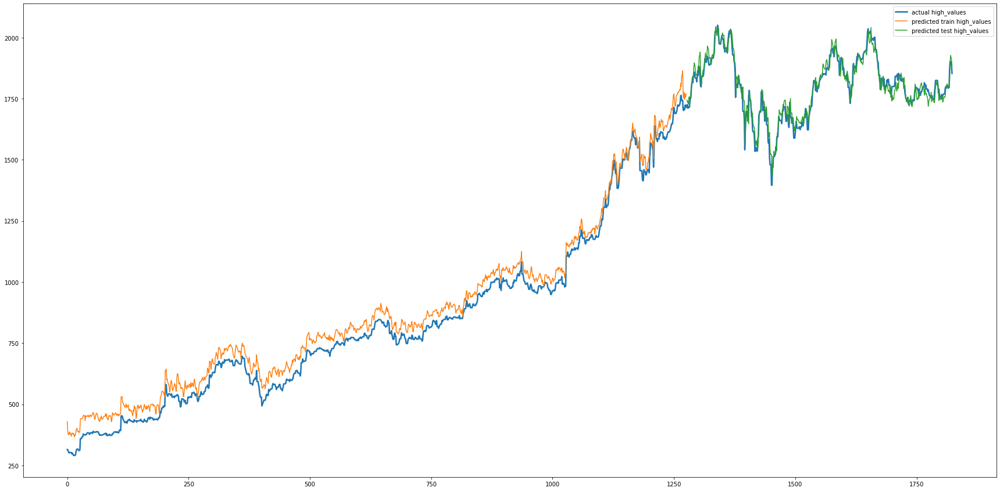

In [ ]:
# plotting original high_values, predicted train high_values and predicted test high_values

# shifting train predictions for plotting
ypred_train_3d_hv_inv_plt = np.empty_like(np.array(amazon_input_3d['high_value']))
ypred_train_3d_hv_inv_plt[:] = np.nan
ypred_train_3d_hv_inv_plt[0:len(ypred_train_3d_hv_inv)] = ypred_train_3d_hv_inv

# shifting test predictions for plotting
ypred_test_3d_hv_inv_plt = np.empty_like(np.array(amazon_input_3d['high_value']))
ypred_test_3d_hv_inv_plt[:] = np.nan
ypred_test_3d_hv_inv_plt[len(ypred_train_3d_hv_inv)+1:len(np.array(amazon_input_3d['high_value']))] = ypred_test_3d_hv_inv

plt.figure(figsize=(30,15))
plt.plot(np.array(amazon_input_3d['high_value']),label='actual high_values',linewidth=2.5)
plt.plot(ypred_train_3d_hv_inv_plt,label='predicted train high_values',linestyle='-')
plt.plot(ypred_test_3d_hv_inv_plt,label='predicted test high_values',linestyle='-')
plt.legend()
plt.show()

## **For Googl**

In [ ]:
# importing the datasets
# same day
googl_sm_ts_same = pd.read_csv('/content/gdrive/MyDrive/DATA_602_Project/datasets/Googl/googl_sm_ts_same.csv')

# previous day
googl_sm_ts_prev = pd.read_csv('/content/gdrive/MyDrive/DATA_602_Project/datasets/Googl/googl_sm_ts_prev.csv')

# last 3 days
googl_sm_ts_3d = pd.read_csv('/content/gdrive/MyDrive/DATA_602_Project/datasets/Googl/googl_sm_ts_3d.csv')

### **LSTM model for predicting stock prices**

**Using Same Day tweets and stock market data**

In [ ]:
# viewng info of the dataframe before setting the index
print('info of the dataframe before changing the index:\n')
print(googl_sm_ts_same.info())

info of the dataframe before changing the index:

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1826 entries, 0 to 1825
Data columns (total 18 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   date           1826 non-null   object 
 1   ticker_symbol  1826 non-null   object 
 2   clean_text     1826 non-null   object 
 3   comment_num    1826 non-null   int64  
 4   retweet_num    1826 non-null   int64  
 5   like_num       1826 non-null   int64  
 6   polarity       1826 non-null   float64
 7   subjectivity   1826 non-null   float64
 8   neg            1826 non-null   float64
 9   neu            1826 non-null   float64
 10  pos            1826 non-null   float64
 11  compound       1826 non-null   float64
 12  sentiment      1826 non-null   object 
 13  volume         1826 non-null   int64  
 14  open_value     1826 non-null   float64
 15  close_value    1826 non-null   float64
 16  low_value      1826 non-null   float64
 17  hi

In [ ]:
# changing the index to datetime column and viewing the info again
googl_sm_ts_same.set_index('date',inplace=True,drop=True)
print('info of the dataframe after changing the index:\n')
print(googl_sm_ts_same.info())

info of the dataframe after changing the index:

<class 'pandas.core.frame.DataFrame'>
Index: 1826 entries, 2015-01-01 to 2019-12-31
Data columns (total 17 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   ticker_symbol  1826 non-null   object 
 1   clean_text     1826 non-null   object 
 2   comment_num    1826 non-null   int64  
 3   retweet_num    1826 non-null   int64  
 4   like_num       1826 non-null   int64  
 5   polarity       1826 non-null   float64
 6   subjectivity   1826 non-null   float64
 7   neg            1826 non-null   float64
 8   neu            1826 non-null   float64
 9   pos            1826 non-null   float64
 10  compound       1826 non-null   float64
 11  sentiment      1826 non-null   object 
 12  volume         1826 non-null   int64  
 13  open_value     1826 non-null   float64
 14  close_value    1826 non-null   float64
 15  low_value      1826 non-null   float64
 16  high_value     1826 non-null   float6

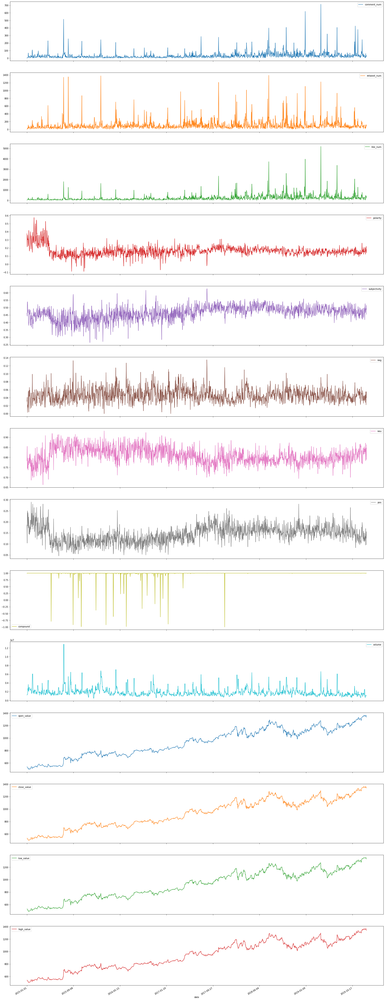

In [ ]:
# getting the columns of interest
col_intr = ['comment_num','retweet_num','like_num','polarity','subjectivity','neg','neu','pos','compound','sentiment','volume','open_value','close_value','low_value','high_value']


googl_sm_ts_same[col_intr].plot(subplots=True,figsize=(30,90))
plt.show()

In [ ]:
pd.options.display.float_format = "{:,.6f}".format

In [ ]:
# preparing the required input data for the model
googl_input_same = googl_sm_ts_same[['pos','neg','subjectivity','open_value','close_value','low_value','high_value']].copy()

# normalizing the features dataframe
scaler_same_googl = MinMaxScaler(feature_range=(0, 1))
scaled_googl_input_same = pd.DataFrame(scaler_same_googl.fit_transform(googl_input_same.values),columns=['pos','neg','subjectivity','open_value','close_value','low_value','high_value'])
# getting the final input dataframe
googl_input_same_final = data_to_input(scaled_googl_input_same,1,1)

# viewing the prepared final input dataframe
display(googl_input_same_final)

,pos(t-1),neg(t-1),subjectivity(t-1),open_value(t-1),close_value(t-1),low_value(t-1),high_value(t-1),open_value(t),close_value(t),low_value(t),high_value(t)
1,0.573770,0.229630,0.542753,0.044521,0.038826,0.045575,0.043978,0.038577,0.037543,0.042884,0.040979
2,0.237705,0.303704,0.491367,0.038577,0.037543,0.042884,0.040979,0.038577,0.037543,0.042884,0.040979
3,0.758197,0.177778,0.742072,0.038577,0.037543,0.042884,0.040979,0.038577,0.037543,0.042884,0.040979
4,0.836066,0.022222,0.756902,0.038577,0.037543,0.042884,0.040979,0.032275,0.025884,0.031134,0.031968
5,0.557377,0.162963,0.641527,0.032275,0.025884,0.031134,0.031968,0.024585,0.011070,0.016982,0.024147
...,...,...,...,...,...,...,...,...,...,...,...
1821,0.200820,0.251852,0.569953,0.979821,1.000000,0.991312,0.995535,1.000000,0.990952,1.000000,1.000000
1822,0.508197,0.348148,0.612601,1.000000,0.990952,1.000000,1.000000,1.000000,0.990952,1.000000,1.000000
1823,0.323770,0.407407,0.634718,1.000000,0.990952,1.000000,1.000000,1.000000,0.990952,1.000000,1.000000
1824,0.348361,0.162963,0.610107,1.000000,0.990952,1.000000,1.000000,0.991686,0.973700,0.982409,0.988382


In [ ]:
# splitting the data into training and testing set (0.7 and 0.3)
# defining the number of instances in training and testing set
train_size = int(0.7*len(googl_input_same_final))
test_size = int(len(googl_input_same_final)-train_size)
print('Number of instances in training set (70%):\n',train_size)
print('Number of instances in testing set (30%):\n',test_size)

# getting the values from dataframes
# for open_value
values_same_ov = googl_input_same_final[['pos(t-1)','neg(t-1)','subjectivity(t-1)','open_value(t-1)','open_value(t)']].values
train_dataset_same_ov = values_same_ov[:train_size, :]
test_dataset_same_ov = values_same_ov[train_size:, :]

# for close_value
values_same_cv = googl_input_same_final[['pos(t-1)','neg(t-1)','subjectivity(t-1)','close_value(t-1)','close_value(t)']].values
train_dataset_same_cv = values_same_cv[:train_size, :]
test_dataset_same_cv = values_same_cv[train_size:, :]

# for low_value
values_same_lv = googl_input_same_final[['pos(t-1)','neg(t-1)','subjectivity(t-1)','low_value(t-1)','low_value(t)']].values
train_dataset_same_lv = values_same_lv[:train_size, :]
test_dataset_same_lv = values_same_lv[train_size:, :]

# for high_value
values_same_hv = googl_input_same_final[['pos(t-1)','neg(t-1)','subjectivity(t-1)','high_value(t-1)','high_value(t)']].values
train_dataset_same_hv = values_same_hv[:train_size, :]
test_dataset_same_hv = values_same_hv[train_size:, :]


# splitting the train and test datasets into input features and output values
# for open_value
xtrain_same_ov, ytrain_same_ov = train_dataset_same_ov[:,0:4], train_dataset_same_ov[:,4]
xtest_same_ov, ytest_same_ov = test_dataset_same_ov[:,0:4], test_dataset_same_ov[:,4]
# for close_value
xtrain_same_cv, ytrain_same_cv = train_dataset_same_cv[:,0:4], train_dataset_same_cv[:,4]
xtest_same_cv, ytest_same_cv = test_dataset_same_cv[:,0:4], test_dataset_same_cv[:,4]
# for low_value
xtrain_same_lv, ytrain_same_lv = train_dataset_same_lv[:,0:4], train_dataset_same_lv[:,4]
xtest_same_lv, ytest_same_lv = test_dataset_same_lv[:,0:4], test_dataset_same_lv[:,4]
# for high_value
xtrain_same_hv, ytrain_same_hv = train_dataset_same_hv[:,0:4], train_dataset_same_hv[:,4]
xtest_same_hv, ytest_same_hv = test_dataset_same_hv[:,0:4], test_dataset_same_hv[:,4]



# reshaping input features in 3D format [samples, timesteps, features]
# for open_value
x_train_same_ov = xtrain_same_ov.reshape((xtrain_same_ov.shape[0], 1, xtrain_same_ov.shape[1]))
x_test_same_ov = xtest_same_ov.reshape((xtest_same_ov.shape[0], 1, xtest_same_ov.shape[1]))
print('\nfor open_value:\n')
print(x_train_same_ov.shape, ytrain_same_ov.shape, x_test_same_ov.shape, ytest_same_ov.shape)

# for close_value
x_train_same_cv = xtrain_same_cv.reshape((xtrain_same_cv.shape[0], 1, xtrain_same_cv.shape[1]))
x_test_same_cv = xtest_same_cv.reshape((xtest_same_cv.shape[0], 1, xtest_same_cv.shape[1]))
print('\nfor close_value:\n')
print(x_train_same_cv.shape, ytrain_same_cv.shape, x_test_same_cv.shape, ytest_same_cv.shape)

# for low_value
x_train_same_lv = xtrain_same_lv.reshape((xtrain_same_lv.shape[0], 1, xtrain_same_lv.shape[1]))
x_test_same_lv = xtest_same_lv.reshape((xtest_same_lv.shape[0], 1, xtest_same_lv.shape[1]))
print('\nfor low_value:\n')
print(x_train_same_lv.shape, ytrain_same_lv.shape, x_test_same_lv.shape, ytest_same_lv.shape)

# for open_value
x_train_same_hv = xtrain_same_hv.reshape((xtrain_same_hv.shape[0], 1, xtrain_same_hv.shape[1]))
x_test_same_hv = xtest_same_hv.reshape((xtest_same_hv.shape[0], 1, xtest_same_hv.shape[1]))
print('\nfor high_value:\n')
print(x_train_same_hv.shape, ytrain_same_hv.shape, x_test_same_hv.shape, ytest_same_hv.shape)

Number of instances in training set (70%):
 1277
Number of instances in testing set (30%):
 548

for open_value:

(1277, 1, 4) (1277,) (548, 1, 4) (548,)

for close_value:

(1277, 1, 4) (1277,) (548, 1, 4) (548,)

for low_value:

(1277, 1, 4) (1277,) (548, 1, 4) (548,)

for high_value:

(1277, 1, 4) (1277,) (548, 1, 4) (548,)


In [ ]:
# Defining the LSTM model
# for open_value
model_same_googl_ov = Sequential()
model_same_googl_ov.add(LSTM(50, input_shape=(x_train_same_ov.shape[1], x_train_same_ov.shape[2])))
model_same_googl_ov.add(Dense(1))
model_same_googl_ov.compile(loss='mae', optimizer='adam')
model_same_googl_ov.build(input_shape=(x_train_same_ov.shape[1], x_train_same_ov.shape[2])) 

# viewing the summary of the model
print('sequential model for googl Open values:\n')
model_same_googl_ov.summary()

# for close_value
model_same_googl_cv = Sequential()
model_same_googl_cv.add(LSTM(50, input_shape=(x_train_same_cv.shape[1], x_train_same_cv.shape[2])))
model_same_googl_cv.add(Dense(1))
model_same_googl_cv.compile(loss='mae', optimizer='adam')
model_same_googl_cv.build(input_shape=(x_train_same_cv.shape[1], x_train_same_cv.shape[2])) 

# viewing the summary of the model
print('\nsequential model for googl Close values:\n')
model_same_googl_cv.summary()

# for low_value
model_same_googl_lv = Sequential()
model_same_googl_lv.add(LSTM(50, input_shape=(x_train_same_lv.shape[1], x_train_same_lv.shape[2])))
model_same_googl_lv.add(Dense(1))
model_same_googl_lv.compile(loss='mae', optimizer='adam')
model_same_googl_lv.build(input_shape=(x_train_same_lv.shape[1], x_train_same_lv.shape[2])) 

# viewing the summary of the model
print('\nsequential model for googl Low values:\n')
model_same_googl_lv.summary()

# for open_value
model_same_googl_hv = Sequential()
model_same_googl_hv.add(LSTM(50, input_shape=(x_train_same_hv.shape[1], x_train_same_hv.shape[2])))
model_same_googl_hv.add(Dense(1))
model_same_googl_hv.compile(loss='mae', optimizer='adam')
model_same_googl_hv.build(input_shape=(x_train_same_hv.shape[1], x_train_same_hv.shape[2])) 

# viewing the summary of the model
print('\nsequential model for googl High values:\n')
model_same_googl_hv.summary()

sequential model for googl Open values:

Model: "sequential_28"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_28 (LSTM)              (None, 50)                11000     
                                                                 
 dense_28 (Dense)            (None, 1)                 51        
                                                                 
Total params: 11,051
Trainable params: 11,051
Non-trainable params: 0
_________________________________________________________________

sequential model for googl Close values:

Model: "sequential_29"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_29 (LSTM)              (None, 50)                11000     
                                                                 
 dense_29 (Dense)            (None, 1)                 51        
        

**For open_value**

Epoch 1/50
18/18 - 3s - loss: 0.2871 - val_loss: 0.5776 - 3s/epoch - 149ms/step
Epoch 2/50
18/18 - 0s - loss: 0.1781 - val_loss: 0.4167 - 99ms/epoch - 6ms/step
Epoch 3/50
18/18 - 0s - loss: 0.1224 - val_loss: 0.3037 - 94ms/epoch - 5ms/step
Epoch 4/50
18/18 - 0s - loss: 0.1256 - val_loss: 0.2644 - 100ms/epoch - 6ms/step
Epoch 5/50
18/18 - 0s - loss: 0.1274 - val_loss: 0.2580 - 92ms/epoch - 5ms/step
Epoch 6/50
18/18 - 0s - loss: 0.1220 - val_loss: 0.2515 - 88ms/epoch - 5ms/step
Epoch 7/50
18/18 - 0s - loss: 0.1161 - val_loss: 0.2394 - 109ms/epoch - 6ms/step
Epoch 8/50
18/18 - 0s - loss: 0.1109 - val_loss: 0.2253 - 120ms/epoch - 7ms/step
Epoch 9/50
18/18 - 0s - loss: 0.1062 - val_loss: 0.2116 - 103ms/epoch - 6ms/step
Epoch 10/50
18/18 - 0s - loss: 0.1011 - val_loss: 0.1982 - 89ms/epoch - 5ms/step
Epoch 11/50
18/18 - 0s - loss: 0.0956 - val_loss: 0.1840 - 101ms/epoch - 6ms/step
Epoch 12/50
18/18 - 0s - loss: 0.0902 - val_loss: 0.1699 - 114ms/epoch - 6ms/step
Epoch 13/50
18/18 - 0s - loss: 

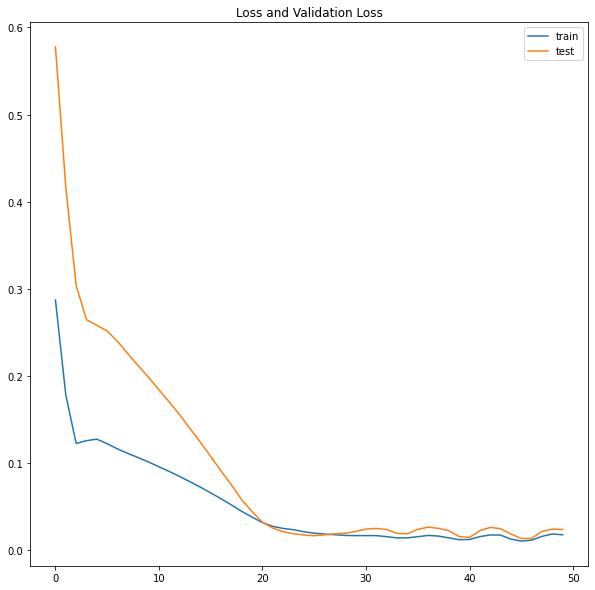

In [ ]:
# fitting the model
history_same_googl_ov = model_same_googl_ov.fit(x_train_same_ov, ytrain_same_ov, epochs=50, batch_size=72, validation_data=(x_test_same_ov, ytest_same_ov), verbose=2, shuffle=False)

# plot history
plt.figure(figsize=(10,10))
plt.plot(history_same_googl_ov.history['loss'], label='train')
plt.plot(history_same_googl_ov.history['val_loss'], label='test')
plt.title('Loss and Validation Loss')
plt.legend()
plt.show()

In [ ]:
# predicting with the help of trained LSTM model
ypred_test_same_ov = model_same_googl_ov.predict(x_test_same_ov)
ypred_train_same_ov = model_same_googl_ov.predict(x_train_same_ov)

# inverting the scaling for predicted train and test values
scaler_cols = ['pos','neg','subjectivity','open_value','close_value','low_value','high_value']
ypred_test_same_ov_inv = inv_transform(scaler_same_googl,ypred_test_same_ov,'open_value',scaler_cols)
ypred_train_same_ov_inv = inv_transform(scaler_same_googl,ypred_train_same_ov,'open_value',scaler_cols)

# inverting the scaling for actual test values
ytest_same_ovn = ytest_same_ov.reshape((len(ytest_same_ov), 1))
ytest_same_ov_inv = inv_transform(scaler_same_googl,ytest_same_ov,'open_value',scaler_cols)

# calculating the RMSE score
rmse_same_ov = np.sqrt(mean_squared_error(ytest_same_ov_inv, ypred_test_same_ov_inv))
print('Test RMSE for googl open_values:\n %.3f' % rmse_same_ov)

Test RMSE for googl open_values:
 24.604


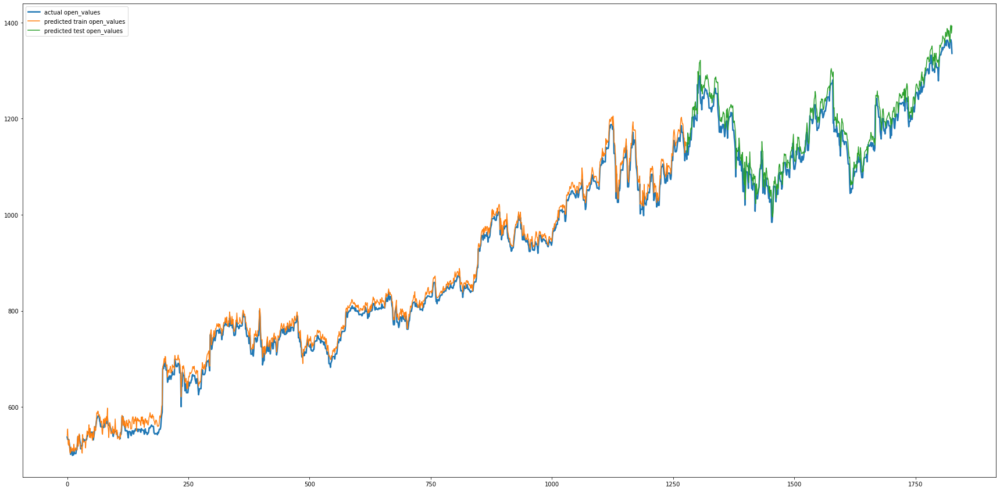

In [ ]:
# plotting original open_values, predicted train open_values and predicted test open_values

# shifting train predictions for plotting
ypred_train_same_ov_inv_plt = np.empty_like(np.array(googl_input_same['open_value']))
ypred_train_same_ov_inv_plt[:] = np.nan
ypred_train_same_ov_inv_plt[0:len(ypred_train_same_ov_inv)] = ypred_train_same_ov_inv

# shifting test predictions for plotting
ypred_test_same_ov_inv_plt = np.empty_like(np.array(googl_input_same['open_value']))
ypred_test_same_ov_inv_plt[:] = np.nan
ypred_test_same_ov_inv_plt[len(ypred_train_same_ov_inv)+1:len(np.array(googl_input_same['open_value']))] = ypred_test_same_ov_inv

plt.figure(figsize=(30,15))
plt.plot(np.array(googl_input_same['open_value']),label='actual open_values',linewidth=2.5)
plt.plot(ypred_train_same_ov_inv_plt,label='predicted train open_values',linestyle='-')
plt.plot(ypred_test_same_ov_inv_plt,label='predicted test open_values',linestyle='-')
plt.legend()
plt.show()

**For close_value**

Epoch 1/50
18/18 - 3s - loss: 0.2608 - val_loss: 0.5451 - 3s/epoch - 144ms/step
Epoch 2/50
18/18 - 0s - loss: 0.1624 - val_loss: 0.3918 - 93ms/epoch - 5ms/step
Epoch 3/50
18/18 - 0s - loss: 0.1199 - val_loss: 0.2969 - 89ms/epoch - 5ms/step
Epoch 4/50
18/18 - 0s - loss: 0.1245 - val_loss: 0.2649 - 111ms/epoch - 6ms/step
Epoch 5/50
18/18 - 0s - loss: 0.1252 - val_loss: 0.2603 - 99ms/epoch - 5ms/step
Epoch 6/50
18/18 - 0s - loss: 0.1194 - val_loss: 0.2525 - 122ms/epoch - 7ms/step
Epoch 7/50
18/18 - 0s - loss: 0.1138 - val_loss: 0.2398 - 97ms/epoch - 5ms/step
Epoch 8/50
18/18 - 0s - loss: 0.1089 - val_loss: 0.2265 - 90ms/epoch - 5ms/step
Epoch 9/50
18/18 - 0s - loss: 0.1039 - val_loss: 0.2132 - 92ms/epoch - 5ms/step
Epoch 10/50
18/18 - 0s - loss: 0.0985 - val_loss: 0.1985 - 101ms/epoch - 6ms/step
Epoch 11/50
18/18 - 0s - loss: 0.0933 - val_loss: 0.1841 - 98ms/epoch - 5ms/step
Epoch 12/50
18/18 - 0s - loss: 0.0876 - val_loss: 0.1684 - 87ms/epoch - 5ms/step
Epoch 13/50
18/18 - 0s - loss: 0.0

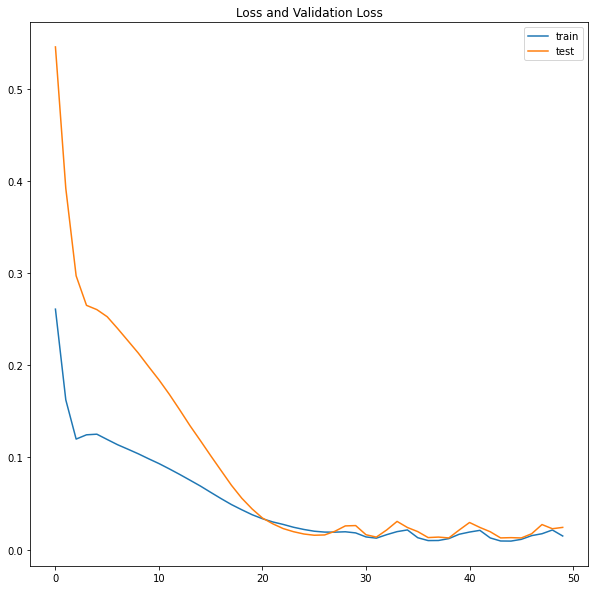

In [ ]:
# fitting the model
history_same_googl_cv = model_same_googl_cv.fit(x_train_same_cv, ytrain_same_cv, epochs=50, batch_size=72, validation_data=(x_test_same_cv, ytest_same_cv), verbose=2, shuffle=False)

# plot history
plt.figure(figsize=(10,10))
plt.plot(history_same_googl_cv.history['loss'], label='train')
plt.plot(history_same_googl_cv.history['val_loss'], label='test')
plt.title('Loss and Validation Loss')
plt.legend()
plt.show()

In [ ]:
# predicting with the help of trained LSTM model
ypred_test_same_cv = model_same_googl_cv.predict(x_test_same_cv)
ypred_train_same_cv = model_same_googl_cv.predict(x_train_same_cv)

# inverting the scaling for predicted train and test values
ypred_test_same_cv_inv = inv_transform(scaler_same_googl,ypred_test_same_cv,'close_value',scaler_cols)
ypred_train_same_cv_inv = inv_transform(scaler_same_googl,ypred_train_same_cv,'close_value',scaler_cols)

# inverting the scaling for actual test values
ytest_same_cvn = ytest_same_cv.reshape((len(ytest_same_cv), 1))
ytest_same_cv_inv = inv_transform(scaler_same_googl,ytest_same_cv,'close_value',scaler_cols)

# calculating the RMSE score
rmse_same_cv = np.sqrt(mean_squared_error(ytest_same_cv_inv, ypred_test_same_cv_inv))
print('Test RMSE for googl close_value: %.3f' % rmse_same_cv)

Test RMSE for googl close_value: 25.112


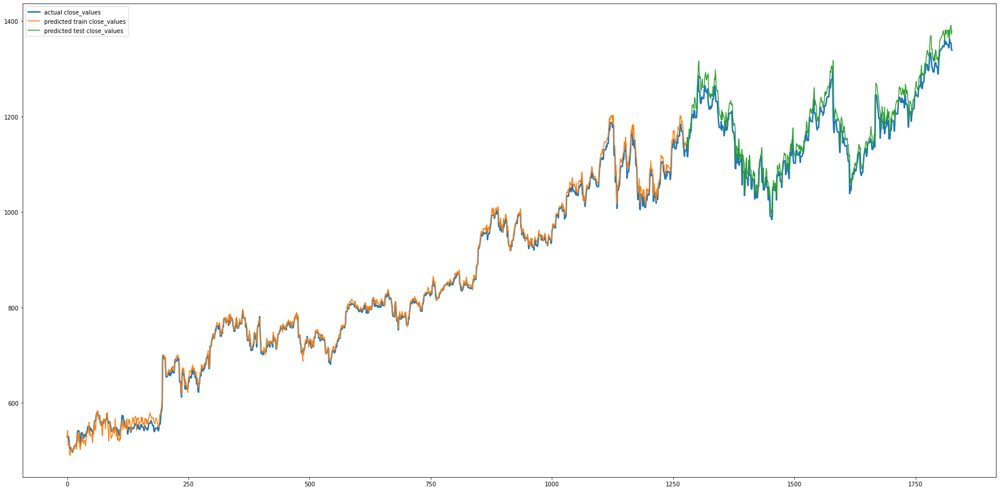

In [ ]:
# plotting original close_values, predicted train close_values and predicted test close_values

# shifting train predictions for plotting
ypred_train_same_cv_inv_plt = np.empty_like(np.array(googl_input_same['close_value']))
ypred_train_same_cv_inv_plt[:] = np.nan
ypred_train_same_cv_inv_plt[0:len(ypred_train_same_cv_inv)] = ypred_train_same_cv_inv

# shifting test predictions for plotting
ypred_test_same_cv_inv_plt = np.empty_like(np.array(googl_input_same['close_value']))
ypred_test_same_cv_inv_plt[:] = np.nan
ypred_test_same_cv_inv_plt[len(ypred_train_same_cv_inv)+1:len(np.array(googl_input_same['close_value']))] = ypred_test_same_cv_inv

plt.figure(figsize=(30,15))
plt.plot(np.array(googl_input_same['close_value']),label='actual close_values',linewidth=2.5)
plt.plot(ypred_train_same_cv_inv_plt,label='predicted train close_values',linestyle='-')
plt.plot(ypred_test_same_cv_inv_plt,label='predicted test close_values',linestyle='-')
plt.legend()
plt.show()

**For low_value**

Epoch 1/50
18/18 - 3s - loss: 0.3014 - val_loss: 0.6322 - 3s/epoch - 143ms/step
Epoch 2/50
18/18 - 0s - loss: 0.2119 - val_loss: 0.4988 - 76ms/epoch - 4ms/step
Epoch 3/50
18/18 - 0s - loss: 0.1454 - val_loss: 0.3713 - 90ms/epoch - 5ms/step
Epoch 4/50
18/18 - 0s - loss: 0.1299 - val_loss: 0.3043 - 95ms/epoch - 5ms/step
Epoch 5/50
18/18 - 0s - loss: 0.1344 - val_loss: 0.2835 - 92ms/epoch - 5ms/step
Epoch 6/50
18/18 - 0s - loss: 0.1325 - val_loss: 0.2771 - 90ms/epoch - 5ms/step
Epoch 7/50
18/18 - 0s - loss: 0.1272 - val_loss: 0.2683 - 102ms/epoch - 6ms/step
Epoch 8/50
18/18 - 0s - loss: 0.1220 - val_loss: 0.2557 - 95ms/epoch - 5ms/step
Epoch 9/50
18/18 - 0s - loss: 0.1172 - val_loss: 0.2426 - 88ms/epoch - 5ms/step
Epoch 10/50
18/18 - 0s - loss: 0.1125 - val_loss: 0.2297 - 98ms/epoch - 5ms/step
Epoch 11/50
18/18 - 0s - loss: 0.1073 - val_loss: 0.2162 - 90ms/epoch - 5ms/step
Epoch 12/50
18/18 - 0s - loss: 0.1020 - val_loss: 0.2019 - 93ms/epoch - 5ms/step
Epoch 13/50
18/18 - 0s - loss: 0.096

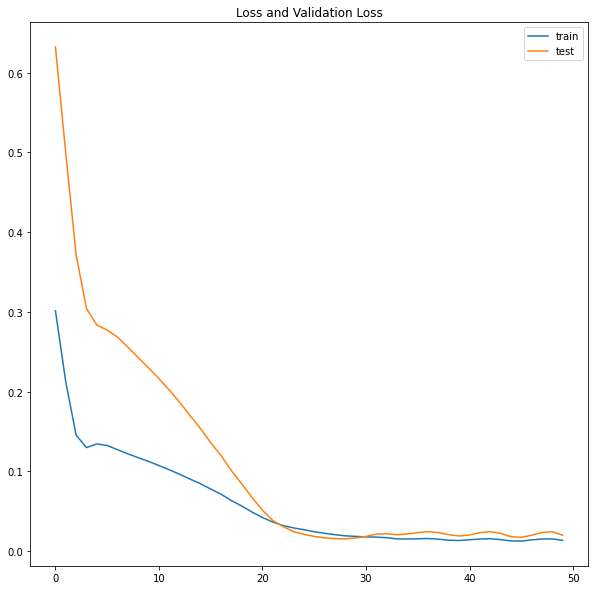

In [ ]:
# fitting the model
history_same_googl_lv = model_same_googl_lv.fit(x_train_same_lv, ytrain_same_lv, epochs=50, batch_size=72, validation_data=(x_test_same_lv, ytest_same_lv), verbose=2, shuffle=False)

# plot history
plt.figure(figsize=(10,10))
plt.plot(history_same_googl_lv.history['loss'], label='train')
plt.plot(history_same_googl_lv.history['val_loss'], label='test')
plt.title('Loss and Validation Loss')
plt.legend()
plt.show()

In [ ]:
# predicting with the help of trained LSTM model
ypred_test_same_lv = model_same_googl_lv.predict(x_test_same_lv)
ypred_train_same_lv = model_same_googl_lv.predict(x_train_same_lv)

# inverting the scaling for predicted train and test values
ypred_test_same_lv_inv = inv_transform(scaler_same_googl,ypred_test_same_lv,'low_value',scaler_cols)
ypred_train_same_lv_inv = inv_transform(scaler_same_googl,ypred_train_same_lv,'low_value',scaler_cols)

# inverting the scaling for actual test values
ytest_same_lvn = ytest_same_lv.reshape((len(ytest_same_lv), 1))
ytest_same_lv_inv = inv_transform(scaler_same_googl,ytest_same_lv,'low_value',scaler_cols)

# calculating the RMSE score
rmse_same_lv = np.sqrt(mean_squared_error(ytest_same_lv_inv, ypred_test_same_lv_inv))
print('Test RMSE for googl low_value: %.3f' % rmse_same_lv)

Test RMSE for googl low_value: 21.333


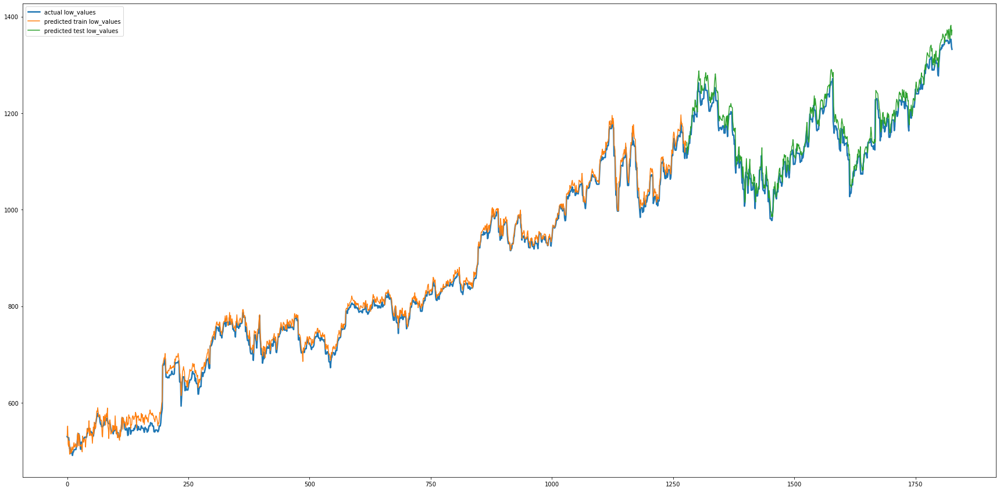

In [ ]:
# plotting original low_values, predicted train low_values and predicted test low_values

# shifting train predictions for plotting
ypred_train_same_lv_inv_plt = np.empty_like(np.array(googl_input_same['low_value']))
ypred_train_same_lv_inv_plt[:] = np.nan
ypred_train_same_lv_inv_plt[0:len(ypred_train_same_lv_inv)] = ypred_train_same_lv_inv

# shifting test predictions for plotting
ypred_test_same_lv_inv_plt = np.empty_like(np.array(googl_input_same['low_value']))
ypred_test_same_lv_inv_plt[:] = np.nan
ypred_test_same_lv_inv_plt[len(ypred_train_same_lv_inv)+1:len(np.array(googl_input_same['low_value']))] = ypred_test_same_lv_inv

plt.figure(figsize=(30,15))
plt.plot(np.array(googl_input_same['low_value']),label='actual low_values',linewidth=2.5)
plt.plot(ypred_train_same_lv_inv_plt,label='predicted train low_values',linestyle='-')
plt.plot(ypred_test_same_lv_inv_plt,label='predicted test low_values',linestyle='-')
plt.legend()
plt.show()

**For high_value**

Epoch 1/50
18/18 - 2s - loss: 0.2795 - val_loss: 0.5823 - 2s/epoch - 137ms/step
Epoch 2/50
18/18 - 0s - loss: 0.1800 - val_loss: 0.4294 - 67ms/epoch - 4ms/step
Epoch 3/50
18/18 - 0s - loss: 0.1229 - val_loss: 0.3165 - 94ms/epoch - 5ms/step
Epoch 4/50
18/18 - 0s - loss: 0.1262 - val_loss: 0.2785 - 89ms/epoch - 5ms/step
Epoch 5/50
18/18 - 0s - loss: 0.1284 - val_loss: 0.2742 - 78ms/epoch - 4ms/step
Epoch 6/50
18/18 - 0s - loss: 0.1230 - val_loss: 0.2680 - 99ms/epoch - 5ms/step
Epoch 7/50
18/18 - 0s - loss: 0.1173 - val_loss: 0.2553 - 100ms/epoch - 6ms/step
Epoch 8/50
18/18 - 0s - loss: 0.1130 - val_loss: 0.2426 - 89ms/epoch - 5ms/step
Epoch 9/50
18/18 - 0s - loss: 0.1086 - val_loss: 0.2305 - 87ms/epoch - 5ms/step
Epoch 10/50
18/18 - 0s - loss: 0.1039 - val_loss: 0.2178 - 91ms/epoch - 5ms/step
Epoch 11/50
18/18 - 0s - loss: 0.0990 - val_loss: 0.2044 - 94ms/epoch - 5ms/step
Epoch 12/50
18/18 - 0s - loss: 0.0939 - val_loss: 0.1896 - 87ms/epoch - 5ms/step
Epoch 13/50
18/18 - 0s - loss: 0.089

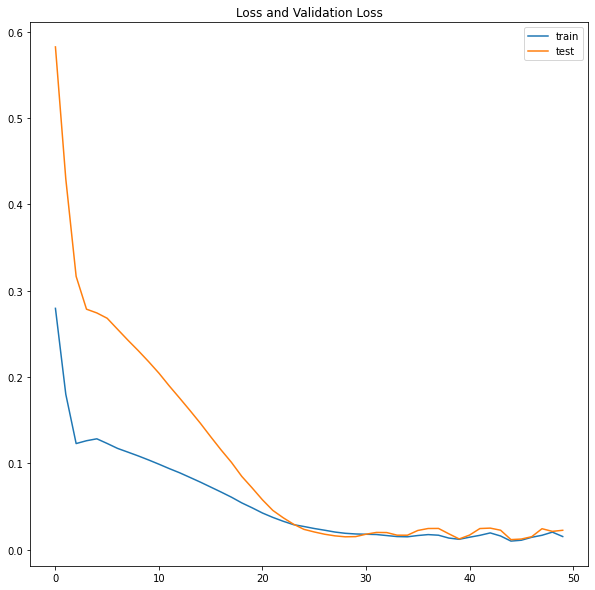

In [ ]:
# fitting the model
history_same_googl_hv = model_same_googl_hv.fit(x_train_same_hv, ytrain_same_hv, epochs=50, batch_size=72, validation_data=(x_test_same_hv, ytest_same_hv), verbose=2, shuffle=False)

# plot history
plt.figure(figsize=(10,10))
plt.plot(history_same_googl_hv.history['loss'], label='train')
plt.plot(history_same_googl_hv.history['val_loss'], label='test')
plt.title('Loss and Validation Loss')
plt.legend()
plt.show()

In [ ]:
# predicting with the help of trained LSTM model
ypred_test_same_hv = model_same_googl_hv.predict(x_test_same_hv)
ypred_train_same_hv = model_same_googl_hv.predict(x_train_same_hv)

# inverting the scaling for predicted train and test values
ypred_test_same_hv_inv = inv_transform(scaler_same_googl,ypred_test_same_hv,'high_value',scaler_cols)
ypred_train_same_hv_inv = inv_transform(scaler_same_googl,ypred_train_same_hv,'high_value',scaler_cols)

# inverting the scaling for actual test values
ytest_same_hvn = ytest_same_hv.reshape((len(ytest_same_hv), 1))
ytest_same_hv_inv = inv_transform(scaler_same_googl,ytest_same_hv,'high_value',scaler_cols)

# calculating the RMSE score
rmse_same_hv = np.sqrt(mean_squared_error(ytest_same_hv_inv, ypred_test_same_hv_inv))
print('Test RMSE for googl high_value: %.3f' % rmse_same_hv)

Test RMSE for googl high_value: 23.145


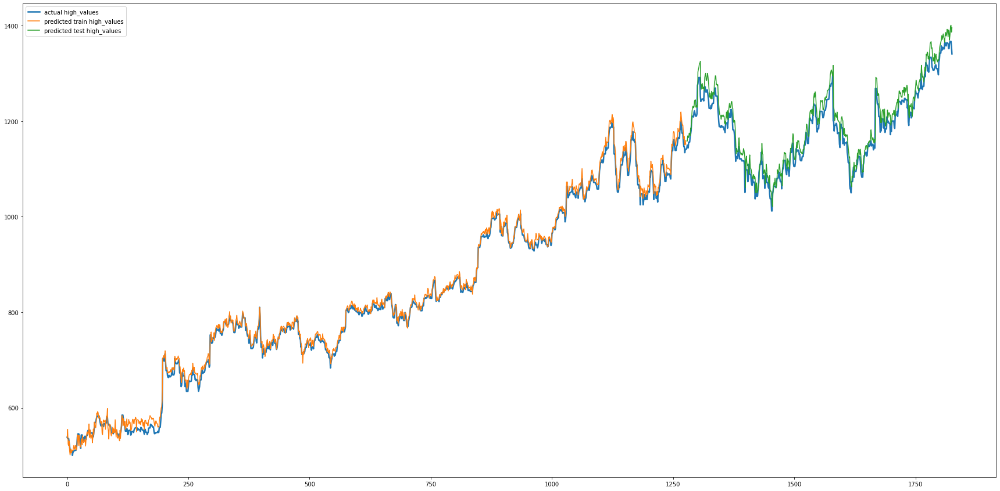

In [ ]:
# plotting original high_values, predicted train high_values and predicted test high_values

# shifting train predictions for plotting
ypred_train_same_hv_inv_plt = np.empty_like(np.array(googl_input_same['high_value']))
ypred_train_same_hv_inv_plt[:] = np.nan
ypred_train_same_hv_inv_plt[0:len(ypred_train_same_hv_inv)] = ypred_train_same_hv_inv

# shifting test predictions for plotting
ypred_test_same_hv_inv_plt = np.empty_like(np.array(googl_input_same['high_value']))
ypred_test_same_hv_inv_plt[:] = np.nan
ypred_test_same_hv_inv_plt[len(ypred_train_same_hv_inv)+1:len(np.array(googl_input_same['high_value']))] = ypred_test_same_hv_inv

plt.figure(figsize=(30,15))
plt.plot(np.array(googl_input_same['high_value']),label='actual high_values',linewidth=2.5)
plt.plot(ypred_train_same_hv_inv_plt,label='predicted train high_values',linestyle='-')
plt.plot(ypred_test_same_hv_inv_plt,label='predicted test high_values',linestyle='-')
plt.legend()
plt.show()

**Using Last 3 Days tweets and stock market data**

In [ ]:
# viewng info of the dataframe before setting the index
print('info of the dataframe before changing the index:\n')
print(googl_sm_ts_3d.info())

info of the dataframe before changing the index:

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1824 entries, 0 to 1823
Data columns (total 18 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   date           1824 non-null   object 
 1   ticker_symbol  1824 non-null   object 
 2   clean_text     1824 non-null   object 
 3   comment_num    1824 non-null   int64  
 4   retweet_num    1824 non-null   int64  
 5   like_num       1824 non-null   int64  
 6   polarity       1824 non-null   float64
 7   subjectivity   1824 non-null   float64
 8   neg            1824 non-null   float64
 9   neu            1824 non-null   float64
 10  pos            1824 non-null   float64
 11  compound       1824 non-null   float64
 12  sentiment      1824 non-null   object 
 13  volume         1824 non-null   int64  
 14  open_value     1824 non-null   float64
 15  close_value    1824 non-null   float64
 16  low_value      1824 non-null   float64
 17  hi

In [ ]:
# changing the index to datetime column and viewing the info again
googl_sm_ts_3d.set_index('date',inplace=True,drop=True)
print('info of the dataframe after changing the index:\n')
print(googl_sm_ts_3d.info())

info of the dataframe after changing the index:

<class 'pandas.core.frame.DataFrame'>
Index: 1824 entries, 2015-01-03 to 2019-12-31
Data columns (total 17 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   ticker_symbol  1824 non-null   object 
 1   clean_text     1824 non-null   object 
 2   comment_num    1824 non-null   int64  
 3   retweet_num    1824 non-null   int64  
 4   like_num       1824 non-null   int64  
 5   polarity       1824 non-null   float64
 6   subjectivity   1824 non-null   float64
 7   neg            1824 non-null   float64
 8   neu            1824 non-null   float64
 9   pos            1824 non-null   float64
 10  compound       1824 non-null   float64
 11  sentiment      1824 non-null   object 
 12  volume         1824 non-null   int64  
 13  open_value     1824 non-null   float64
 14  close_value    1824 non-null   float64
 15  low_value      1824 non-null   float64
 16  high_value     1824 non-null   float6

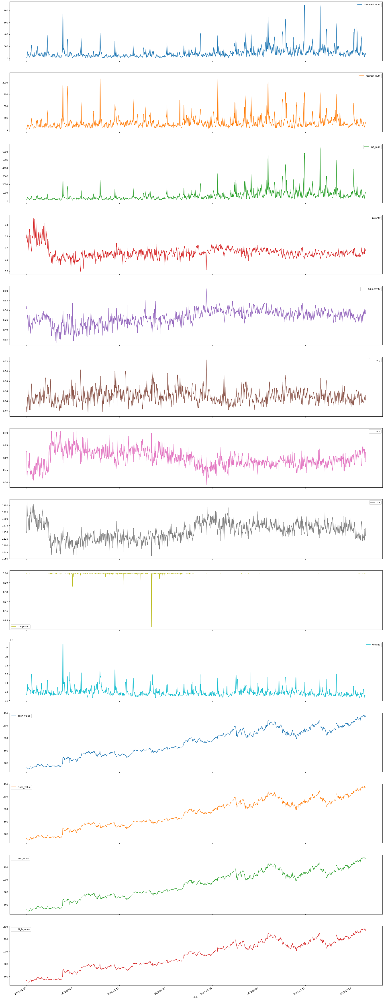

In [ ]:
# getting the columns of interest
col_intr = ['comment_num','retweet_num','like_num','polarity','subjectivity','neg','neu','pos','compound','sentiment','volume','open_value','close_value','low_value','high_value']


googl_sm_ts_3d[col_intr].plot(subplots=True,figsize=(30,90))
plt.show()

In [ ]:
pd.options.display.float_format = "{:,.6f}".format

In [ ]:
# preparing the required input data for the model
googl_input_3d = googl_sm_ts_3d[['pos','neg','subjectivity','open_value','close_value','low_value','high_value']].copy()

# normalizing the features dataframe
scaler_3d_googl = MinMaxScaler(feature_range=(0, 1))
scaled_googl_input_3d = pd.DataFrame(scaler_3d_googl.fit_transform(googl_input_3d.values),columns=['pos','neg','subjectivity','open_value','close_value','low_value','high_value'])
# getting the final input dataframe
googl_input_3d_final = data_to_input(scaled_googl_input_3d,1,1)

# viewing the prepared final input dataframe
display(googl_input_3d_final)

,pos(t-1),neg(t-1),subjectivity(t-1),open_value(t-1),close_value(t-1),low_value(t-1),high_value(t-1),open_value(t),close_value(t),low_value(t),high_value(t)
1,0.433498,0.129630,0.622406,0.038577,0.037543,0.042884,0.040979,0.038577,0.037543,0.042884,0.040979
2,0.467980,0.027778,0.679420,0.038577,0.037543,0.042884,0.040979,0.032275,0.025884,0.031134,0.031968
3,0.931034,0.037037,0.673762,0.032275,0.025884,0.031134,0.031968,0.024585,0.011070,0.016982,0.024147
4,1.000000,0.009259,0.585303,0.024585,0.011070,0.016982,0.024147,0.013541,0.009348,0.014778,0.012933
5,0.931034,0.083333,0.510790,0.013541,0.009348,0.014778,0.012933,0.002625,0.011382,0.004767,0.008330
...,...,...,...,...,...,...,...,...,...,...,...
1819,0.290640,0.277778,0.554192,0.979821,1.000000,0.991312,0.995535,1.000000,0.990952,1.000000,1.000000
1820,0.492611,0.250000,0.527360,1.000000,0.990952,1.000000,1.000000,1.000000,0.990952,1.000000,1.000000
1821,0.458128,0.277778,0.539107,1.000000,0.990952,1.000000,1.000000,1.000000,0.990952,1.000000,1.000000
1822,0.507389,0.305556,0.556999,1.000000,0.990952,1.000000,1.000000,0.991686,0.973700,0.982409,0.988382


In [ ]:
# splitting the data into training and testing set (0.7 and 0.3)
# defining the number of instances in training and testing set
train_size = int(0.7*len(googl_input_3d_final))
test_size = int(len(googl_input_3d_final)-train_size)
print('Number of instances in training set (70%):\n',train_size)
print('Number of instances in testing set (30%):\n',test_size)

# getting the values from dataframes
# for open_value
values_3d_ov = googl_input_3d_final[['pos(t-1)','neg(t-1)','subjectivity(t-1)','open_value(t-1)','open_value(t)']].values
train_dataset_3d_ov = values_3d_ov[:train_size, :]
test_dataset_3d_ov = values_3d_ov[train_size:, :]

# for close_value
values_3d_cv = googl_input_3d_final[['pos(t-1)','neg(t-1)','subjectivity(t-1)','close_value(t-1)','close_value(t)']].values
train_dataset_3d_cv = values_3d_cv[:train_size, :]
test_dataset_3d_cv = values_3d_cv[train_size:, :]

# for low_value
values_3d_lv = googl_input_3d_final[['pos(t-1)','neg(t-1)','subjectivity(t-1)','low_value(t-1)','low_value(t)']].values
train_dataset_3d_lv = values_3d_lv[:train_size, :]
test_dataset_3d_lv = values_3d_lv[train_size:, :]

# for high_value
values_3d_hv = googl_input_3d_final[['pos(t-1)','neg(t-1)','subjectivity(t-1)','high_value(t-1)','high_value(t)']].values
train_dataset_3d_hv = values_3d_hv[:train_size, :]
test_dataset_3d_hv = values_3d_hv[train_size:, :]


# splitting the train and test datasets into input features and output values
# for open_value
xtrain_3d_ov, ytrain_3d_ov = train_dataset_3d_ov[:,0:4], train_dataset_3d_ov[:,4]
xtest_3d_ov, ytest_3d_ov = test_dataset_3d_ov[:,0:4], test_dataset_3d_ov[:,4]
# for close_value
xtrain_3d_cv, ytrain_3d_cv = train_dataset_3d_cv[:,0:4], train_dataset_3d_cv[:,4]
xtest_3d_cv, ytest_3d_cv = test_dataset_3d_cv[:,0:4], test_dataset_3d_cv[:,4]
# for low_value
xtrain_3d_lv, ytrain_3d_lv = train_dataset_3d_lv[:,0:4], train_dataset_3d_lv[:,4]
xtest_3d_lv, ytest_3d_lv = test_dataset_3d_lv[:,0:4], test_dataset_3d_lv[:,4]
# for high_value
xtrain_3d_hv, ytrain_3d_hv = train_dataset_3d_hv[:,0:4], train_dataset_3d_hv[:,4]
xtest_3d_hv, ytest_3d_hv = test_dataset_3d_hv[:,0:4], test_dataset_3d_hv[:,4]



# reshaping input features in 3D format [samples, timesteps, features]
# for open_value
x_train_3d_ov = xtrain_3d_ov.reshape((xtrain_3d_ov.shape[0], 1, xtrain_3d_ov.shape[1]))
x_test_3d_ov = xtest_3d_ov.reshape((xtest_3d_ov.shape[0], 1, xtest_3d_ov.shape[1]))
print('\nfor open_value:\n')
print(x_train_3d_ov.shape, ytrain_3d_ov.shape, x_test_3d_ov.shape, ytest_3d_ov.shape)

# for close_value
x_train_3d_cv = xtrain_3d_cv.reshape((xtrain_3d_cv.shape[0], 1, xtrain_3d_cv.shape[1]))
x_test_3d_cv = xtest_3d_cv.reshape((xtest_3d_cv.shape[0], 1, xtest_3d_cv.shape[1]))
print('\nfor close_value:\n')
print(x_train_3d_cv.shape, ytrain_3d_cv.shape, x_test_3d_cv.shape, ytest_3d_cv.shape)

# for low_value
x_train_3d_lv = xtrain_3d_lv.reshape((xtrain_3d_lv.shape[0], 1, xtrain_3d_lv.shape[1]))
x_test_3d_lv = xtest_3d_lv.reshape((xtest_3d_lv.shape[0], 1, xtest_3d_lv.shape[1]))
print('\nfor low_value:\n')
print(x_train_3d_lv.shape, ytrain_3d_lv.shape, x_test_3d_lv.shape, ytest_3d_lv.shape)

# for open_value
x_train_3d_hv = xtrain_3d_hv.reshape((xtrain_3d_hv.shape[0], 1, xtrain_3d_hv.shape[1]))
x_test_3d_hv = xtest_3d_hv.reshape((xtest_3d_hv.shape[0], 1, xtest_3d_hv.shape[1]))
print('\nfor high_value:\n')
print(x_train_3d_hv.shape, ytrain_3d_hv.shape, x_test_3d_hv.shape, ytest_3d_hv.shape)

Number of instances in training set (70%):
 1276
Number of instances in testing set (30%):
 547

for open_value:

(1276, 1, 4) (1276,) (547, 1, 4) (547,)

for close_value:

(1276, 1, 4) (1276,) (547, 1, 4) (547,)

for low_value:

(1276, 1, 4) (1276,) (547, 1, 4) (547,)

for high_value:

(1276, 1, 4) (1276,) (547, 1, 4) (547,)


In [ ]:
# Defining the LSTM model
# for open_value
model_3d_googl_ov = Sequential()
model_3d_googl_ov.add(LSTM(50, input_shape=(x_train_3d_ov.shape[1], x_train_3d_ov.shape[2])))
model_3d_googl_ov.add(Dense(1))
model_3d_googl_ov.compile(loss='mae', optimizer='adam')
model_3d_googl_ov.build(input_shape=(x_train_3d_ov.shape[1], x_train_3d_ov.shape[2])) 

# viewing the summary of the model
print('sequential model for googl Open values:\n')
model_3d_googl_ov.summary()

# for close_value
model_3d_googl_cv = Sequential()
model_3d_googl_cv.add(LSTM(50, input_shape=(x_train_3d_cv.shape[1], x_train_3d_cv.shape[2])))
model_3d_googl_cv.add(Dense(1))
model_3d_googl_cv.compile(loss='mae', optimizer='adam')
model_3d_googl_cv.build(input_shape=(x_train_3d_cv.shape[1], x_train_3d_cv.shape[2])) 

# viewing the summary of the model
print('\nsequential model for googl Close values:\n')
model_3d_googl_cv.summary()

# for low_value
model_3d_googl_lv = Sequential()
model_3d_googl_lv.add(LSTM(50, input_shape=(x_train_3d_lv.shape[1], x_train_3d_lv.shape[2])))
model_3d_googl_lv.add(Dense(1))
model_3d_googl_lv.compile(loss='mae', optimizer='adam')
model_3d_googl_lv.build(input_shape=(x_train_3d_lv.shape[1], x_train_3d_lv.shape[2])) 

# viewing the summary of the model
print('\nsequential model for googl Low values:\n')
model_3d_googl_lv.summary()

# for open_value
model_3d_googl_hv = Sequential()
model_3d_googl_hv.add(LSTM(50, input_shape=(x_train_3d_hv.shape[1], x_train_3d_hv.shape[2])))
model_3d_googl_hv.add(Dense(1))
model_3d_googl_hv.compile(loss='mae', optimizer='adam')
model_3d_googl_hv.build(input_shape=(x_train_3d_hv.shape[1], x_train_3d_hv.shape[2])) 

# viewing the summary of the model
print('\nsequential model for googl High values:\n')
model_3d_googl_hv.summary()

sequential model for googl Open values:

Model: "sequential_32"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_32 (LSTM)              (None, 50)                11000     
                                                                 
 dense_32 (Dense)            (None, 1)                 51        
                                                                 
Total params: 11,051
Trainable params: 11,051
Non-trainable params: 0
_________________________________________________________________

sequential model for googl Close values:

Model: "sequential_33"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_33 (LSTM)              (None, 50)                11000     
                                                                 
 dense_33 (Dense)            (None, 1)                 51        
        

**For open_value**

Epoch 1/50
18/18 - 2s - loss: 0.3145 - val_loss: 0.6314 - 2s/epoch - 136ms/step
Epoch 2/50
18/18 - 0s - loss: 0.2137 - val_loss: 0.4927 - 83ms/epoch - 5ms/step
Epoch 3/50
18/18 - 0s - loss: 0.1363 - val_loss: 0.3527 - 70ms/epoch - 4ms/step
Epoch 4/50
18/18 - 0s - loss: 0.1158 - val_loss: 0.2825 - 74ms/epoch - 4ms/step
Epoch 5/50
18/18 - 0s - loss: 0.1210 - val_loss: 0.2636 - 82ms/epoch - 5ms/step
Epoch 6/50
18/18 - 0s - loss: 0.1182 - val_loss: 0.2592 - 90ms/epoch - 5ms/step
Epoch 7/50
18/18 - 0s - loss: 0.1118 - val_loss: 0.2499 - 86ms/epoch - 5ms/step
Epoch 8/50
18/18 - 0s - loss: 0.1057 - val_loss: 0.2356 - 85ms/epoch - 5ms/step
Epoch 9/50
18/18 - 0s - loss: 0.1007 - val_loss: 0.2213 - 84ms/epoch - 5ms/step
Epoch 10/50
18/18 - 0s - loss: 0.0955 - val_loss: 0.2076 - 88ms/epoch - 5ms/step
Epoch 11/50
18/18 - 0s - loss: 0.0901 - val_loss: 0.1942 - 91ms/epoch - 5ms/step
Epoch 12/50
18/18 - 0s - loss: 0.0845 - val_loss: 0.1803 - 82ms/epoch - 5ms/step
Epoch 13/50
18/18 - 0s - loss: 0.0787

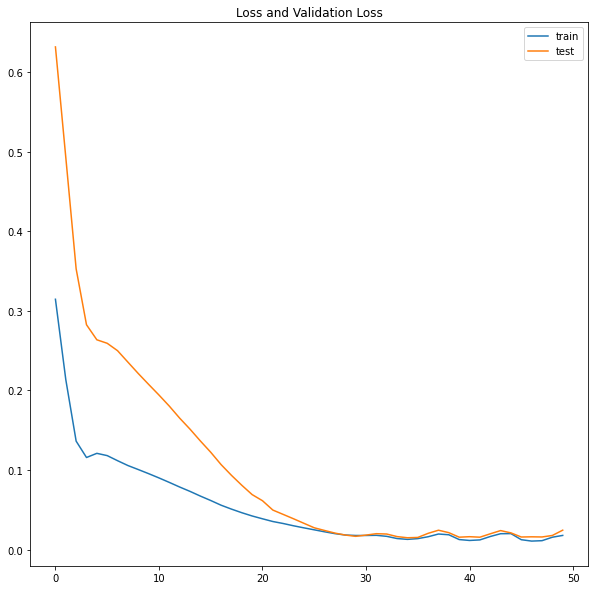

In [ ]:
# fitting the model
history_3d_googl_ov = model_3d_googl_ov.fit(x_train_3d_ov, ytrain_3d_ov, epochs=50, batch_size=72, validation_data=(x_test_3d_ov, ytest_3d_ov), verbose=2, shuffle=False)

# plot history
plt.figure(figsize=(10,10))
plt.plot(history_3d_googl_ov.history['loss'], label='train')
plt.plot(history_3d_googl_ov.history['val_loss'], label='test')
plt.title('Loss and Validation Loss')
plt.legend()
plt.show()

In [ ]:
# predicting with the help of trained LSTM model
ypred_test_3d_ov = model_3d_googl_ov.predict(x_test_3d_ov)
ypred_train_3d_ov = model_3d_googl_ov.predict(x_train_3d_ov)

# inverting the scaling for predicted train and test values
scaler_cols = ['pos','neg','subjectivity','open_value','close_value','low_value','high_value']
ypred_test_3d_ov_inv = inv_transform(scaler_3d_googl,ypred_test_3d_ov,'open_value',scaler_cols)
ypred_train_3d_ov_inv = inv_transform(scaler_3d_googl,ypred_train_3d_ov,'open_value',scaler_cols)

# inverting the scaling for actual test values
ytest_3d_ovn = ytest_3d_ov.reshape((len(ytest_3d_ov), 1))
ytest_3d_ov_inv = inv_transform(scaler_3d_googl,ytest_3d_ov,'open_value',scaler_cols)

# calculating the RMSE score
rmse_3d_ov = np.sqrt(mean_squared_error(ytest_3d_ov_inv, ypred_test_3d_ov_inv))
print('Test RMSE for googl open_values:\n %.3f' % rmse_3d_ov)

Test RMSE for googl open_values:
 25.810


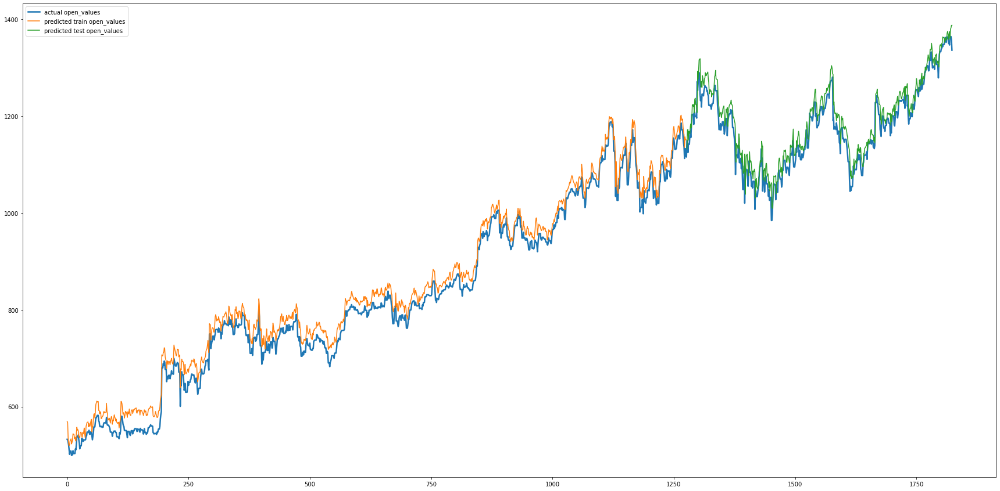

In [ ]:
# plotting original open_values, predicted train open_values and predicted test open_values

# shifting train predictions for plotting
ypred_train_3d_ov_inv_plt = np.empty_like(np.array(googl_input_3d['open_value']))
ypred_train_3d_ov_inv_plt[:] = np.nan
ypred_train_3d_ov_inv_plt[0:len(ypred_train_3d_ov_inv)] = ypred_train_3d_ov_inv

# shifting test predictions for plotting
ypred_test_3d_ov_inv_plt = np.empty_like(np.array(googl_input_3d['open_value']))
ypred_test_3d_ov_inv_plt[:] = np.nan
ypred_test_3d_ov_inv_plt[len(ypred_train_3d_ov_inv)+1:len(np.array(googl_input_3d['open_value']))] = ypred_test_3d_ov_inv

plt.figure(figsize=(30,15))
plt.plot(np.array(googl_input_3d['open_value']),label='actual open_values',linewidth=2.5)
plt.plot(ypred_train_3d_ov_inv_plt,label='predicted train open_values',linestyle='-')
plt.plot(ypred_test_3d_ov_inv_plt,label='predicted test open_values',linestyle='-')
plt.legend()
plt.show()

**For close_value**

Epoch 1/50
18/18 - 3s - loss: 0.3505 - val_loss: 0.6664 - 3s/epoch - 141ms/step
Epoch 2/50
18/18 - 0s - loss: 0.2271 - val_loss: 0.5140 - 83ms/epoch - 5ms/step
Epoch 3/50
18/18 - 0s - loss: 0.1422 - val_loss: 0.3641 - 84ms/epoch - 5ms/step
Epoch 4/50
18/18 - 0s - loss: 0.1191 - val_loss: 0.2901 - 83ms/epoch - 5ms/step
Epoch 5/50
18/18 - 0s - loss: 0.1255 - val_loss: 0.2722 - 88ms/epoch - 5ms/step
Epoch 6/50
18/18 - 0s - loss: 0.1221 - val_loss: 0.2674 - 78ms/epoch - 4ms/step
Epoch 7/50
18/18 - 0s - loss: 0.1153 - val_loss: 0.2554 - 75ms/epoch - 4ms/step
Epoch 8/50
18/18 - 0s - loss: 0.1096 - val_loss: 0.2406 - 81ms/epoch - 4ms/step
Epoch 9/50
18/18 - 0s - loss: 0.1045 - val_loss: 0.2264 - 97ms/epoch - 5ms/step
Epoch 10/50
18/18 - 0s - loss: 0.0988 - val_loss: 0.2114 - 79ms/epoch - 4ms/step
Epoch 11/50
18/18 - 0s - loss: 0.0932 - val_loss: 0.1964 - 96ms/epoch - 5ms/step
Epoch 12/50
18/18 - 0s - loss: 0.0870 - val_loss: 0.1796 - 92ms/epoch - 5ms/step
Epoch 13/50
18/18 - 0s - loss: 0.0809

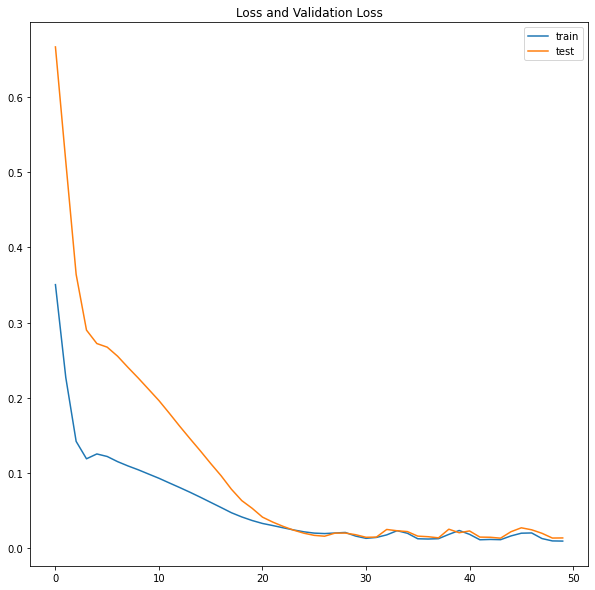

In [ ]:
# fitting the model
history_3d_googl_cv = model_3d_googl_cv.fit(x_train_3d_cv, ytrain_3d_cv, epochs=50, batch_size=72, validation_data=(x_test_3d_cv, ytest_3d_cv), verbose=2, shuffle=False)

# plot history
plt.figure(figsize=(10,10))
plt.plot(history_3d_googl_cv.history['loss'], label='train')
plt.plot(history_3d_googl_cv.history['val_loss'], label='test')
plt.title('Loss and Validation Loss')
plt.legend()
plt.show()

In [ ]:
# predicting with the help of trained LSTM model
ypred_test_3d_cv = model_3d_googl_cv.predict(x_test_3d_cv)
ypred_train_3d_cv = model_3d_googl_cv.predict(x_train_3d_cv)

# inverting the scaling for predicted train and test values
ypred_test_3d_cv_inv = inv_transform(scaler_3d_googl,ypred_test_3d_cv,'close_value',scaler_cols)
ypred_train_3d_cv_inv = inv_transform(scaler_3d_googl,ypred_train_3d_cv,'close_value',scaler_cols)

# inverting the scaling for actual test values
ytest_3d_cvn = ytest_3d_cv.reshape((len(ytest_3d_cv), 1))
ytest_3d_cv_inv = inv_transform(scaler_3d_googl,ytest_3d_cv,'close_value',scaler_cols)

# calculating the RMSE score
rmse_3d_cv = np.sqrt(mean_squared_error(ytest_3d_cv_inv, ypred_test_3d_cv_inv))
print('Test RMSE for googl close_value: %.3f' % rmse_3d_cv)

Test RMSE for googl close_value: 17.046


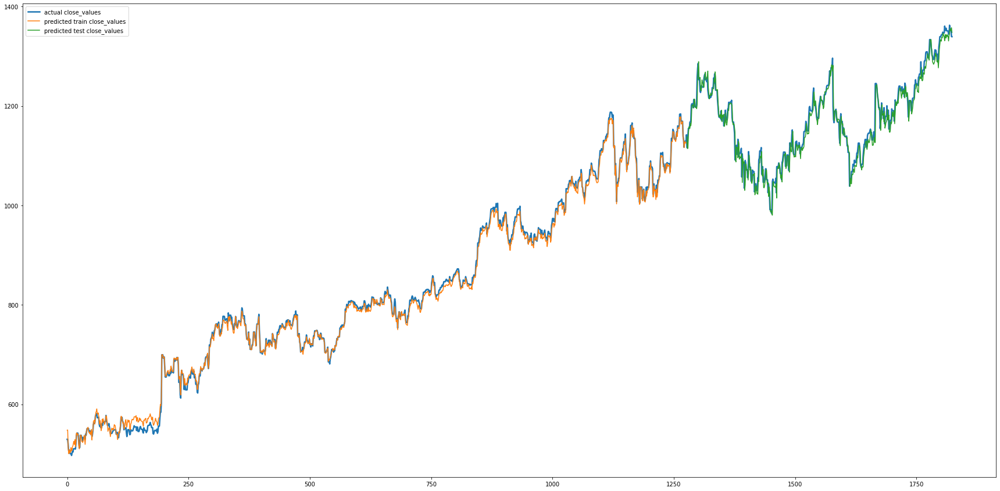

In [ ]:
# plotting original close_values, predicted train close_values and predicted test close_values

# shifting train predictions for plotting
ypred_train_3d_cv_inv_plt = np.empty_like(np.array(googl_input_3d['close_value']))
ypred_train_3d_cv_inv_plt[:] = np.nan
ypred_train_3d_cv_inv_plt[0:len(ypred_train_3d_cv_inv)] = ypred_train_3d_cv_inv

# shifting test predictions for plotting
ypred_test_3d_cv_inv_plt = np.empty_like(np.array(googl_input_3d['close_value']))
ypred_test_3d_cv_inv_plt[:] = np.nan
ypred_test_3d_cv_inv_plt[len(ypred_train_3d_cv_inv)+1:len(np.array(googl_input_3d['close_value']))] = ypred_test_3d_cv_inv

plt.figure(figsize=(30,15))
plt.plot(np.array(googl_input_3d['close_value']),label='actual close_values',linewidth=2.5)
plt.plot(ypred_train_3d_cv_inv_plt,label='predicted train close_values',linestyle='-')
plt.plot(ypred_test_3d_cv_inv_plt,label='predicted test close_values',linestyle='-')
plt.legend()
plt.show()

**For low_value**

Epoch 1/50
18/18 - 2s - loss: 0.2876 - val_loss: 0.5868 - 2s/epoch - 137ms/step
Epoch 2/50
18/18 - 0s - loss: 0.1821 - val_loss: 0.4323 - 70ms/epoch - 4ms/step
Epoch 3/50
18/18 - 0s - loss: 0.1228 - val_loss: 0.3161 - 77ms/epoch - 4ms/step
Epoch 4/50
18/18 - 0s - loss: 0.1229 - val_loss: 0.2732 - 87ms/epoch - 5ms/step
Epoch 5/50
18/18 - 0s - loss: 0.1250 - val_loss: 0.2654 - 71ms/epoch - 4ms/step
Epoch 6/50
18/18 - 0s - loss: 0.1200 - val_loss: 0.2605 - 90ms/epoch - 5ms/step
Epoch 7/50
18/18 - 0s - loss: 0.1135 - val_loss: 0.2486 - 87ms/epoch - 5ms/step
Epoch 8/50
18/18 - 0s - loss: 0.1082 - val_loss: 0.2348 - 94ms/epoch - 5ms/step
Epoch 9/50
18/18 - 0s - loss: 0.1034 - val_loss: 0.2219 - 84ms/epoch - 5ms/step
Epoch 10/50
18/18 - 0s - loss: 0.0983 - val_loss: 0.2095 - 86ms/epoch - 5ms/step
Epoch 11/50
18/18 - 0s - loss: 0.0928 - val_loss: 0.1961 - 87ms/epoch - 5ms/step
Epoch 12/50
18/18 - 0s - loss: 0.0873 - val_loss: 0.1820 - 95ms/epoch - 5ms/step
Epoch 13/50
18/18 - 0s - loss: 0.0818

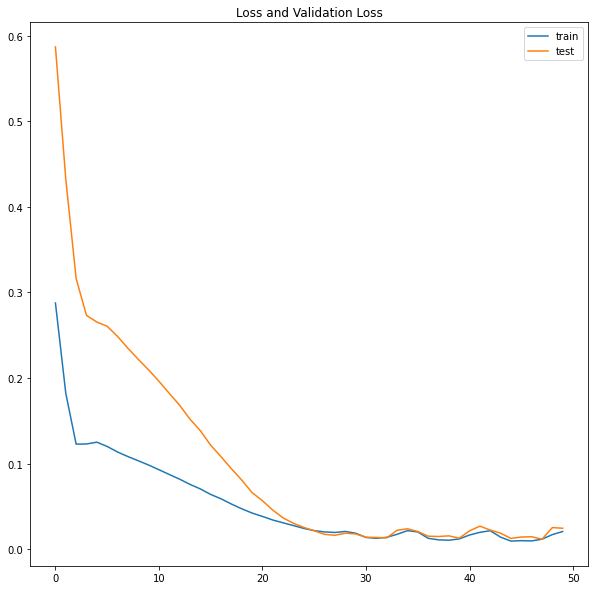

In [ ]:
# fitting the model
history_3d_googl_lv = model_3d_googl_lv.fit(x_train_3d_lv, ytrain_3d_lv, epochs=50, batch_size=72, validation_data=(x_test_3d_lv, ytest_3d_lv), verbose=2, shuffle=False)

# plot history
plt.figure(figsize=(10,10))
plt.plot(history_3d_googl_lv.history['loss'], label='train')
plt.plot(history_3d_googl_lv.history['val_loss'], label='test')
plt.title('Loss and Validation Loss')
plt.legend()
plt.show()

In [ ]:
# predicting with the help of trained LSTM model
ypred_test_3d_lv = model_3d_googl_lv.predict(x_test_3d_lv)
ypred_train_3d_lv = model_3d_googl_lv.predict(x_train_3d_lv)

# inverting the scaling for predicted train and test values
ypred_test_3d_lv_inv = inv_transform(scaler_3d_googl,ypred_test_3d_lv,'low_value',scaler_cols)
ypred_train_3d_lv_inv = inv_transform(scaler_3d_googl,ypred_train_3d_lv,'low_value',scaler_cols)

# inverting the scaling for actual test values
ytest_3d_lvn = ytest_3d_lv.reshape((len(ytest_3d_lv), 1))
ytest_3d_lv_inv = inv_transform(scaler_3d_googl,ytest_3d_lv,'low_value',scaler_cols)

# calculating the RMSE score
rmse_3d_lv = np.sqrt(mean_squared_error(ytest_3d_lv_inv, ypred_test_3d_lv_inv))
print('Test RMSE for googl low_value: %.3f' % rmse_3d_lv)

Test RMSE for googl low_value: 24.949


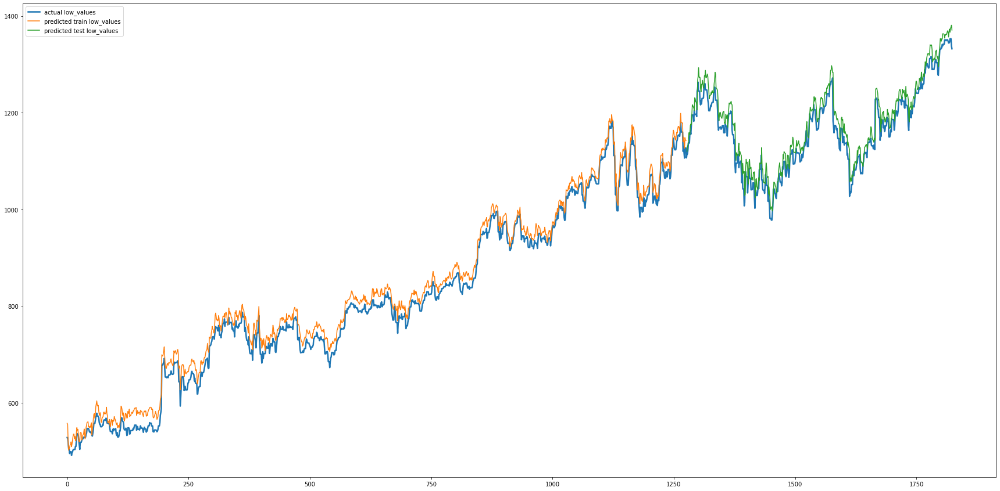

In [ ]:
# plotting original low_values, predicted train low_values and predicted test low_values

# shifting train predictions for plotting
ypred_train_3d_lv_inv_plt = np.empty_like(np.array(googl_input_3d['low_value']))
ypred_train_3d_lv_inv_plt[:] = np.nan
ypred_train_3d_lv_inv_plt[0:len(ypred_train_3d_lv_inv)] = ypred_train_3d_lv_inv

# shifting test predictions for plotting
ypred_test_3d_lv_inv_plt = np.empty_like(np.array(googl_input_3d['low_value']))
ypred_test_3d_lv_inv_plt[:] = np.nan
ypred_test_3d_lv_inv_plt[len(ypred_train_3d_lv_inv)+1:len(np.array(googl_input_3d['low_value']))] = ypred_test_3d_lv_inv

plt.figure(figsize=(30,15))
plt.plot(np.array(googl_input_3d['low_value']),label='actual low_values',linewidth=2.5)
plt.plot(ypred_train_3d_lv_inv_plt,label='predicted train low_values',linestyle='-')
plt.plot(ypred_test_3d_lv_inv_plt,label='predicted test low_values',linestyle='-')
plt.legend()
plt.show()

**For high_value**

Epoch 1/50
18/18 - 2s - loss: 0.3449 - val_loss: 0.6827 - 2s/epoch - 133ms/step
Epoch 2/50
18/18 - 0s - loss: 0.2374 - val_loss: 0.5427 - 69ms/epoch - 4ms/step
Epoch 3/50
18/18 - 0s - loss: 0.1526 - val_loss: 0.3900 - 83ms/epoch - 5ms/step
Epoch 4/50
18/18 - 0s - loss: 0.1235 - val_loss: 0.3090 - 82ms/epoch - 5ms/step
Epoch 5/50
18/18 - 0s - loss: 0.1303 - val_loss: 0.2869 - 86ms/epoch - 5ms/step
Epoch 6/50
18/18 - 0s - loss: 0.1283 - val_loss: 0.2819 - 93ms/epoch - 5ms/step
Epoch 7/50
18/18 - 0s - loss: 0.1225 - val_loss: 0.2740 - 81ms/epoch - 5ms/step
Epoch 8/50
18/18 - 0s - loss: 0.1168 - val_loss: 0.2622 - 71ms/epoch - 4ms/step
Epoch 9/50
18/18 - 0s - loss: 0.1116 - val_loss: 0.2489 - 92ms/epoch - 5ms/step
Epoch 10/50
18/18 - 0s - loss: 0.1067 - val_loss: 0.2360 - 84ms/epoch - 5ms/step
Epoch 11/50
18/18 - 0s - loss: 0.1016 - val_loss: 0.2227 - 69ms/epoch - 4ms/step
Epoch 12/50
18/18 - 0s - loss: 0.0962 - val_loss: 0.2090 - 83ms/epoch - 5ms/step
Epoch 13/50
18/18 - 0s - loss: 0.0905

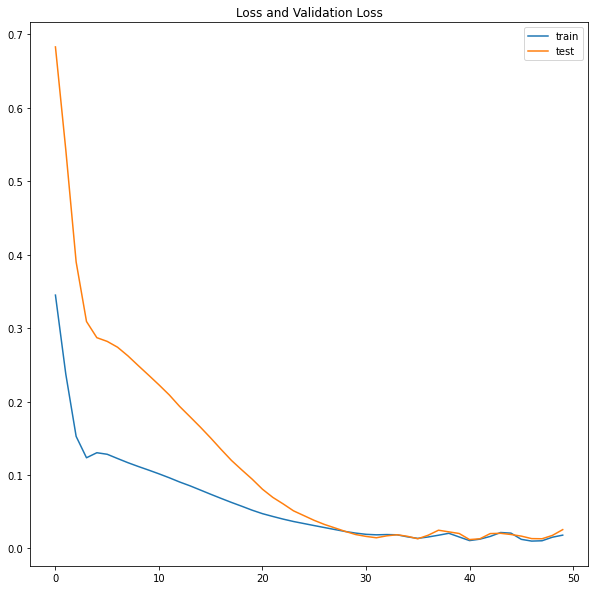

In [ ]:
# fitting the model
history_3d_googl_hv = model_3d_googl_hv.fit(x_train_3d_hv, ytrain_3d_hv, epochs=50, batch_size=72, validation_data=(x_test_3d_hv, ytest_3d_hv), verbose=2, shuffle=False)

# plot history
plt.figure(figsize=(10,10))
plt.plot(history_3d_googl_hv.history['loss'], label='train')
plt.plot(history_3d_googl_hv.history['val_loss'], label='test')
plt.title('Loss and Validation Loss')
plt.legend()
plt.show()

In [ ]:
# predicting with the help of trained LSTM model
ypred_test_3d_hv = model_3d_googl_hv.predict(x_test_3d_hv)
ypred_train_3d_hv = model_3d_googl_hv.predict(x_train_3d_hv)

# inverting the scaling for predicted train and test values
ypred_test_3d_hv_inv = inv_transform(scaler_3d_googl,ypred_test_3d_hv,'high_value',scaler_cols)
ypred_train_3d_hv_inv = inv_transform(scaler_3d_googl,ypred_train_3d_hv,'high_value',scaler_cols)

# inverting the scaling for actual test values
ytest_3d_hvn = ytest_3d_hv.reshape((len(ytest_3d_hv), 1))
ytest_3d_hv_inv = inv_transform(scaler_3d_googl,ytest_3d_hv,'high_value',scaler_cols)

# calculating the RMSE score
rmse_3d_hv = np.sqrt(mean_squared_error(ytest_3d_hv_inv, ypred_test_3d_hv_inv))
print('Test RMSE for googl high_value: %.3f' % rmse_3d_hv)

Test RMSE for googl high_value: 25.979


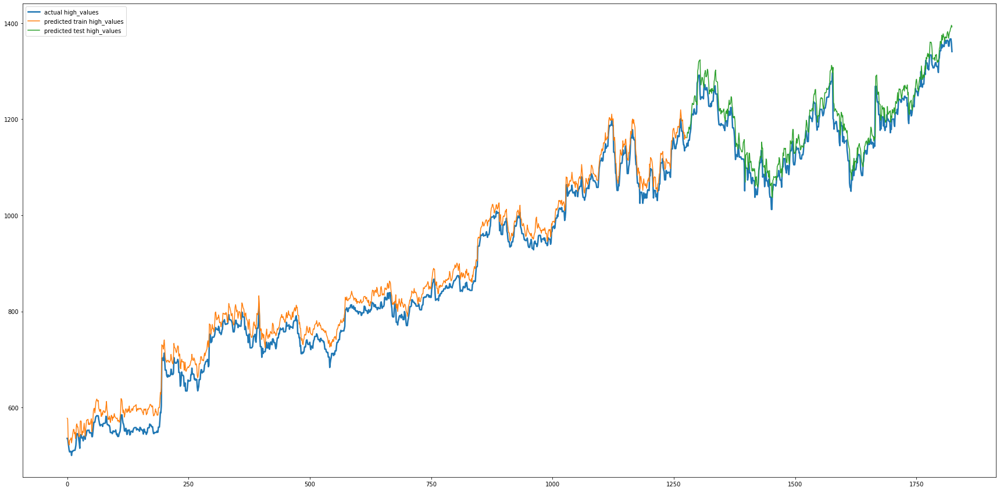

In [ ]:
# plotting original high_values, predicted train high_values and predicted test high_values

# shifting train predictions for plotting
ypred_train_3d_hv_inv_plt = np.empty_like(np.array(googl_input_3d['high_value']))
ypred_train_3d_hv_inv_plt[:] = np.nan
ypred_train_3d_hv_inv_plt[0:len(ypred_train_3d_hv_inv)] = ypred_train_3d_hv_inv

# shifting test predictions for plotting
ypred_test_3d_hv_inv_plt = np.empty_like(np.array(googl_input_3d['high_value']))
ypred_test_3d_hv_inv_plt[:] = np.nan
ypred_test_3d_hv_inv_plt[len(ypred_train_3d_hv_inv)+1:len(np.array(googl_input_3d['high_value']))] = ypred_test_3d_hv_inv

plt.figure(figsize=(30,15))
plt.plot(np.array(googl_input_3d['high_value']),label='actual high_values',linewidth=2.5)
plt.plot(ypred_train_3d_hv_inv_plt,label='predicted train high_values',linestyle='-')
plt.plot(ypred_test_3d_hv_inv_plt,label='predicted test high_values',linestyle='-')
plt.legend()
plt.show()